
# Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones

<center>
<img 
     src="http://www2.famaf.unc.edu.ar/~efernandez/egeo/img/logos/famaf.jpg" 
     alt="Drawing" 
     style="width:30%;"
/>
</center>

### Universidad Nacional de Córdoba
---

# Practico: Curación y Exploración de Datos

En la siguiente notebook, se presentará la consigna a seguir para el segundo práctico de la materia Exploración y Curación. El objetivo consiste en identificar e implementar los pasos necesarios para la limpieza de la base de datos, así como también analizar cruces de datos con mayor profundidad y validando el sentido lógico. 

Dataset: [here](https://drive.google.com/file/d/1wCNrWQbUd_bh1mdjZ-dg3g9y0r02JyQN/view?usp=sharing)

In [19]:
#!pip install missingno
#!pip install pyarrow
#!pip install sklearn

In [1]:
import pyarrow
import pyarrow.parquet as pq
import fastparquet
import pandas as pd
import missingno as msno
import hashlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import sklearn

from datetime import datetime, date
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.experimental import enable_iterative_imputer
from sklearn import (base, decomposition, feature_extraction, impute,
                     neighbors, preprocessing)
from typing import List, Tuple, Union
from hashlib import sha256


In [21]:
sns.set_context(context='talk', font_scale=1.5)

In [22]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth', -1)
#

In [23]:
def to_categorical(column, bin_size=10, min_cut=0, max_cut=50):
    if min_cut is None:
        min_cut = int(round(column.min())) - 1
    value_max = int(np.ceil(column.max()))
    max_cut = min(max_cut, value_max)
    intervals = [(x, x + bin_size) for x in range(min_cut, max_cut, bin_size)]
    if max_cut != value_max:
        intervals.append((max_cut, value_max))
    print(intervals)
    return pd.cut(column, pd.IntervalIndex.from_tuples(intervals))

In [24]:
date_regex = r'^(-?(?:[1-9][0-9]*)?[0-9]{4})-(1[0-2]|0[1-9])-(3[01]|0[1-9]|[12][0-9])?$'
match_iso8601 = re.compile(date_regex).match
def validate_iso8601(str_val):
    try:            
        if match_iso8601( str_val ) is not None:
            return True
    except:
        pass
    return False

In [25]:
def calculate_age(row):
    born= row['fecha_nacimiento']
    born = datetime.strptime(born, '%Y-%m-%d')
    fecha_cupon = datetime.strptime(row['fecha_cupon_movimiento'], '%Y-%m-%d')
    return fecha_cupon.year - born.year - ((fecha_cupon.month, fecha_cupon.day) < (born.month, born.day))

In [26]:
def calculate_ant(row):
    antig= row['fecha_de_ingreso_histo']
    antig = datetime.strptime(antig, '%Y-%m-%d')
    fecha_cupon = datetime.strptime(row['fecha_cupon_movimiento'], '%Y-%m-%d')
    return (fecha_cupon.year - antig.year) * 12 + (fecha_cupon.month - antig.month)

#fecha_cupon.year - antig.year - ((fecha_cupon.month, fecha_cupon.day) < (antig.month, antig.day))

In [27]:
def hashit(val: str) -> str:
    return sha256(val.encode('utf-8')).hexdigest()

## Carga DF

In [28]:
df = pd.read_parquet("/home/mpccolorado/cupones_ds.parquet")
#df=df.sample(1000000, random_state=0)
#df_copy= df.copy()

In [29]:
df.drop_duplicates(keep='first', inplace=True, ignore_index=True)

In [30]:
df.to_parquet('cupones_ds_clean.parquet', engine='fastparquet')

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124316 entries, 0 to 124315
Data columns (total 41 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   dni_titular_movimiento               124316 non-null  object 
 1   moneda_movimiento                    124316 non-null  int64  
 2   id_comercio_movimiento               124316 non-null  int64  
 3   nombre_comercio_histo                124316 non-null  object 
 4   numero_cupon_movimiento              124316 non-null  int64  
 5   debito_credito_movimiento            124316 non-null  int64  
 6   producto_naranja_movimiento          124316 non-null  object 
 7   codigo_empresa_movimiento            124316 non-null  int64  
 8   tipo_producto_tarjeta_movimiento     124316 non-null  int64  
 9   plan_movimiento                      124316 non-null  int64  
 10  fecha_vto_cupon_movimiento           124316 non-null  object 
 11  fecha_present

## Cuestiones de la Parte 1:

#### Agregamos columna de mes-año.

In [32]:
fecha='fecha_cupon_movimiento'
#Convertimos la columna de fecha a datetime
df.loc[:, 'fecha_datetime'] = df[fecha].apply(lambda fecha: datetime.strptime(fecha, '%Y-%m-%d'))
#Creamos una nueva columna para mostrar el año y la fecha en una nueva columna (para poder hacer el merge con la tabla inflacionaria)
fecha='fecha_datetime'
df.loc[:, 'mes-año'] = df[fecha].apply(lambda fecha: datetime.strftime(fecha, '%Y-%m'))
df.loc[:, 'año'] = df[fecha].apply(lambda fecha: datetime.strftime(fecha, '%Y'))
df[:3]

,dni_titular_movimiento,moneda_movimiento,id_comercio_movimiento,nombre_comercio_histo,numero_cupon_movimiento,debito_credito_movimiento,producto_naranja_movimiento,codigo_empresa_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,...,ciudad,domicilio_codigo_postal,domicilio_barrio,fecha_de_ingreso_histo,cargo_descripcion_histo,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,fecha_datetime,mes-año,año
0,0001686b52949b5461ffcbc766687e45031,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,LA TABLADA,1766.0,LA TABLADA,2012-12-11,EMP.DE COMERCIO,SECUNDARIOS,Propia,2020-08-25,2020-08,2020
1,000220fa96ec5af89817894033f8099c547,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,VA.NVA. DE GUAYMALLEN,5521.0,GLLEN,2020-06-10,SIN DATOS,None,None,2020-08-25,2020-08,2020
2,0002be202de47dfae9cc2304d91161be595,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,SANTA TERESITA,7107.0,SANTA TERESITA,2012-09-13,SIN DATOS,PRIMARIOS,Otros,2020-08-25,2020-08,2020


Agregamos tb la columna sólo mes porque nos va a ser más relevante saber el mes del movimiento independientemente del año

In [33]:
df.loc[:, 'mes'] = df[fecha].apply(lambda fecha: datetime.strftime(fecha, '%m')).astype(int)

In [34]:
df.dtypes

dni_titular_movimiento                         object
moneda_movimiento                               int64
id_comercio_movimiento                          int64
nombre_comercio_histo                          object
numero_cupon_movimiento                         int64
debito_credito_movimiento                       int64
producto_naranja_movimiento                    object
codigo_empresa_movimiento                       int64
tipo_producto_tarjeta_movimiento                int64
plan_movimiento                                 int64
fecha_vto_cupon_movimiento                     object
fecha_presentacion_movimiento                  object
fecha_cupon_movimiento                         object
fecha_carga_sistema_movimiento                 object
monto_compra_movimiento                       float64
importe_cuota_movimiento                      float64
interes_movimiento                            float64
cargo_adm_seguro_movimiento                   float64
cargo_otorgamiento_movimient

#### Preparación del monto_compra_movimiento.

**Inflación:** Cuando en Argentina hablamos de pesos a lo largo del tiempo, no debemos pasar por alto la inflación. Brevemente explicado, la inflación es lo que hace que, por ejemplo, 100 pesos en 02/2020 no valga lo mismo que 100 pesos en 05/2021 (los $ 100 de 05/2021 te permite comprar menos que el de 02/2020).
Por esto consideramos fundamental para analizar el monto homogenizar la moneda, ajustando dichos montos por un coeficiente de ajuste por inflación.
Elegimos utilizar un indice publico que brinda la Federación Argentina de Consejos Profesionales de Ciencias Económicas.
El metodo seleccionado para ajustar es ajustar los valores pasados para traer su equivalente en el ultimo mes de movimiento (05/2021).

Fuente: https://www.facpce.org.ar/indices-facpce/

**Dolares:** A su vez el dataset posee movimientos en dolares, otro aspecto que debemos considerar a la hora de comprar montos. decidimos convertir los valores en dolares a pesos. Para esto utilizamos el  tipo de cambio del Banco Nación, con todos los impuestos (30% + 35 %), del día del ultimo movimiento. Eso hace que no solo convierta en pesos sino tambien lo ajusta al valor de hoy, por lo que a estos valores no se debería aplicar el ajuste por inflación.

https://www.bna.com.ar/Personas

In [35]:
#rango de Fechas
df.mes.min(),df.fecha_cupon_movimiento.max()

(1, '2021-05-25')

In [36]:
tabla_inflacion= [
    ['2020-01',1.617],
    ['2020-02',1.585],
    ['2020-03',1.534],
    ['2020-04',1.511],
    ['2020-05',1.488],
    ['2020-06',1.456],
    ['2020-07',1.428],
    ['2020-08',1.391],
    ['2020-09',1.352],
    ['2020-10',1.303],
    ['2020-11',1.263],
    ['2020-12',1.215],
    ['2021-01',1.167],
    ['2021-02',1.127],
    ['2021-03',1.075],
    ['2021-04',1.033],
    ['2021-05',1.000]
]

ind_inflacion = pd.DataFrame(tabla_inflacion, columns = ['mes-año', 'ind_inflacion'])

In [37]:
tc_usd=155.892
df = df.merge(ind_inflacion, on='mes-año')

def normalizar_monto(monto, multiplicador, moneda):
    #Acá deberíamos pasar también la moneda y la cotización
    if moneda == 1:
      return monto * tc_usd
    return monto * multiplicador

df.loc[:, 'monto_normalizado'] = df[['monto_compra_movimiento', 'ind_inflacion','moneda_movimiento']].apply(lambda row: normalizar_monto(row['monto_compra_movimiento'], row['ind_inflacion'], row['moneda_movimiento']), axis=1).round(2)

In [38]:
df.head()

,dni_titular_movimiento,moneda_movimiento,id_comercio_movimiento,nombre_comercio_histo,numero_cupon_movimiento,debito_credito_movimiento,producto_naranja_movimiento,codigo_empresa_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,...,fecha_de_ingreso_histo,cargo_descripcion_histo,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,fecha_datetime,mes-año,año,mes,ind_inflacion,monto_normalizado
0,0001686b52949b5461ffcbc766687e45031,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,2012-12-11,EMP.DE COMERCIO,SECUNDARIOS,Propia,2020-08-25,2020-08,2020,8,1.391,8.68
1,000220fa96ec5af89817894033f8099c547,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,2020-06-10,SIN DATOS,None,None,2020-08-25,2020-08,2020,8,1.391,24.66
2,0002be202de47dfae9cc2304d91161be595,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,2012-09-13,SIN DATOS,PRIMARIOS,Otros,2020-08-25,2020-08,2020,8,1.391,8.60
3,000e137d0af42e193be1ff670c00d4d1506,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,2008-01-15,EMP.DE COMERCIO,SECUNDARIOS,Propia,2020-08-25,2020-08,2020,8,1.391,3.94
4,0009d010e4faf69552a814a33832b185877,0,20099784,INTERES POR MORA U$S,200813,0,PL,1,0,1,...,2013-06-06,EMP.DE COMERCIO,UNIVERSITARIOS,Alquilada,2020-08-25,2020-08,2020,8,1.391,3.31


# 1. Curación
Con el objetivo de preparar los datos que alimentarán futuros modelos de aprendizaje automático

* Asegurar IDs únicos
  > Ejm. `id_comercio_movimiento` le corresponde un mismo `nombre_comercio_histo`?
* Asegurar que el codigo postal tenga el tipo de datos correcto.
* Tratamiento de valores Sensibles
  > Ejm. cuando se tienen datos como el DNI, CUIL o Nro de Tarjetas correponde a datos confidenciales
  - Codifcar los valores usando el algoritmo `sha256` con la libreria `hashlib`
* Reemplazar caracteres especiales. Ejm
  ```
  ñ. Ñ. ~. ç. Ç. á. é. í. ó. ú. Á. É. Í. Ó. Ú. ü. Ü.
  @. ¡ ! ¿ ? ⁄. \. °. —. (. ) [. ] {. } 〈. 〉 ‹ › <. > 
  〔. 〕 « » ¹. ². ³ … ˜. §. ¶.  †. “ ” ∞. µ. à.
  ```
* Asegurar que las fechas tengan el formato ISO 8601, `YYYY-MM-DD`
* Agrupar valores de `cargo_descripcion_histo`.
  > Ejm. si tenemos un valor con`vigilador` y otro `sereno`, estos corresponden a una misma categoria., 

##  A) ID Unicos

* Asegurar IDs únicos
  > Ejm. `id_comercio_movimiento` le corresponde un mismo `nombre_comercio_histo`?

#### Curación de la variable
Antes de prodecer al analisis, vamos a corregir el tipo de datos y los posibles errores que pueden contener al ser importado como un integer cuando corresponde ser un string.

In [39]:
#Convierto a tipo de dato string
df.loc[:,'id_comercio_movimiento']=df.id_comercio_movimiento.astype(str)
df.dtypes[2:3]

id_comercio_movimiento    object
dtype: object

In [40]:
#consulto longitudes de los textos
df.id_comercio_movimiento.str.len().unique()

array([8, 9])

In [41]:
#completamos con 0 adelnate de la cadena a cada valor que tiene menos de 9 dígitos.
df.loc[:,'id_comercio_movimiento_ok']=df.id_comercio_movimiento.str.zfill(9).astype(str)
df.id_comercio_movimiento_ok.str.len().unique()

array([9])

#### Analisis de Valores Unicos

In [42]:
print(df.id_comercio_movimiento.nunique(), df.nombre_comercio_histo.nunique())

3833 7166


In [43]:
groups = df.groupby(["id_comercio_movimiento", "nombre_comercio_histo"]).count()
groups[:10]

dni_titular_movimiento  \
id_comercio_movimiento nombre_comercio_histo                                              
100000237              TS TIENDAS                                                     1   
                       TS TIENDAS                                                     1   
100002423              CASA DE PEDRO                                                  2   
                       CASA DE PEDRO                                                  2   
100003130              GRIMOLDI CENTRO                                                2   
                       GRIMOLDI CENTRO                                                2   
100005898              FERNIPLAST                                                    21   
                       FERNIPLAST                                                    21   
100006572              EL MUNDO DEL LIBRO S.R.L                                       1   
                       EL MUNDO DEL LIBRO S.R.L                                       1   

                                                                 moneda_movimiento  \
id_comercio_movimiento nombre_comercio_histo                                         
100000237              TS TIENDAS                                                1   
                       TS TIENDAS                                                1   
100002423              CASA DE PEDRO                                             2   
                       CASA DE PEDRO                                             2   
100003130              GRIMOLDI CENTRO                                           2   
                       GRIMOLDI CENTRO                                           2   
100005898              FERNIPLAST                                               21   
                       FERNIPLAST                                               21   
100006572              EL MUNDO DEL LIBRO S.R.L                                  1   
                       EL MUNDO DEL LIBRO S.R.L                                  1   

                                                                 numero_cupon_movimiento  \
id_comercio_movimiento nombre_comercio_histo                                               
100000237              TS TIENDAS                                                      1   
                       TS TIENDAS                                                      1   
100002423              CASA DE PEDRO                                                   2   
                       CASA DE PEDRO                                                   2   
100003130              GRIMOLDI CENTRO                                                 2   
                       GRIMOLDI CENTRO                                                 2   
100005898              FERNIPLAST                                                     21   
                       FERNIPLAST                                                     21   
100006572              EL MUNDO DEL LIBRO S.R.L                                        1   
                       EL MUNDO DEL LIBRO S.R.L                                        1   

                                                                 debito_credito_movimiento  \
id_comercio_movimiento nombre_comercio_histo                                                 
100000237              TS TIENDAS                                                        1   
                       TS TIENDAS                                                        1   
100002423              CASA DE PEDRO                                                     2   
                       CASA DE PEDRO                                                     2   
100003130              GRIMOLDI CENTRO                                                   2   
                       GRIMOLDI CENTRO                                                   2   
100005898              FERNIPLAST                                                 

#### Quitamos espacios:
Se pueden ver que hay varios id que tienen el mismo nombre pero estan separados, pudimos notar que eso se debe a que al final de los strings poseen espacios en blancos que dificultan su analisis, procedemos a eliminarlos.

In [44]:
groups.reset_index().values[1][1], groups.reset_index().values[2][1]

('TS TIENDAS                              ', 'CASA DE PEDRO')

In [45]:
df.loc[:, "nombre_comercio_histo_ok"] = df.nombre_comercio_histo.str.strip()

In [46]:
print(df.id_comercio_movimiento.nunique(), df.nombre_comercio_histo_ok.nunique())

3833 3716


In [47]:
#Encontramos distintos nombre de comercio para el mismo id (nombres similares que vamos a reemplazar por uno)
groups2 = df[["id_comercio_movimiento", "nombre_comercio_histo_ok",'monto_compra_movimiento']].groupby(["id_comercio_movimiento"]).nunique()
groups2=groups2.sort_values(by='nombre_comercio_histo_ok', ascending=False)

groups2[groups2['nombre_comercio_histo_ok']>1]

,nombre_comercio_histo_ok,monto_compra_movimiento
id_comercio_movimiento,,
100473575,4,7
262002246,4,16
114009772,3,1
770038100,3,1
260028472,3,1
...,...,...
380022115,2,10
120012388,2,1
100446383,2,5


In [48]:
#Ejemplo:
ver= df[df['id_comercio_movimiento']=="262002246"].groupby(['nombre_comercio_histo_ok']).count()[['monto_compra_movimiento']].sort_values(by='monto_compra_movimiento', ascending=False)
ver.reset_index()['nombre_comercio_histo_ok']

0    ASEGURADORA TOTAL MOTOVEHICULA
1               ATM CIA. DE SEGUROS
2                         ATMCIASEG
3            COMUNIDAD MOTOCICLISTA
Name: nombre_comercio_histo_ok, dtype: object

In [49]:
for group in groups2.reset_index()['id_comercio_movimiento']:
    #print(group)
    id_comercio= group
    df_unico_nombre= df[df['id_comercio_movimiento']==id_comercio].groupby(['nombre_comercio_histo_ok']).count()[['monto_compra_movimiento']].sort_values(by='monto_compra_movimiento', ascending=False)
    df_unico_nombre=df_unico_nombre.reset_index()
    #print(df_unico_nombre[:1]['nombre_comercio_histo_ok'])
    #print(df_unico_nombre[:1]['nombre_comercio_histo_ok'].values[0])
    df.loc[df['id_comercio_movimiento']==group, 'nombre_comercio_histo_ok'] = df_unico_nombre[:1]['nombre_comercio_histo_ok'].values[0]

In [50]:
ver= df[df['id_comercio_movimiento']=='262002246'].groupby(['nombre_comercio_histo_ok']).count()[['monto_compra_movimiento']].sort_values(by='monto_compra_movimiento', ascending=False)
ver.reset_index()['nombre_comercio_histo_ok']

0    ASEGURADORA TOTAL MOTOVEHICULA
Name: nombre_comercio_histo_ok, dtype: object

In [51]:
df.shape

(124316, 49)

#### Conclusión: 
Luego de haber limpiado los espacios en blanco de los nombre de los comercios, nos encontramos con 190 id de comercio que contaban con mas de 1 nombre. Luego de visualizar algunos ejemplos nos dimos cuenta que si bien son nombres distintos refieren al mismo comercio. Por lo que decidimos reemplazar el nombre por el del local con mayor frecuencia.

## B) Tipo dato Cod. Postal.

* Asegurar que el codigo postal tenga el tipo de datos correcto.

Se puede ver que le codigo postal es un dato float64, lo que nos parece inadecuado. El codigo postal si bien es un dato numerico, este no va a utilizar las propiedades y/o funciones de los numeros en sí, como por ejemplo: suma, resta, multiplicación,etc. Además al dejarlo como número si existen valores con el caracter 0 adelante se borrarían y no es lo que queremos para esta variable.
Procedemos a cambiarlo a string. 
Si bien esta variable no va a formar parte de nuestro dataset final, la convertimos para imputar los valores de provincia faltantes mediante esta.

In [52]:
#convierto a string
df.loc[:,'domicilio_codigo_postal']=df.domicilio_codigo_postal.astype(str)

In [53]:
df.dtypes[35:36]

domicilio_codigo_postal    object
dtype: object

#### Valores Erroneos: 
Los códigos postales en Argentina tienen 4 dígitos, por lo que los valores que tienen menos que estos son considerados errores. (Luego serán reimputados).

In [54]:
#controlamos que todos los codigos postales tengan la misma longitud
df.domicilio_codigo_postal.str.len().unique()

array([6, 3, 5])

In [55]:
# Filtrar datos con codigos postales menores a 6 digitos. A reimputar
df[df.domicilio_codigo_postal.str.len()<6]['domicilio_codigo_postal'].count()

1003

## C) Valores Sensibles


* Tratamiento de valores Sensibles
  > Ejm. cuando se tienen datos como el DNI, CUIL o Nro de Tarjetas correponde a datos confidenciales
  - Codifcar los valores usando el algoritmo `sha256` con la libreria `hashlib`
 

In [56]:
#generamos una muestra para aplicar el procedimiento.
df_hash= df.sample(1000)[['dni_titular_movimiento']]


In [57]:
df_hash.loc[:,'dni_hash']= df_hash['dni_titular_movimiento'].apply(hashit)
df_hash

,dni_titular_movimiento,dni_hash
65607,0000e456f28cb005650217180d4e4ccf912,39254afe0e02094d56681d16514c21f70780c257b53181...
67590,000a0afc48e19badad3197ab43801c2d312,6241376f9787227dab49cb69e87c255d480031afb18ac0...
87621,000eff02871f717d5c860eae9e0347a5523,30030e28e559928bbed49460e383e7aebaa63e65a73a48...
3031,0003ac05e2c6e2b2de16a774a8069e5a166,6ff6fcfbaa40854e15f8ce2ac4121e6209f0f68541d187...
91678,000262917a925b8dadc3c9c39cf2a8e8967,6a5b5c1884327cdd728e39e9e383bd6486aebc8e921e83...
...,...,...
32784,0000291cdb5b73d5606cbe1038474825058,3af0484aafbd6f0c8c329b17b1dd686447357169fe2714...
91399,00008bff3959769cbba1fa4b45fcb91b187,f39be9617712f8009c1f4b9c5023714159e782ae337eae...
69201,000b31f56a795f5d1439678ced335a25947,229dfe80ed21a2ce432a05f7863b88e711f51aaf9865d2...
36349,0004b720a2f5cad55b88e1a0e79d8cdd546,abb6cf254892f2d22819ee9daa0c3b72eac2d17ac09aec...


## D) Caracteres Especiales

* Reemplazar caracteres especiales. Ejm
  ```
  ñ. Ñ. ~. ç. Ç. á. é. í. ó. ú. Á. É. Í. Ó. Ú. ü. Ü.
  @. ¡ ! ¿ ? ⁄. \. °. —. (. ) [. ] {. } 〈. 〉 ‹ › <. > 
  〔. 〕 « » ¹. ². ³ … ˜. §. ¶.  †. “ ” ∞. µ. à.

In [58]:
df = df.replace(["á","Á","é","É","í","Í","ó","Ó","ú","ü","Ú","Ü",r"[/_<>ñÑ~çÇ@¡!¿?«»¹²³…˜§¶†”∞µà⁄°—()${}〈〉‹›<>〔〕]"],["a","A","e","E","i","I","o","O","u","u","U","U",""], regex=True)
#df = df.replace(r"[./_<>ñÑ~çÇ@¡!¿?«»¹²³…˜§¶†”∞µà⁄°—()${}〈〉‹›<>〔〕]","", regex=True)
df.head()

,dni_titular_movimiento,moneda_movimiento,id_comercio_movimiento,nombre_comercio_histo,numero_cupon_movimiento,debito_credito_movimiento,producto_naranja_movimiento,codigo_empresa_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,...,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,fecha_datetime,mes-año,año,mes,ind_inflacion,monto_normalizado,id_comercio_movimiento_ok,nombre_comercio_histo_ok
0,0001686b52949b5461ffcbc766687e45031,0,20099784,INTERES POR MORA US,200813,0,PL,1,0,1,...,SECUNDARIOS,Propia,2020-08-25,2020-08,2020,8,1.391,8.68,020099784,INTERES POR MORA US
1,000220fa96ec5af89817894033f8099c547,0,20099784,INTERES POR MORA US,200813,0,PL,1,0,1,...,None,None,2020-08-25,2020-08,2020,8,1.391,24.66,020099784,INTERES POR MORA US
2,0002be202de47dfae9cc2304d91161be595,0,20099784,INTERES POR MORA US,200813,0,PL,1,0,1,...,PRIMARIOS,Otros,2020-08-25,2020-08,2020,8,1.391,8.60,020099784,INTERES POR MORA US
3,000e137d0af42e193be1ff670c00d4d1506,0,20099784,INTERES POR MORA US,200813,0,PL,1,0,1,...,SECUNDARIOS,Propia,2020-08-25,2020-08,2020,8,1.391,3.94,020099784,INTERES POR MORA US
4,0009d010e4faf69552a814a33832b185877,0,20099784,INTERES POR MORA US,200813,0,PL,1,0,1,...,UNIVERSITARIOS,Alquilada,2020-08-25,2020-08,2020,8,1.391,3.31,020099784,INTERES POR MORA US


## E) Formato Fechas
* Asegurar que las fechas tengan el formato ISO 8601, `YYYY-MM-DD`

In [59]:
df[df['fecha_cupon_movimiento'].apply(validate_iso8601)==False]
#df[df['fecha_nacimiento'].apply(validate_iso8601)==False]
#df[df['fecha_de_ingreso_histo'].apply(validate_iso8601)==False] 

,dni_titular_movimiento,moneda_movimiento,id_comercio_movimiento,nombre_comercio_histo,numero_cupon_movimiento,debito_credito_movimiento,producto_naranja_movimiento,codigo_empresa_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,...,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,fecha_datetime,mes-año,año,mes,ind_inflacion,monto_normalizado,id_comercio_movimiento_ok,nombre_comercio_histo_ok


#### Conclusión:
Comprobamos que todas las fechas cumplen con el formato ISO 8601, YYYY-MM-DD. 
El control se realizó solamente en las columnas fecha_cupon_movimeinto, fecha_de_ingreso_histo y en fecha_nacimiento ya que son las únicas quye se van a utilizar en el análisis.
Podemos ver que en fecha_nacimiento encontramos 10551 filas que no cumplen con el formato ya que son valores en blanco, mas adelante se resolverá este tema de faltantes.

## F) Agrupar Valores - cargo_descripción_histo

* Agrupar valores de `cargo_descripcion_histo`.
  > Ejm. si tenemos un valor con`vigilador` y otro `sereno`, estos corresponden a una misma categoria., 

In [60]:
df['cargo_descripcion_histo'].unique()

array(['EMP.DE COMERCIO', 'SIN DATOS', 'ENFERMERO', 'ADMINISTRATIVO',
       'OPERARIO', 'MAESTRANZA', 'PROPIETARIO', 'ENCARGADO',
       'VENDEDORPROMOT', 'CHOFER', 'JUBILADO', 'EMP.SEG.PUBLICA',
       'PEONEMBARCADOS', 'PRES.T.CREDITO', 'INDEPENDIENTE',
       'PROFESTECNICO', 'VIGILADOR', 'DOCENTE', 'CAJERO', 'PRES.GARANTIA',
       'COCINERO', 'JEFE', 'PORTEROCONSERJ', 'MOZO', 'MEDICO'],
      dtype=object)

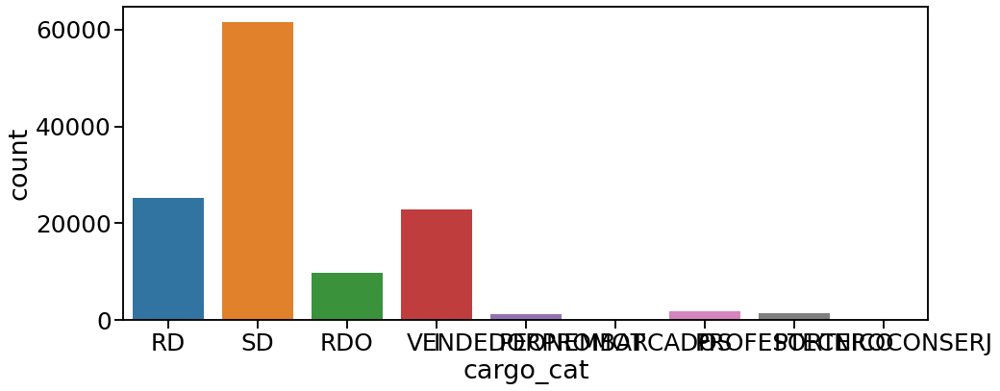

In [61]:
new_cats = {'EMP.DE COMERCIO':'RD',
'ADMINISTRATIVO':'RD',
'CHOFER':'RD',
'MAESTRANZA':'RD',
'VENDEDOR/PROMOT':'RD',
'OPERARIO':'RDO',
'ENFERMERO':'RDO',
'MOZO':'RDO',
'ENCARGADO':'RDO',
'PEON/EMBARCADOS':'RDO',
'JEFE':'RDO',
'CAJERO':'RD',
'COCINERO':'RDO',
'INDEPENDIENTE':'I',
'PROPIETARIO':'I',
'PROFES/TECNICO':'I',
'MEDICO':'I',
'DOCENTE':'I',
'JUBILADO':'I',
'EMP.SEG.PUBLICA':'RDO',
'VIGILADOR':'RDO',
'PORTERO/CONSERJ':'RDO',
'SIN DATOS':'SD',
'PRES.T.CREDITO':'F',
'PRES.GARANTIA':'F'}

df.loc[:,'cargo_cat']= df['cargo_descripcion_histo'].replace(new_cats)
fig=plt.figure(figsize=(15,6))
sns.countplot(data=df,x='cargo_cat')
plt.ticklabel_format(style='plain', axis='y')


#### Conclusión: 
Luego de observar la composición de la variable cargo_descripcion_histo, decidimos agruparlos en 5 categorías.
> A saber:
> - **RD:** Relación de dependencia - Empleados de Comercio (decidimos crear una categoría solo con estos valores ya que por conocimiento de dominio y por visualización de los datos sabemos que son mas numerosas que el resto de los sindicatos).
> - **I:** Profesiones Independientes.
> - **SD:** Sin Datos.
> - **F:** Financieros.
> - **RDO:** Relación de dependencia - Otros.

**Metodo:** Por conocimiento de dominio.

# 2. Data enrichment
* obtener edad usando la columna `fecha_nacimiento` y `fecha_cupon_movimiento`
* obtener antiguedad usando la columna `fecha_de_ingreso_histo` y `fecha_cupon_movimiento` en termino de meses
* usando la columna `nombre_comercio_histo` crear una nueva columna clasificando el tipo de "comercio". Ejemplo 
   ```
     COMISION POR MANTENIM.DE CTA., IMPUESTO SELLOS, INT.PAGO FUERA TERMINO ------> Categoria A
     MERCADO PAGO, DESPEGAR.COM                                             ------> Categoria B
   ```
   > Crear un minimo de 5 categorias
* se puede aplicar el proceso anterior a la columna `nombre_local_histo` y `cargo_descripcion_histo`. Aportaria informacion relevante?

## A) Obtener edad.

* obtener edad usando la columna `fecha_nacimiento` y `fecha_cupon_movimiento`

In [62]:
df.loc[:, 'edad'] = df[df["fecha_nacimiento"].notnull()].apply(calculate_age,axis=1)

In [63]:
df['edad'].unique()

array([ 61.,  29.,  28.,  39.,  36.,  35.,  58.,  74.,  46.,  47.,  44.,
        45.,  40.,  27.,  38.,  37.,  21.,  60.,  59.,  32.,  53.,  42.,
        55.,  75.,  33.,  43.,  34.,  85.,  87.,  82.,  71.,  51.,  49.,
        30.,  62.,  67.,  66.,  26.,  25.,  24.,  41.,  54.,  31.,  70.,
        nan,  57.,  80., 108.,  72.,  88.,  64.,  76.,  79.,  52.,  48.,
        68.,  73.,  63.,  69.,  65.,  56.,  50.,  90.,  83.,  78.,  77.,
        22.,  20.,  81., 100., 109.,  91.,  18.,  23.,  84.])

## B)  Obtener Antiguedad.

* obtener antiguedad usando la columna `fecha_de_ingreso_histo` y `fecha_cupon_movimiento` en termino de meses

In [64]:
# en termino de meses.
df.loc[:, 'antig'] = df[df["fecha_de_ingreso_histo"].notnull()].apply(calculate_ant,axis=1)

In [65]:
df['antig'].unique()

array([ 92,   2,  95, 151,  86, 110, 250, 114,  63, 260, 300,  33, 267,
        67, 143,  12,  14, 113,  96, 119, 121, 223, 188,  38,  20, 118,
        27,  29,  44,  98, 141, 150, 108,   6, 101, 193,  93,  19, 135,
        87,  99,  22, 140,  36, 253, 190, 275,  53,  54, 156, 183,  84,
       270,  55, 106,  48,  51,  94, 145,   5, 238,  80,  16,  52, 137,
        25, 168, 124, 154, 285, 213, 245, 104, 274, 166,  82,  65, 142,
        18, 102,  71,  32, 123, 180, 194, 112, 133, 246, 233, 172,  34,
        70, 242, 162,  15,  59,  50,  30,  39,   8,  58, 178,  79, 239,
        45,  26,  42,  43, 176, 281, 237,  61, 148,  73,  64, 149, 357,
        81, 269, 152,  35,  97,  72, 278,  40, 129, 279, 283, 256,  24,
       175, 134, 103, 252, 179, 198, 265,  57, 210, 197, 144, 230, 126,
       107, 187, 174, 189, 262, 263, 282, 130, 177, 268,   3,  77,  46,
       161,   9, 164, 122,  62,  17, 214, 240, 125,   7,  21, 153, 247,
       132,  56,  66,  78, 185, 139,  47,  23, 127, 109, 248,  7

In [66]:
df.shape

(124316, 52)

## C) Categorías Nombre Comercio.

* usando la columna `nombre_comercio_histo` crear una nueva columna clasificando el tipo de "comercio". Ejemplo 
   ```
     COMISION POR MANTENIM.DE CTA., IMPUESTO SELLOS, INT.PAGO FUERA TERMINO ------> Categoria A
     MERCADO PAGO, DESPEGAR.COM                                             ------> Categoria B
   ```
   > Crear un minimo de 5 categorias


#### Metodo: 
Para agrupar esta categoría utilizamos un criterio que utiliza la empresa a la hora de agrupar los comercios, esta es mediante los 3 primeros dígitos del id. de comercio).

In [67]:
df.nombre_comercio_histo_ok.nunique()

3585

In [68]:
#tomamos los 3 primeros dígitos. Se hace prueba con un digito para acortar las columnas (no da la compu)
#df.loc[:,'cat_comercio']=df.id_comercio_movimiento_ok.astype('string').str[0:3]
df.loc[:,'cat_comercio']=df.id_comercio_movimiento_ok.astype('string').str[0]
df.cat_comercio.nunique()


10

In [69]:
df.groupby(['cat_comercio','nombre_comercio_histo_ok']).count()

dni_titular_movimiento  \
cat_comercio nombre_comercio_histo_ok                                 
0            APP NARANJA                                          6   
             APP NARANJA TARJETA DEBITO PLA                       6   
             APP NARANJA-TARJETA DEBITO PP                        8   
             ATM 1- ALTA CORDOBA                                  2   
             AVENGERS                                           102   
...                                                             ...   
9            WALMART COMODORO RIVADAVIA                          18   
             WALMART COMODORO RIVADAVIA 2                         3   
             WALMART SAN JUSTO                                    9   
             YENNY COMODORO RIVADAVIA                             2   
             YPF COMODORO RIVADAVIA                               2   

                                             moneda_movimiento  \
cat_comercio nombre_comercio_histo_ok                            
0            APP NARANJA                                     6   
             APP NARANJA TARJETA DEBITO PLA                  6   
             APP NARANJA-TARJETA DEBITO PP                   8   
             ATM 1- ALTA CORDOBA                             2   
             AVENGERS                                      102   
...                                                        ...   
9            WALMART COMODORO RIVADAVIA                     18   
             WALMART COMODORO RIVADAVIA 2                    3   
             WALMART SAN JUSTO                               9   
             YENNY COMODORO RIVADAVIA                        2   
             YPF COMODORO RIVADAVIA                          2   

                                             id_comercio_movimiento  \
cat_comercio nombre_comercio_histo_ok                                 
0            APP NARANJA                                          6   
             APP NARANJA TARJETA DEBITO PLA                       6   
             APP NARANJA-TARJETA DEBITO PP                        8   
             ATM 1- ALTA CORDOBA                                  2   
             AVENGERS                                           102   
...                                                             ...   
9            WALMART COMODORO RIVADAVIA                          18   
             WALMART COMODORO RIVADAVIA 2                         3   
             WALMART SAN JUSTO                                    9   
             YENNY COMODORO RIVADAVIA                             2   
             YPF COMODORO RIVADAVIA                               2   

                                             nombre_comercio_histo  \
cat_comercio nombre_comercio_histo_ok                                
0            APP NARANJA                                         6   
             APP NARANJA TARJETA DEBITO PLA                      6   
             APP NARANJA-TARJETA DEBITO PP                       8   
             ATM 1- ALTA CORDOBA                                 2   
             AVENGERS                                          102   
...                                                            ...   
9            WALMART COMODORO RIVADAVIA                         18   
             WALMART COMODORO RIVADAVIA 2                        3   
             WALMART SAN JUSTO                                   9   
             YENNY COMODORO RIVADAVIA                            2   
             YPF COMODORO RIVADAVIA                              2   

                                             numero_cupon_movimiento  \
cat_comercio nombre_comercio_histo_ok                                  
0            APP NARANJA                                           6   
             APP NARANJA TARJETA DEBITO PLA                        6   
             APP NARANJA-TARJETA DEBITO PP                         8   
             ATM 1- ALTA CORDOBA                                   

## D) Otras Categorías.

* se puede aplicar el proceso anterior a la columna `nombre_local_histo` y `cargo_descripcion_histo`. Aportaria informacion relevante?

Se le podría aplicar un proceso similar a dichas columnas.
Pero la columna **nombre_local_histo** (como se puede ver mas abajo) posee muchos valores en blanco por lo que no se va a utilizar en el analisis.
A la columna **cargo_descripcion_histo** ya se le hizo una agrupación en un punto anterior.

>* Otras Columnas a Agrupar:
>  - ~~**Edad:** por rango de edad.~~
>  - ~~**Antiguedad:** por rango de antiguedad (en años).~~
>  - **Estado Civil:** Agrupar categorías menos frecuentes.
>  - **Rel Vivienda:** Agrupar categorías menos frecuentes.
>  - **Tipo Producto:** Agrupar categorías menos frecuentes.

# 3. Exploración

* Analisis de valores Nulos
  - Existen columnas en donde se prodria hacer imputacion de valores? Si es asi, imputar los valores.
  - Para aquellos en donde no aplique lo primero, conviene eliminarlos o agruparlos como otro valor?
* Identificar valores atípicos.
  * Para variables numericas, analisis de outliers. En que caso se pueden eliminar estos valores?
  * Para variables categoricas, se pueden agrupar estos valores en una nueva categoria?
    > Ejm. `cargo_descripcion_histo`
  * Para fechas. existen fechas atipicas?
    > Ejm. Una fecha con el valor `2021-12-03`, sabiendo que el dataset deberia tener  datos entre julio 2020 y mayo 2021 
* Se puede normalizar la antiguedad y/o `monto_compra_movimiento`?
* Usando la edad y la antiguerdad hacer una analisis de PCA junto con la variables `monto_compra_movimiento`
  > pueden usar las 3 variables o hacer un analisis edad - monto y antiguedad - monto.

## A) Valores Nulos.

* Analisis de valores Nulos
  - Existen columnas en donde se prodria hacer imputacion de valores? Si es asi, imputar los valores.
  - Para aquellos en donde no aplique lo primero, conviene eliminarlos o agruparlos como otro valor?

### Analisis Nulos

In [70]:
df.isna().sum()

dni_titular_movimiento                      0
moneda_movimiento                           0
id_comercio_movimiento                      0
nombre_comercio_histo                       0
numero_cupon_movimiento                     0
debito_credito_movimiento                   0
producto_naranja_movimiento                 0
codigo_empresa_movimiento                   0
tipo_producto_tarjeta_movimiento            0
plan_movimiento                             0
fecha_vto_cupon_movimiento                  0
fecha_presentacion_movimiento               0
fecha_cupon_movimiento                      0
fecha_carga_sistema_movimiento          40715
monto_compra_movimiento                     0
importe_cuota_movimiento                    0
interes_movimiento                          0
cargo_adm_seguro_movimiento                 0
cargo_otorgamiento_movimiento               0
cargo_seguro_vida_movimiento                0
cargo_administrativo_movimiento             0
seleccionado_ng                   

In [71]:
# se obtienen los nombres de las categorías con nulos.
cols_isna=df.isna().any()
cols_isna= df.columns[cols_isna].tolist()
cols_isna

['fecha_carga_sistema_movimiento',
 'tipo_prestamo_movimiento',
 'nombre_local_histo',
 'fecha_extraccion_movimiento',
 'fecha_nacimiento',
 'sexo_descripcion',
 'pais',
 'provincia',
 'ciudad',
 'domicilio_barrio',
 'nivel_estudio_descripcion_histo',
 'rel_vivienda_descripcion_histo',
 'edad']

<AxesSubplot:>

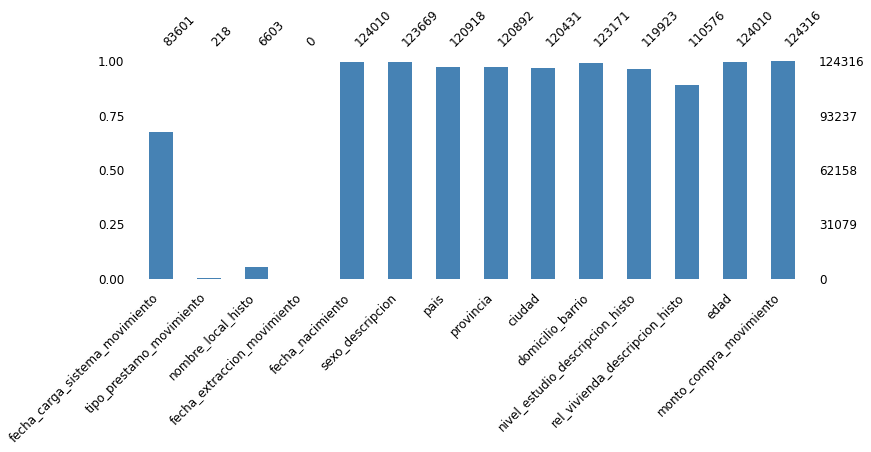

In [72]:
cols_isna=cols_isna +  ['monto_compra_movimiento']

msno.bar(df[cols_isna],figsize=(12, 4), fontsize=12, color='steelblue')

<AxesSubplot:>

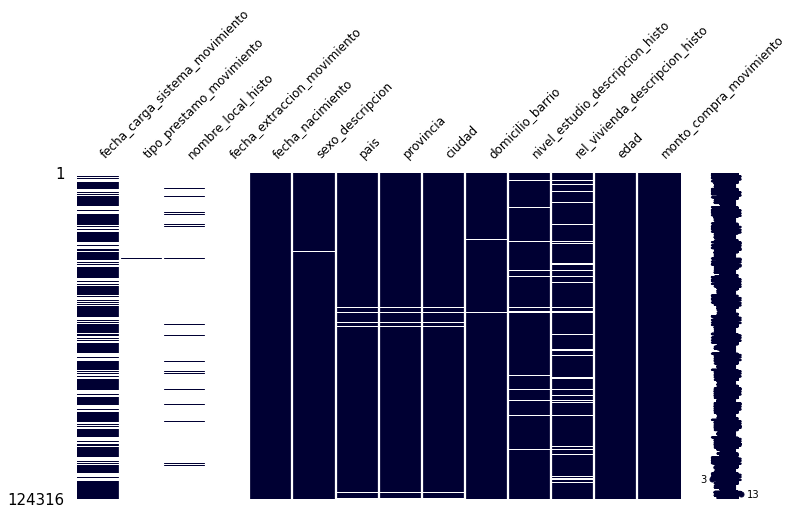

In [73]:
df_sample= df[cols_isna]
msno.matrix(df_sample,figsize=(12, 6), fontsize=12, color=[0,0,0.2])

### Imputación de variables:

#### Provincia:
Para reimputar esta variable vamos a realizar dos pasos:
- Imputar los faltantes de codigo postal.
- imputar los faltantes de provincia según el código postal.

La variable codigo postal no es tenida en cuenta luego de esta imputación.

In [74]:
# Creamos tabla con CP y Provincia.
codigos_postales_to_replace = df[df['provincia'].isna()]['domicilio_codigo_postal'].unique().tolist()
codigos_postales_to_replace.remove('0.0')
codigos_postales_to_replace.remove('nan')
#codigos_postales_to_replace.remove('400.0')

provincias_por_cp = df[df['domicilio_codigo_postal'].isin(codigos_postales_to_replace)][['domicilio_codigo_postal', 'provincia']].groupby(['domicilio_codigo_postal', 'provincia']).count()
provincias_por_cp

,
domicilio_codigo_postal,provincia
1663.0,BUENOS AIRES
3300.0,MISIONES
3500.0,CHACO
3503.0,CHACO
4000.0,TUCUMAN
4101.0,TUCUMAN
5000.0,CORDOBA
5002.0,CORDOBA
5014.0,CORDOBA


In [75]:
codigos_postales_to_replace = df[df['provincia'].isna()]['domicilio_codigo_postal'].unique().tolist()
codigos_postales_to_replace

['5000.0',
 'nan',
 '5501.0',
 '5002.0',
 '4101.0',
 '9015.0',
 '3500.0',
 '4000.0',
 '9100.0',
 '8322.0',
 '5014.0',
 '0.0',
 '2705.0',
 '5800.0',
 '5613.0',
 '2812.0',
 '2144.0',
 '4146.0',
 '3503.0',
 '1663.0',
 '1130.0',
 '5907.0',
 '3230.0',
 '3300.0']

In [76]:
provincias_por_cp = provincias_por_cp.copy().reset_index()
for cp_and_prov in provincias_por_cp.values:
    cod_postal = cp_and_prov[0]
    provincia = cp_and_prov[1]
    df.loc[(df['domicilio_codigo_postal'] == cod_postal) & (df['provincia'].isna()), 'provincia'] = provincia

**Restan por imputarse** filas que tienen como código postal '0.0' o 'nan'. Lo que se hará con Simple Imputer junto con el resto de los faltantes que aplique el mismo metodo.

In [77]:
df[(df['domicilio_codigo_postal'] == '0.0') | (df['domicilio_codigo_postal'] == 'nan')].shape

(983, 53)

Los vamos a posicionar en la provincia de Cordoba con domicilio_codigo_postal = 5000

In [78]:
df.loc[(df['domicilio_codigo_postal'] == '0.0') | (df['domicilio_codigo_postal'] == 'nan'), ['domicilio_codigo_postal', 'Provincia']] = ['5000', 'CORDOBA']

# DF interesting_cols

In [79]:
# clientes:
dni='dni_titular_movimiento' 
edad='edad'
est_civil='estado_civil_descripcion'
sexo='sexo_descripcion'
provincia='provincia'
cod_postal='domicilio_codigo_postal'
antiguedad='antig'  
cargo_cat='cargo_cat'
nv_estudio= 'nivel_estudio_descripcion_histo' 
rel_vivienda='rel_vivienda_descripcion_histo' 
rango_edad='rango_edad' 
rango_antig='rango_antig' 

#producto: 
producto= 'producto_naranja_movimiento'
tipo_producto= 'tipo_producto_tarjeta_movimiento'
marca_da = 'marca_debito_automatico'

#movimiento:
#moneda='moneda_movimiento'
comercio_cat='cat_comercio'
plan='plan_movimiento'
mes_año='mes-año'
mes='mes'

monto_normalizado='monto_normalizado'


fecha='fecha_cupon_movimiento' #para filtro de fechas, luego quitamos

In [80]:
columnas_relevantes = [
    fecha,
    dni, 
    cod_postal,
    comercio_cat, 
    producto, 
    tipo_producto, 
    plan,
    mes,
    mes_año, 
    monto_normalizado, 
    marca_da, 
    edad, 
    est_civil, 
    sexo,
    antiguedad, 
    cargo_cat, 
    nv_estudio, 
    rel_vivienda]
df_naranja=df[columnas_relevantes]
df_naranja[:5]

,fecha_cupon_movimiento,dni_titular_movimiento,domicilio_codigo_postal,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,1766.0,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia
1,2020-08-25,000220fa96ec5af89817894033f8099c547,5521.0,0,PL,0,1,8,2020-08,24.66,0,29.0,Sin Datos,Mujer,2,SD,None,None
2,2020-08-25,0002be202de47dfae9cc2304d91161be595,7107.0,0,PL,0,1,8,2020-08,8.60,0,28.0,Solteroa,Mujer,95,SD,PRIMARIOS,Otros
3,2020-08-25,000e137d0af42e193be1ff670c00d4d1506,2200.0,0,PL,0,1,8,2020-08,3.94,0,39.0,Solteroa,Hombre,151,RD,SECUNDARIOS,Propia
4,2020-08-25,0009d010e4faf69552a814a33832b185877,1019.0,0,PL,0,1,8,2020-08,3.31,0,36.0,Solteroa,Mujer,86,RD,UNIVERSITARIOS,Alquilada


In [81]:
df_naranja.shape

(124316, 18)

In [82]:
df_naranja.head()

,fecha_cupon_movimiento,dni_titular_movimiento,domicilio_codigo_postal,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,1766.0,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia
1,2020-08-25,000220fa96ec5af89817894033f8099c547,5521.0,0,PL,0,1,8,2020-08,24.66,0,29.0,Sin Datos,Mujer,2,SD,None,None
2,2020-08-25,0002be202de47dfae9cc2304d91161be595,7107.0,0,PL,0,1,8,2020-08,8.60,0,28.0,Solteroa,Mujer,95,SD,PRIMARIOS,Otros
3,2020-08-25,000e137d0af42e193be1ff670c00d4d1506,2200.0,0,PL,0,1,8,2020-08,3.94,0,39.0,Solteroa,Hombre,151,RD,SECUNDARIOS,Propia
4,2020-08-25,0009d010e4faf69552a814a33832b185877,1019.0,0,PL,0,1,8,2020-08,3.31,0,36.0,Solteroa,Mujer,86,RD,UNIVERSITARIOS,Alquilada


Aplicamos geodistancias con el código postal:

In [83]:
import pgeocode

dist = pgeocode.GeoDistance('ar')

/home/mpccolorado/.local/lib/python3.9/site-packages/pgeocode.py:203: UserWarning: The Argentina data file contains 4-digit postal codes which were replaced with a new system in 1999.
  warnings.warn(


In [84]:
df_naranja.loc[:, 'domicilio_codigo_postal'] = df_naranja['domicilio_codigo_postal'].astype('float64').astype('int64')

/home/mpccolorado/.local/lib/python3.9/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [85]:
codigos_postales = df_naranja['domicilio_codigo_postal'].unique()
distancias_df = pd.DataFrame({'domicilio_codigo_postal': codigos_postales}, columns = ['domicilio_codigo_postal', 'distancia']).sort_values('domicilio_codigo_postal')
distancias_df.loc[:, 'distancia'] = [dist.query_postal_code(cod_postal, "5000") for cod_postal in distancias_df[:]['domicilio_codigo_postal']]

Para computar los nan vamos a setear el próximo valor de distancia encontrado en el dataframe (ya ordenado por codigo postal)

In [86]:
distancias_df.fillna(method='backfill', inplace=True)

In [87]:
distancias_df.head()

,domicilio_codigo_postal,distancia
319,400,631.055876
338,1000,631.055876
204,1006,631.055876
323,1008,631.055876
295,1009,631.055876


In [88]:
df_naranja.head()

,fecha_cupon_movimiento,dni_titular_movimiento,domicilio_codigo_postal,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,1766,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia
1,2020-08-25,000220fa96ec5af89817894033f8099c547,5521,0,PL,0,1,8,2020-08,24.66,0,29.0,Sin Datos,Mujer,2,SD,None,None
2,2020-08-25,0002be202de47dfae9cc2304d91161be595,7107,0,PL,0,1,8,2020-08,8.60,0,28.0,Solteroa,Mujer,95,SD,PRIMARIOS,Otros
3,2020-08-25,000e137d0af42e193be1ff670c00d4d1506,2200,0,PL,0,1,8,2020-08,3.94,0,39.0,Solteroa,Hombre,151,RD,SECUNDARIOS,Propia
4,2020-08-25,0009d010e4faf69552a814a33832b185877,1019,0,PL,0,1,8,2020-08,3.31,0,36.0,Solteroa,Mujer,86,RD,UNIVERSITARIOS,Alquilada


In [89]:
df_naranja = pd.merge(df_naranja, distancias_df, on=["domicilio_codigo_postal"])

In [90]:
df_naranja.head()

,fecha_cupon_movimiento,dni_titular_movimiento,domicilio_codigo_postal,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,1766,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
1,2020-08-19,0001686b52949b5461ffcbc766687e45031,1766,0,PL,0,1,8,2020-08,107.18,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
2,2020-08-19,0001686b52949b5461ffcbc766687e45031,1766,1,PL,3,1,8,2020-08,194.74,1,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
3,2020-08-25,0001686b52949b5461ffcbc766687e45031,1766,0,PL,0,1,8,2020-08,419.09,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
4,2020-08-19,0001686b52949b5461ffcbc766687e45031,1766,1,PL,3,1,8,2020-08,194.80,1,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727


Eliminamos la columna 'domicilio_codigo_postal':

In [91]:
columnas_relevantes.remove(cod_postal)

Agregamos la columna distancia al listado de columnas relevantes

In [92]:
columnas_relevantes.append('distancia')

Seteamos el dataframe con las columnas relevantes

In [93]:
df_naranja=df_naranja[columnas_relevantes]

In [94]:
df_naranja.head()

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
1,2020-08-19,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,107.18,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
2,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.74,1,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
3,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,419.09,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727
4,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.80,1,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727


---

## Reimputación de faltantes:
Imputamos las columnas: 'edad', 'provincia', 'sexo_descripcion', 'nivel_estudio_descripcion_histo', rango_antig y 'rel_vivienda_descripcion_histo'.
 
**Metodo:** Mas Frecuente.

In [95]:
columnas_a_imputar = [edad, sexo, nv_estudio, rel_vivienda, antiguedad]
for columna in columnas_a_imputar:
    moda_col = df_naranja[columna].mode()
    df_naranja.loc[df_naranja[columna].isna(), columna] = moda_col[0]

In [96]:
df_naranja.isna().sum()

fecha_cupon_movimiento              0
dni_titular_movimiento              0
cat_comercio                        0
producto_naranja_movimiento         0
tipo_producto_tarjeta_movimiento    0
plan_movimiento                     0
mes                                 0
mes-año                             0
monto_normalizado                   0
marca_debito_automatico             0
edad                                0
estado_civil_descripcion            0
sexo_descripcion                    0
antig                               0
cargo_cat                           0
nivel_estudio_descripcion_histo     0
rel_vivienda_descripcion_histo      0
distancia                           0
dtype: int64

## B) Valores Atípicos
* Identificar valores atípicos.
  * Para variables numericas, analisis de outliers. En que caso se pueden eliminar estos valores?
  * Para variables categoricas, se pueden agrupar estos valores en una nueva categoria?
    > Ejm. `cargo_descripcion_histo`
  * Para fechas. existen fechas atipicas?
    > Ejm. Una fecha con el valor `2021-12-03`, sabiendo que el dataset deberia tener  datos entre julio 2020 y mayo 2021 

### Quitamos rango de fecha incorrecta
No tenemos en cuenta los movimientos realizados en una fecha anterior a 01/07/2020.

In [97]:
df_naranja = df_naranja[df_naranja[fecha] >= '2020-07-01']

In [98]:
df_naranja = df_naranja[columnas_relevantes]
df_naranja.head(1)

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,92,RD,SECUNDARIOS,Propia,639.36727


In [99]:
df_naranja.shape

(124300, 18)

### Valores Extremos

Como el objetivo es tratar de predecir el tipo de producto/movimiento y clasificar a los clientes en base a los productos y/o montos, decidimos hacer el analisis de outliers enfocado en cada clientes y cada producto. Ante la variación de rangos de montos entre los diestintos productos, consideramos que hacer un analisis de valores extremos por el conjunto completo quizas no sería tan eficaz para lo que pretendemos. 

In [100]:
df_clean = df_naranja[[dni, monto_normalizado]] \
    .groupby([dni]) \
    .agg(
        mean=(monto_normalizado, "mean"),
        std=(monto_normalizado, "std")
    )
df_clean["limit"] = df_clean["mean"].abs() + 2.5*df_clean["std"]

In [101]:
df_clean=df_clean.reset_index()
df_clean

,dni_titular_movimiento,mean,std,limit
0,000000b5aea2c9ea7cc155f6ebcef97f826,-6.369000,0.700969,8.121421
1,00000b8415f19846d12e852ebd0d52ec432,2892.227861,7071.145991,20570.092838
2,00000d109ca5a0c6b3e76295f0292c38189,-0.538000,0.061181,0.690953
3,000017309738c042c2ec144d5d3d3632673,1772.119077,2947.771705,9141.548340
4,00001b02afa8956b08af05c339039882046,1934.656391,5863.472944,16593.338751
...,...,...,...,...
839,000ef071e95351afc1149fa1afe4862a079,3656.310722,10169.747757,29080.680115
840,000ef0bc6859b57ec9cc7db583dd73ca697,1314.580062,2652.023698,7944.639307
841,000ef64a5f2323a3979805450f2e890c495,3712.171184,15814.440011,43248.271212
842,000eff02871f717d5c860eae9e0347a5523,1148.411338,2816.006905,8188.428601


In [102]:
df_naranja_clean= df_naranja.merge(df_clean[['limit',dni]], on=[dni])
df_naranja_clean= df_naranja_clean[df_naranja_clean[monto_normalizado].abs() <= df_naranja_clean["limit"]]

In [103]:
df_naranja_clean.shape

(120026, 19)

Eliminamos la columna limit

In [104]:
df_naranja_clean.drop('limit', axis=1, inplace=True)

### Agrupamiento de categorías:

#### Antiguedad.

In [105]:
df_naranja_clean.loc[:,'antig']= df_naranja_clean.antig / 12
df_naranja_clean.loc[:,'antig']= df_naranja_clean.antig.round()
df_naranja_clean.head(1)

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727


#### Estado Civil

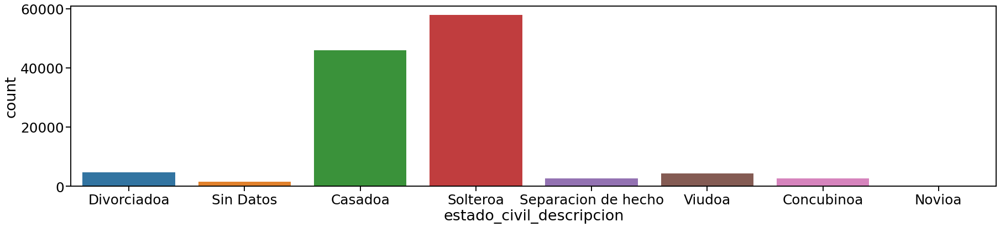

In [106]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x='estado_civil_descripcion')
plt.ticklabel_format(style='plain', axis='y')

`Separación de hecho` lo uniremos a `Divorciado/a`

`Concubino` lo uniremos a `Casado`

`Novio` lo unimos a `Sin Datos` (x su baja representación)

In [107]:
df_naranja_clean.loc[:, 'estado_civil_descripcion'] = df_naranja_clean.estado_civil_descripcion.str.replace('Separación de hecho', 'Divorciadoa')
df_naranja_clean.loc[:, 'estado_civil_descripcion'] = df_naranja_clean.estado_civil_descripcion.str.replace('Concubinoa', 'Casadoa')
df_naranja_clean.loc[:, 'estado_civil_descripcion'] = df_naranja_clean.estado_civil_descripcion.str.replace('Novioa', 'Sin Datos')

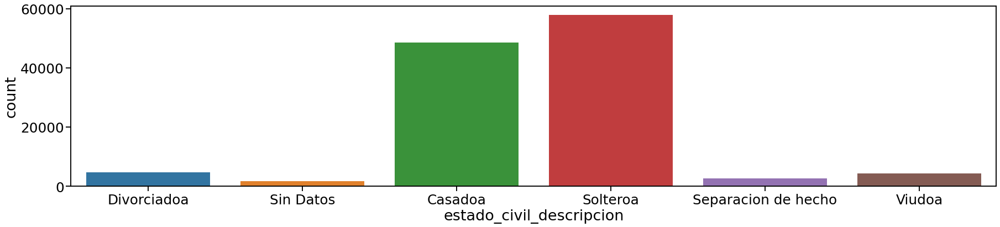

In [108]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x='estado_civil_descripcion')
plt.ticklabel_format(style='plain', axis='y')

#### Tipo de Producto

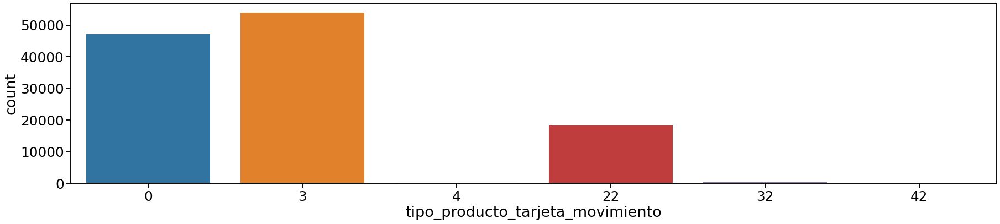

In [109]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x=tipo_producto)
plt.ticklabel_format(style='plain', axis='y')

In [110]:
# Agrupamos las categorías menos frecuentes en el codigo 99 que va a ser Otros
df_naranja_clean.loc[:, tipo_producto] = df_naranja_clean.tipo_producto_tarjeta_movimiento.replace(4, 99)
df_naranja_clean.loc[:, tipo_producto] = df_naranja_clean.tipo_producto_tarjeta_movimiento.replace(32, 99)
df_naranja_clean.loc[:, tipo_producto] = df_naranja_clean.tipo_producto_tarjeta_movimiento.replace(42, 99)
df_naranja_clean.loc[:, tipo_producto] = df_naranja_clean.tipo_producto_tarjeta_movimiento.replace(22, 99)

**Codigo 99:** Para representar a Otros.

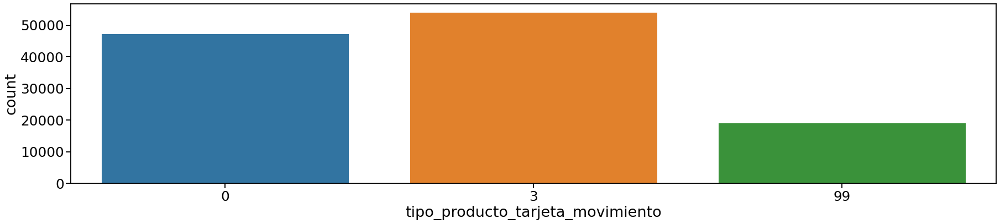

In [111]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x=tipo_producto)
plt.ticklabel_format(style='plain', axis='y')

#### Rel. Vivienda

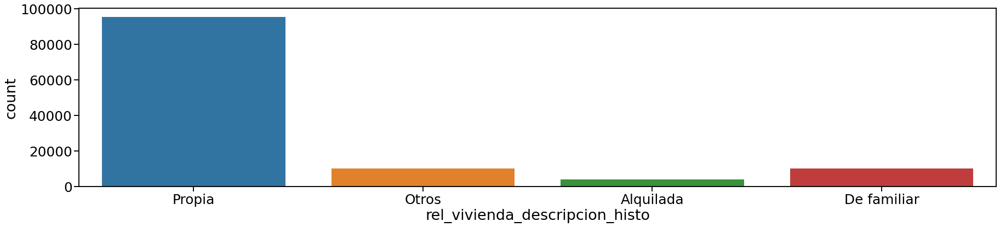

In [112]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x=rel_vivienda)
plt.ticklabel_format(style='plain', axis='y')

In [113]:
df_naranja_clean.loc[:, rel_vivienda] = df_naranja_clean.rel_vivienda_descripcion_histo.str.replace('De familiar', 'Otros')
df_naranja_clean.loc[:, rel_vivienda] = df_naranja_clean.rel_vivienda_descripcion_histo.str.replace('Alquilada', 'Otros')

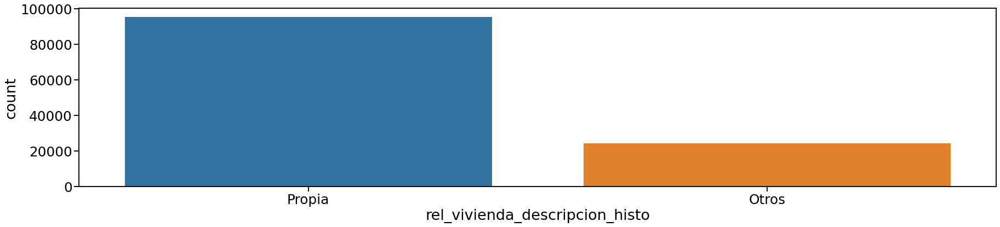

In [114]:
fig=plt.figure(figsize=(30,6))
sns.countplot(data=df_naranja_clean,x=rel_vivienda)
plt.ticklabel_format(style='plain', axis='y')

## C) Normalización y PCA

* Se puede normalizar la antiguedad y/o `monto_compra_movimiento`?
* Usando la edad y la antiguerdad hacer una analisis de PCA junto con la variables `monto_compra_movimiento`
  > pueden usar las 3 variables o hacer un analisis edad - monto y antiguedad - monto.

Se pueden normalizar tanto la antiguedad como el monto. Lo hacemos mediante Standard Scaler.

In [115]:
df_pca=df_naranja_clean[[edad,antiguedad,monto_normalizado]]
df_pca.head(4)

,edad,antig,monto_normalizado
0,61.0,8.0,8.68
1,61.0,8.0,107.18
2,61.0,8.0,194.74
3,61.0,8.0,419.09


In [116]:
n_components = 3

pca_estimator = PCA(n_components=n_components) 

pca_pipe_line = make_pipeline(StandardScaler(), pca_estimator)

result = pca_pipe_line.fit_transform(df_pca)
result

array([[ 0.35841375, -0.5530768 ,  0.65731597],
       [ 0.36085518, -0.52320208,  0.66035037],
       [ 0.36302545, -0.49664542,  0.66304776],
       ...,
       [-1.94183492,  0.82431006,  0.09326862],
       [-0.75300567, -0.56263081, -0.02800906],
       [-0.75300567, -0.56263081, -0.02800906]])

In [117]:
#Varianza individual
explained_variance = pca_estimator.explained_variance_ratio_
explained_variance

array([0.46053434, 0.33380093, 0.20566473])

In [118]:
#Varianza Acumulada
acc_variance_percent = np.cumsum(np.round(explained_variance, decimals=4) * 100)
acc_variance_percent

array([ 46.05,  79.43, 100.  ])

In [119]:
scaled_dense_feature_matrix = df_pca
pca = PCA(n_components=3)
pca.fit(scaled_dense_feature_matrix)
proyected_features = pca.transform(scaled_dense_feature_matrix)
proyected_features.shape

(120026, 3)

In [120]:
df_pca[['pca1_scaled', 'pca2_scaled']] = proyected_features[:,:2]

/home/mpccolorado/.local/lib/python3.9/site-packages/pandas/core/frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


<AxesSubplot:xlabel='pca1_scaled', ylabel='pca2_scaled'>

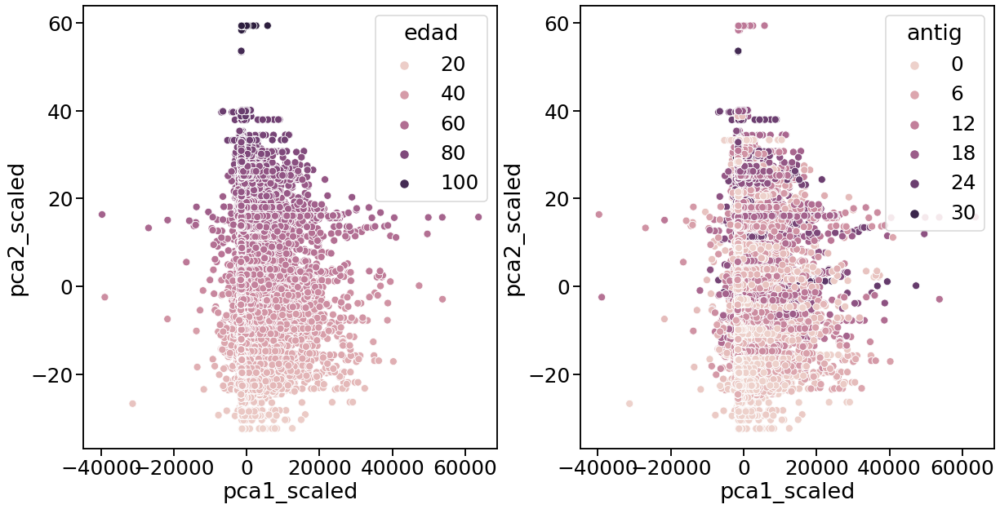

In [121]:
cols = ['edad', 'antig']
data = df_pca[cols + ['pca1_scaled', 'pca2_scaled']]#[:1000].dropna(how='any')
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
# Other variables to try: 'Price' 'Landsize' 'Price' 'YearBuilt'
sns.scatterplot(data=data, x='pca1_scaled', y='pca2_scaled',
                    hue='edad', ax=axes[0])  
sns.scatterplot(data=data, x='pca1_scaled', y='pca2_scaled',
                    hue='antig', ax=axes[1]) 

**Conclusión**: Luego de aplicar PCA a las columnas monto_normalizado, edad y antiguedad podemos decir que en una variable, se encuentra explicada el 46,26% de la varianza de estas columnas, en 2 variables de pca, se encuentra explicado el 79,65% de su varianza. Y el total de la varianza se completa con la 3 variable de PCA. 

A traves del grafico se puede ver una relacion con la antiguedad.

In [122]:
df_naranja_clean.head()

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727
1,2020-08-19,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727
2,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727
3,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727
4,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727


Creamos un nuevo df en donde el mes-año es una categoría:

In [123]:
new_df = df_naranja_clean[[dni, 'mes-año', 'monto_normalizado']]
new_df['mes-año'] = new_df['mes-año'].astype('category')

/tmp/ipykernel_147110/1723109969.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['mes-año'] = new_df['mes-año'].astype('category')


Usamos pivot_table para crear las filas en donde el cliente no tuvo ningún movimiento:

In [124]:
new_table = pd.pivot_table(
    new_df, 
    values=['monto_normalizado'],
    index=[dni, 'mes-año'],
    aggfunc=np.sum,
    fill_value=0
)
new_table

monto_normalizado
dni_titular_movimiento              mes-año                   
000000b5aea2c9ea7cc155f6ebcef97f826 2020-07               0.00
                                    2020-08             -14.86
                                    2020-09             -14.44
                                    2020-10             -13.92
                                    2020-11             -13.48
...                                                        ...
000f0b73ebfa002a79a0642b82e87919904 2021-01           35692.92
                                    2021-02            2075.54
                                    2021-03            8142.80
                                    2021-04           15492.10
                                    2021-05            6059.36

[9284 rows x 1 columns]

Creamos una columna para identificar si el monto se ha incrementado un 10% con respecto al mes pasado

In [125]:
df_incremento = new_table.copy().reset_index()
df_incremento.loc[0,'incremento_monto'] = 0
for i in range(1, len(df_incremento)):
  dni_anterior = df_incremento.loc[i-1, dni]
  monto_mes_anterior = df_incremento.loc[i-1, 'monto_normalizado']
  dni_actual = df_incremento.loc[i, dni]
  monto_mes_actual = df_incremento.loc[i, 'monto_normalizado']
  if dni_anterior != dni_actual:
      df_incremento.loc[i,'incremento_monto'] = 0
  else:
      df_incremento.loc[i,'incremento_monto'] = 1 if monto_mes_actual >= (monto_mes_anterior * 1.1)  else 0

In [126]:
df_incremento.head()

,dni_titular_movimiento,mes-año,monto_normalizado,incremento_monto
0,000000b5aea2c9ea7cc155f6ebcef97f826,2020-07,0.00,0.0
1,000000b5aea2c9ea7cc155f6ebcef97f826,2020-08,-14.86,0.0
2,000000b5aea2c9ea7cc155f6ebcef97f826,2020-09,-14.44,1.0
3,000000b5aea2c9ea7cc155f6ebcef97f826,2020-10,-13.92,1.0
4,000000b5aea2c9ea7cc155f6ebcef97f826,2020-11,-13.48,1.0


Eliminar columna normalizada del DF df_incremento:

In [127]:
df_incremento.drop('monto_normalizado', inplace=True, axis=1)

Hacemos un merge entre df_incremento y df_naranja_clean:

In [128]:
df_naranja_clean_con_incrementos = pd.merge(df_naranja_clean, df_incremento, on=[dni, 'mes-año'])
df_naranja_clean_con_incrementos.head(4)

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0
1,2020-08-19,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0
2,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0
3,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0


## Mean Encoding

### Encodeamos las columnas categóricas
Debemos usar el Mean Encoding para poderles poner un número a las variables categóricas. Las columnas serán:
* cat_comercio
* producto_naranja_movimiento
* tipo_producto_tarjeta_movimiento
* plan_movimiento
* marca_debito_automatico
* estado_civil_descripcion
* sexo_descripcion
* cargo_cat
* nivel_estudio_descripcion_histo
* rel_vivienda_descripcion_histo

Creamos una función para realizar el mean encoding, el mismo nos devolverá un nuevo dataframe por cada variable categórica:

In [129]:
def mean_encoding(dataframe, categorical_var, target_var):
    sum_df = dataframe.groupby(categorical_var).sum()
    count_df = dataframe.groupby(categorical_var).count()
    mean_df = sum_df[target_var] / count_df[target_var]
    mean_dict = mean_df.to_dict()
    result_df = dataframe.copy()
    result_df.loc[:, categorical_var + '_encoded'] =  result_df[categorical_var].map(mean_dict)
    return result_df

In [6]:
categorias = [
    "cat_comercio",
    "producto_naranja_movimiento",
    "tipo_producto_tarjeta_movimiento",
    "plan_movimiento",
    "marca_debito_automatico",
    "estado_civil_descripcion",
    "sexo_descripcion",
    "cargo_cat",
    "nivel_estudio_descripcion_histo",
    "rel_vivienda_descripcion_histo"
]
df_naranja_final = df_naranja_clean_con_incrementos.copy()
for categoria in categorias:
    df_naranja_final = mean_encoding(df_naranja_final, categoria, 'incremento_monto')
df_naranja_final.head()

NameError: name 'df_naranja_clean_con_incrementos' is not defined

In [131]:
df_naranja_final.head()

,fecha_cupon_movimiento,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,2020-08-19,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,107.18,0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.74,1,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,2020-08-25,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,419.09,0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,2020-08-19,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.80,1,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543


In [132]:
df_naranja_final = df_naranja_final.drop(['fecha_cupon_movimiento'], axis=1)

### Guardado del dataframe no balanceado

In [133]:
df_to_save = df_naranja_final.copy()
for categoria in categorias:
    df_to_save[categoria] = df_to_save[categoria].astype('string')
df_to_save.to_parquet('data_no_supervisado_no_balanceado.parquet', engine='fastparquet')

### Balanceamos el df

In [152]:
new_df = df_naranja_final.copy()
new_df['mes-año'] = new_df['mes-año'].astype('category')
for categoria in categorias:
    new_df[categoria] = new_df[categoria].astype('category')
otras_columnas = [
    'mes', 'monto_normalizado', 'edad', 'antig', 
    'distancia', 'incremento_monto'
]
columnas_categoricas = []
columnas_categoricas += categorias
columnas_categoricas += [categoria + '_encoded' for categoria in categorias]
columnas_categoricas
aggfunc = {
    categoria: lambda x: x.mode()[0] for categoria in columnas_categoricas
}
aggfunc['edad'] = lambda x: x.mode()[0]
aggfunc['antig'] = lambda x: x.mode()[0]
aggfunc['distancia'] = lambda x: x.mode()[0]
aggfunc['monto_normalizado'] = np.sum
aggfunc['incremento_monto'] = lambda x: x.mode()[0]
aggfunc
columns = columnas_categoricas + otras_columnas
balanced_table = pd.pivot_table(
    new_df, 
    values=columns,
    index=[dni, 'mes-año'],
    aggfunc=aggfunc,
    fill_value=0
)

In [153]:
balanced_table

antig cargo_cat  \
dni_titular_movimiento              mes-año                    
000000b5aea2c9ea7cc155f6ebcef97f826 2020-07      0         0   
                                    2020-08     19        SD   
                                    2020-09     19        SD   
                                    2020-10     19        SD   
                                    2020-11     19        SD   
...                                            ...       ...   
000f0b73ebfa002a79a0642b82e87919904 2021-01      2        SD   
                                    2021-02      2        SD   
                                    2021-03      2        SD   
                                    2021-04      2        SD   
                                    2021-05      2        SD   

                                             cargo_cat_encoded cat_comercio  \
dni_titular_movimiento              mes-año                                   
000000b5aea2c9ea7cc155f6ebcef97f826 2020-07           0.000000            0   
                                    2020-08           0.519127            0   
                                    2020-09           0.519127            0   
                                    2020-10           0.519127            0   
                                    2020-11           0.519127            0   
...                                                        ...          ...   
000f0b73ebfa002a79a0642b82e87919904 2021-01           0.519127            0   
                                    2021-02           0.519127            0   
                                    2021-03           0.519127            0   
                                    2021-04           0.519127            0   
                                    2021-05           0.519127            0   

                                             cat_comercio_encoded  distancia  \
dni_titular_movimiento              mes-año                                    
000000b5aea2c9ea7cc155f6ebcef97f826 2020-07              0.000000    0.00000   
                                    2020-08              0.482778  329.37412   
                                    2020-09              0.482778  329.37412   
                                    2020-10              0.482778  329.37412   
                                    2020-11              0.482778  329.37412   
...                                                           ...        ...   
000f0b73ebfa002a79a0642b82e87919904 2021-01              0.482778  257.08889   
                                    2021-02              0.482778  257.08889   
                                    2021-03              0.476838  257.08889   
                                    2021-04              0.482778  257.08889   
                                    2021-05              0.482778  257.08889   

                                             edad estado_civil_descripcion  \
dni_titular_movimiento              mes-año                                  
000000b5aea2c9ea7cc155f6ebcef97f826 2020-07     0                        0   
                                    2020-08    46                 Solteroa   
                                    2020-09    46                 Solteroa   
                                    2020-10    46                 Solteroa   
                                    2020-11    46                 Solteroa   
...                                           ...                      ...   
000f0b73ebfa002a79a0642b82e87919904 2021-01    64                  Casadoa   
                                    2021-02    64                  Casadoa   
                                    2021-03    64                  Casadoa   
                                    2021-04    64                  Casadoa   
                                    2021-05    64                  Casadoa   

                                             estado_civil_descripcion_encoded  \
dni_titular_movimiento              mes-año    

In [154]:
df_naranja_final_balanced = df_naranja_final.copy()

posibles_filas_a_agregar = balanced_table[balanced_table['monto_normalizado'] == 0]
balanced_table_2 = balanced_table.reset_index()
for (idx_dni, idx_mes_año) in posibles_filas_a_agregar.index:
    row = balanced_table_2[(balanced_table_2[dni] == idx_dni) & (balanced_table_2['mes-año'] == idx_mes_año)]
    cantidad_de_movimientos = df_naranja_final[(df_naranja_final[dni] == idx_dni) & (df_naranja_final['mes-año'] == idx_mes_año)]['monto_normalizado'].count()
    if cantidad_de_movimientos == 0:
        mes_value = int(idx_mes_año.split('-')[-1])
        df_naranja_final_balanced = df_naranja_final_balanced.append({
            "dni_titular_movimiento": idx_dni,
            "mes-año": idx_mes_año,
            "mes": mes_value,
            "cat_comercio": row["cat_comercio"].values[0],
            "producto_naranja_movimiento": row["producto_naranja_movimiento"].values[0],
            "tipo_producto_tarjeta_movimiento": row["tipo_producto_tarjeta_movimiento"].values[0],
            "plan_movimiento": row["plan_movimiento"].values[0],
            "monto_normalizado": row["monto_normalizado"].values[0],
            "marca_debito_automatico": row["marca_debito_automatico"].values[0],
            "estado_civil_descripcion": row["estado_civil_descripcion"].values[0],
            "sexo_descripcion": row["sexo_descripcion"].values[0],
            "antig": row["antig"].values[0],
            "cargo_cat": row["cargo_cat"].values[0],
            "nivel_estudio_descripcion_histo": row["nivel_estudio_descripcion_histo"].values[0],
            "rel_vivienda_descripcion_histo": row["rel_vivienda_descripcion_histo"].values[0],
            "cat_comercio_encoded": row["cat_comercio_encoded"].values[0],
            "producto_naranja_movimiento_encoded": row["producto_naranja_movimiento_encoded"].values[0],
            "tipo_producto_tarjeta_movimiento_encoded": row["tipo_producto_tarjeta_movimiento_encoded"].values[0],
            "plan_movimiento_encoded": row["plan_movimiento_encoded"].values[0],
            "marca_debito_automatico_encoded": row["marca_debito_automatico_encoded"].values[0],
            "estado_civil_descripcion_encoded": row["estado_civil_descripcion_encoded"].values[0],
            "sexo_descripcion_encoded": row["sexo_descripcion_encoded"].values[0],
            "cargo_cat_encoded": row["cargo_cat_encoded"].values[0],
            "nivel_estudio_descripcion_histo_encoded": row["nivel_estudio_descripcion_histo_encoded"].values[0],
            "rel_vivienda_descripcion_histo_encoded": row["rel_vivienda_descripcion_histo_encoded"].values[0],
            "edad": row["edad"].values[0],
            "distancia": row["distancia"].values[0],
            "monto_normalizado": 0,
            "incremento_monto": 0,
        }, ignore_index=True)

In [155]:
df_naranja_final_balanced

,dni_titular_movimiento,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,mes-año,monto_normalizado,marca_debito_automatico,edad,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,8.68,0,61.0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,107.18,0,61.0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.74,1,61.0,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0001686b52949b5461ffcbc766687e45031,0,PL,0,1,8,2020-08,419.09,0,61.0,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,0001686b52949b5461ffcbc766687e45031,1,PL,3,1,8,2020-08,194.80,1,61.0,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,000ef0bc6859b57ec9cc7db583dd73ca697,0,0,0,0,7,2020-07,0.00,0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,000ef64a5f2323a3979805450f2e890c495,0,0,0,0,7,2020-07,0.00,0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,000ef64a5f2323a3979805450f2e890c495,0,0,0,0,5,2021-05,0.00,0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,000eff02871f717d5c860eae9e0347a5523,0,0,0,0,7,2020-07,0.00,0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### Guardado

In [156]:
df_to_save = df_naranja_final_balanced.copy()
for categoria in categorias:
    df_to_save[categoria] = df_to_save[categoria].astype('string')
df_to_save.to_parquet('data_no_supervisado_final.parquet', engine='fastparquet')

# No supervisado

Leemos los datos del disco:

In [3]:
df_no_supervisado = pd.read_parquet("/home/mpccolorado/data_no_supervisado_final.parquet")

### Eliminamos columnas que no usaremos en el estudio

In [4]:
df_no_supervisado.drop(
    [
        'dni_titular_movimiento',
        'mes-año'
    ],
    axis=1, inplace=True)

In [5]:
df_no_supervisado

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,0,0,0,0,7,0.00,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,0,0,0,0,7,0.00,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,0,0,0,0,5,0.00,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,0,0,0,0,7,0.00,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### Normalizar

Escalamos sólo la variable *monto_normalizado*:

In [7]:
from sklearn.pipeline import Pipeline

features = df_no_supervisado.columns.to_list()

standard_scaler = StandardScaler()

df_escalado = df_no_supervisado.copy()
df_escalado['monto_normalizado'] = standard_scaler.fit_transform(df_escalado[['monto_normalizado']])
df_escalado

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,0,PL,0,1,8,-0.449076,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,-0.418769,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,-0.391828,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,-0.322799,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,-0.391810,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,0,0,0,0,5,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### *Agregamos la columna distancia al escalado
Debido a que los resultados no fueron los esperados, escalaremos tb la variable distancia

In [8]:
df_escalado_2 = df_escalado.copy()
df_escalado_2['distancia'] = standard_scaler.fit_transform(df_escalado_2[['distancia']])
df_escalado_2

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,0,PL,0,1,8,-0.449076,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,-0.418769,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,-0.391828,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,-0.322799,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,-0.391810,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,0,0,0,0,5,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,0,0,0,0,7,-0.451747,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### División del DF con datos sólo numéricos

In [9]:
df_escalado_ML = df_escalado.copy()
df_escalado_ML.drop(categorias, axis=1, inplace=True)
df_escalado_ML

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,8,-0.449076,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,8,-0.418769,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,8,-0.391828,61.0,8.0,639.36727,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,8,-0.322799,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,8,-0.391810,61.0,8.0,639.36727,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,7,-0.451747,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,7,-0.451747,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,5,-0.451747,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,7,-0.451747,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [9]:
df_escalado_ML_2 = df_escalado_2.copy()
df_escalado_ML_2.drop(categorias, axis=1, inplace=True)
df_escalado_ML_2

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
0,8,-0.449076,61.0,8.0,0.265614,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,8,-0.418769,61.0,8.0,0.265614,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,8,-0.391828,61.0,8.0,0.265614,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,8,-0.322799,61.0,8.0,0.265614,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,8,-0.391810,61.0,8.0,0.265614,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,7,-0.451747,0.0,0.0,-1.339999,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121832,7,-0.451747,0.0,0.0,-1.339999,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121833,5,-0.451747,0.0,0.0,-1.339999,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
121834,7,-0.451747,0.0,0.0,-1.339999,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### PCA

Con sólo dos componentes principales:

In [10]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(df_escalado_ML.values)

In [11]:
pca_df = pd.DataFrame(data = pca_results, columns = ['pca_1', 'pca_2'])

Varianza individual

In [12]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.99798575, 0.00168596])

Varianza acumulada

In [13]:
acc_variance_percent = np.cumsum(np.round(explained_variance, decimals=4) * 100)
acc_variance_percent

array([99.8 , 99.97])

In [14]:
pca_df_2 = pd.DataFrame(pca.components_,columns=df_escalado_ML.columns,index = ['PC-1','PC-2'])
pca_df_2

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
PC-1,0.000011,0.000044,-0.001550,-0.001801,0.999997,0.000026,0.000034,0.000031,0.000032,0.000027,0.000027,0.000026,0.000025,0.000025,0.000028,0.000025
PC-2,0.000170,0.001236,0.981565,0.191068,0.001865,0.000515,0.001361,0.001350,0.001422,0.001349,0.001240,0.001044,0.001403,0.001151,0.001302,0.001390


In [15]:
pca_df_total = df_escalado_ML.copy()
pca_df_total.loc[:, 'pca_1'] = pca_df['pca_1']
pca_df_total.loc[:, 'pca_2'] = pca_df['pca_2']
pca_df_total.head()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded,pca_1,pca_2
0,8,-0.449076,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543,105.752227,12.266710
1,8,-0.418769,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543,105.752229,12.266748
2,8,-0.391828,61.0,8.0,639.36727,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543,105.752229,12.266732
3,8,-0.322799,61.0,8.0,639.36727,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543,105.752233,12.266866
4,8,-0.391810,61.0,8.0,639.36727,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543,105.752229,12.266732


### Graficamos PCA

<AxesSubplot:xlabel='pca_1', ylabel='pca_2'>

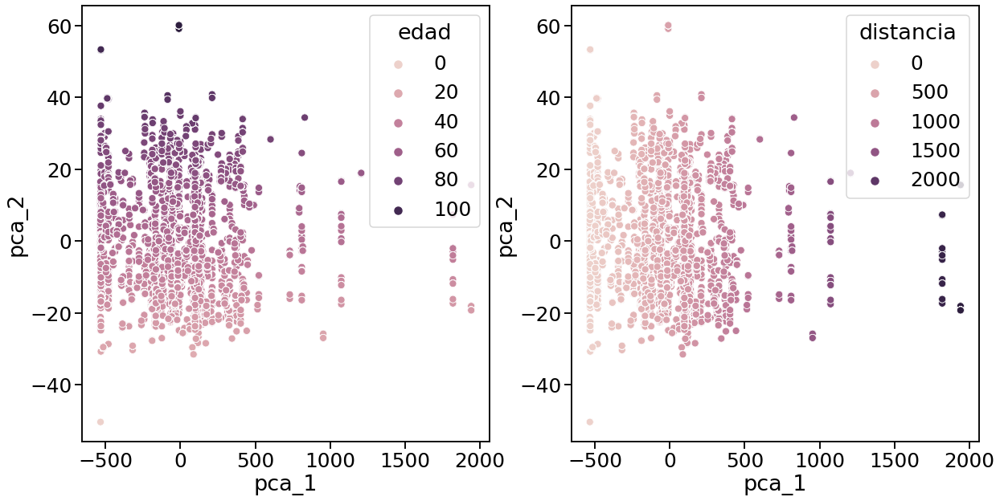

In [190]:
import matplotlib.pyplot as plt
import seaborn as sns
cols = ['edad', 'antig']
data = pca_df_total
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
sns.scatterplot(data=data, x='pca_1', y='pca_2',
                    hue='edad', ax=axes[0])  
sns.scatterplot(data=data, x='pca_1', y='pca_2',
                    hue='distancia', ax=axes[1]) 

<AxesSubplot:xlabel='pca_1', ylabel='pca_2'>

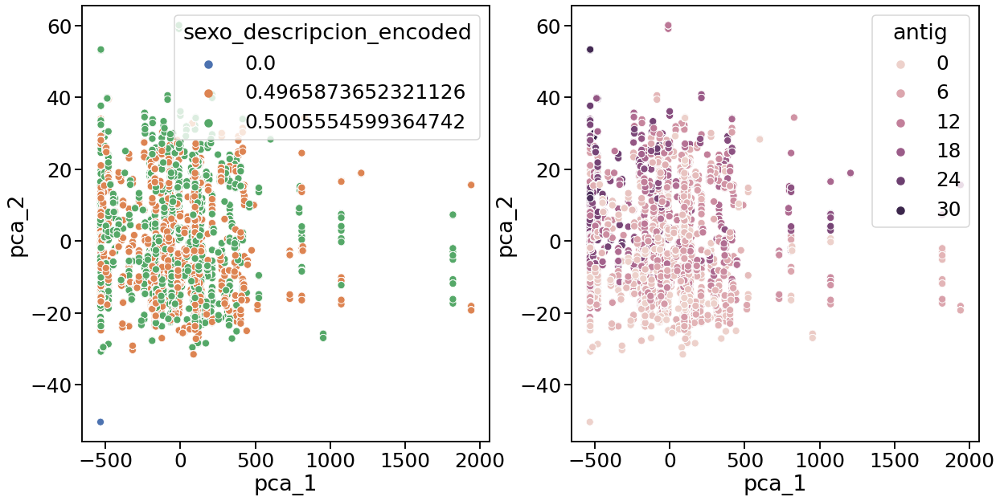

In [192]:
import matplotlib.pyplot as plt
import seaborn as sns
cols = ['edad', 'antig']
data = pca_df_total
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
sns.scatterplot(data=data, x='pca_1', y='pca_2',
                    hue='sexo_descripcion_encoded', ax=axes[0], palette="deep")  
sns.scatterplot(data=data, x='pca_1', y='pca_2',
                    hue='antig', ax=axes[1]) 

In [197]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=250, init='random', random_state = 15)
X_tsne_all = tsne.fit_transform(df_escalado_ML)

/home/mpccolorado/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 121836 samples in 0.001s...
[t-SNE] Computed neighbors for 121836 samples in 126.624s...
[t-SNE] Computed conditional probabilities for sample 1000 / 121836
[t-SNE] Computed conditional probabilities for sample 2000 / 121836
[t-SNE] Computed conditional probabilities for sample 3000 / 121836
[t-SNE] Computed conditional probabilities for sample 4000 / 121836
[t-SNE] Computed conditional probabilities for sample 5000 / 121836
[t-SNE] Computed conditional probabilities for sample 6000 / 121836
[t-SNE] Computed conditional probabilities for sample 7000 / 121836
[t-SNE] Computed conditional probabilities for sample 8000 / 121836
[t-SNE] Computed conditional probabilities for sample 9000 / 121836
[t-SNE] Computed conditional probabilities for sample 10000 / 121836
[t-SNE] Computed conditional probabilities for sample 11000 / 121836
[t-SNE] Computed conditional probabilities for sample 12000 / 121836
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 118000 / 121836
[t-SNE] Computed conditional probabilities for sample 119000 / 121836
[t-SNE] Computed conditional probabilities for sample 120000 / 121836
[t-SNE] Computed conditional probabilities for sample 121000 / 121836
[t-SNE] Computed conditional probabilities for sample 121836 / 121836
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.437195
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


Graficamos las variables resultantes de TSNE, coloreando con la etiqueta objetivo usada en aprendizaje supervisado, que indica si el consumo aumenta de un mes a otro para un cliente.

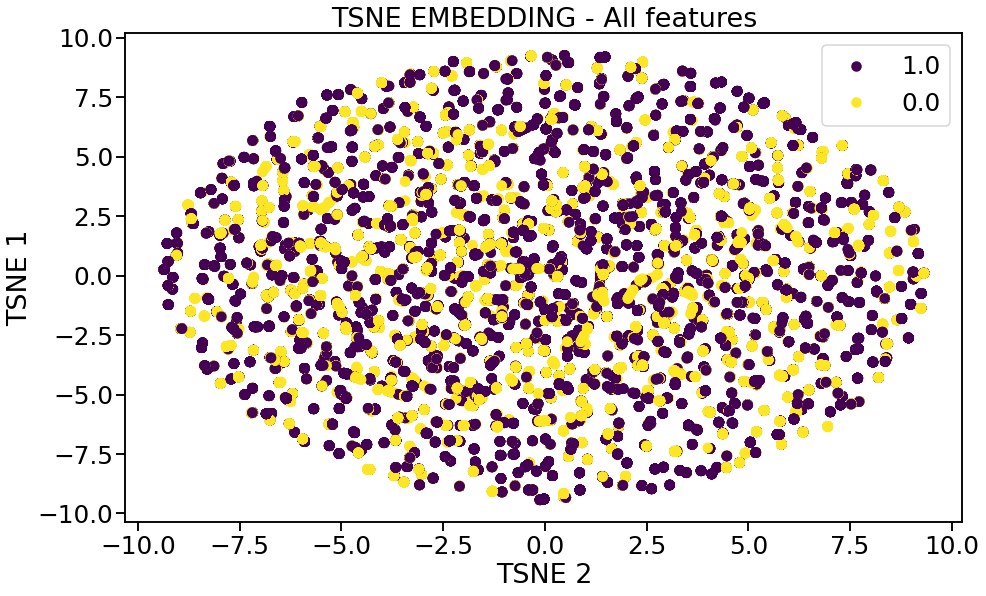

In [198]:
# Plot de resultado en 2 dimensiones
plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - All features')
scatter = plt.scatter(X_tsne_all[:,0], X_tsne_all[:,1], c=df_escalado_ML['incremento_monto'])
handles, _ = scatter.legend_elements(prop='colors')
plt.legend(handles, df_escalado_ML['incremento_monto'].unique())

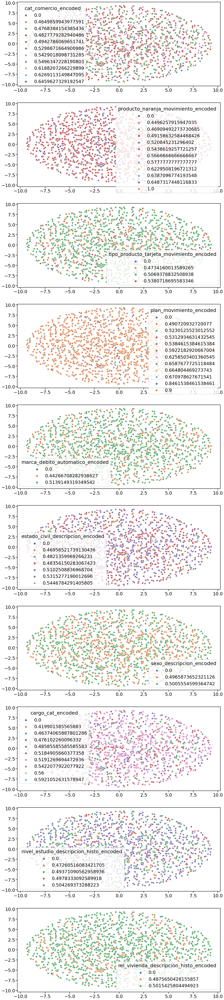

In [227]:
fig, axes = plt.subplots(10, 1, figsize=(20, 100))
for (idx, categoria) in enumerate(categorias):
    row = idx % 10
    sns.scatterplot(data=df_escalado_ML, x=X_tsne_all[:,0], y=X_tsne_all[:,1],
                    hue=categoria + '_encoded', ax=axes[row], palette="deep")  

Aplicamos KMeans sobre PCA con dos componentes principales:

Para n_clusters = 4 El silhouette_score promedio es : 0.6150905785626697
Para n_clusters = 6 El silhouette_score promedio es : 0.6466466256136758
Para n_clusters = 8 El silhouette_score promedio es : 0.6409953416694256
Para n_clusters = 10 El silhouette_score promedio es : 0.6270442711247297
Para n_clusters = 12 El silhouette_score promedio es : 0.5899101578031987
Para n_clusters = 14 El silhouette_score promedio es : 0.5550011599607575
Para n_clusters = 16 El silhouette_score promedio es : 0.5437199426004253


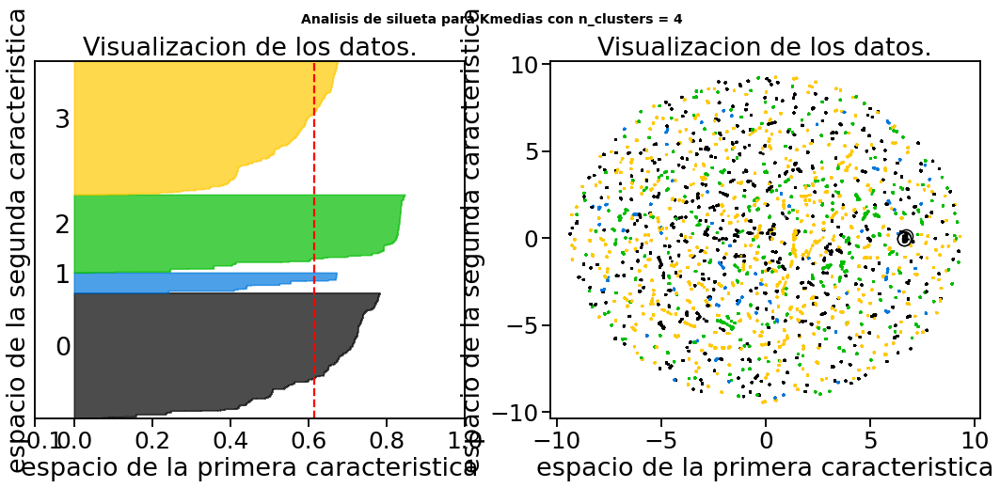

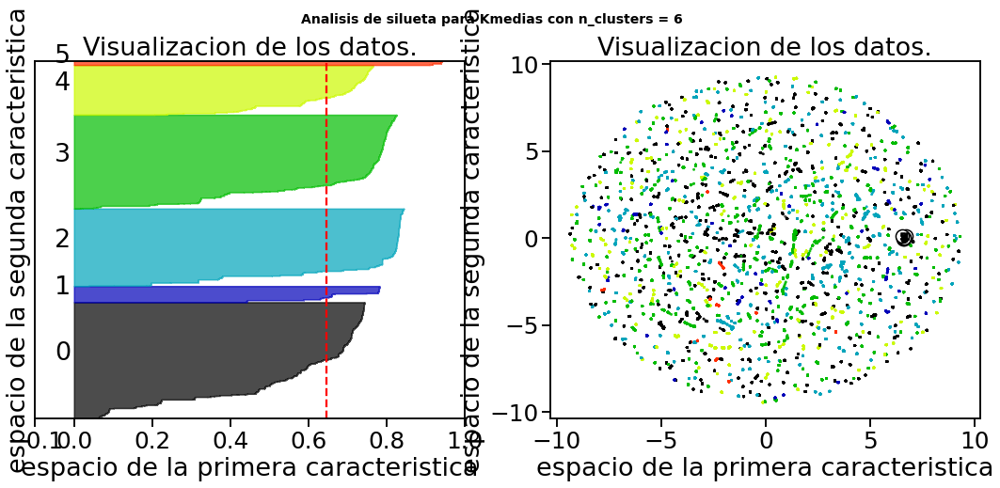

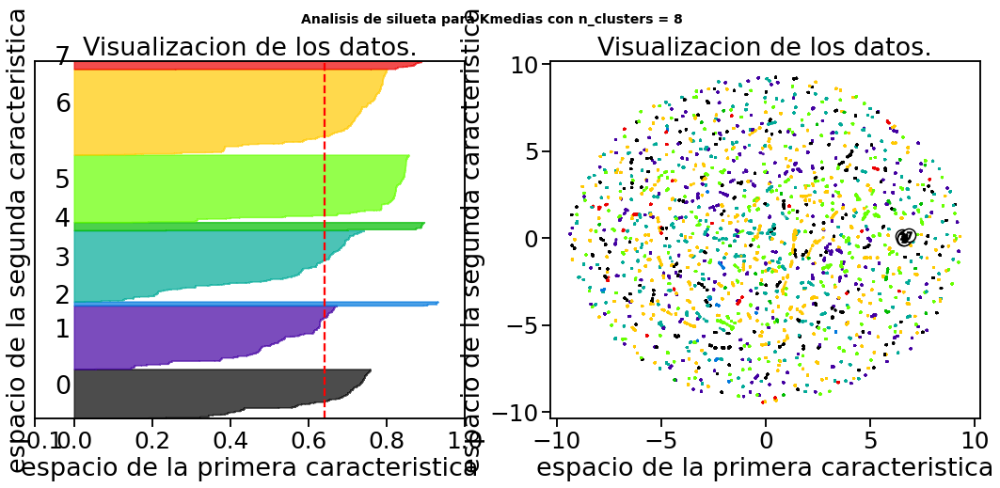

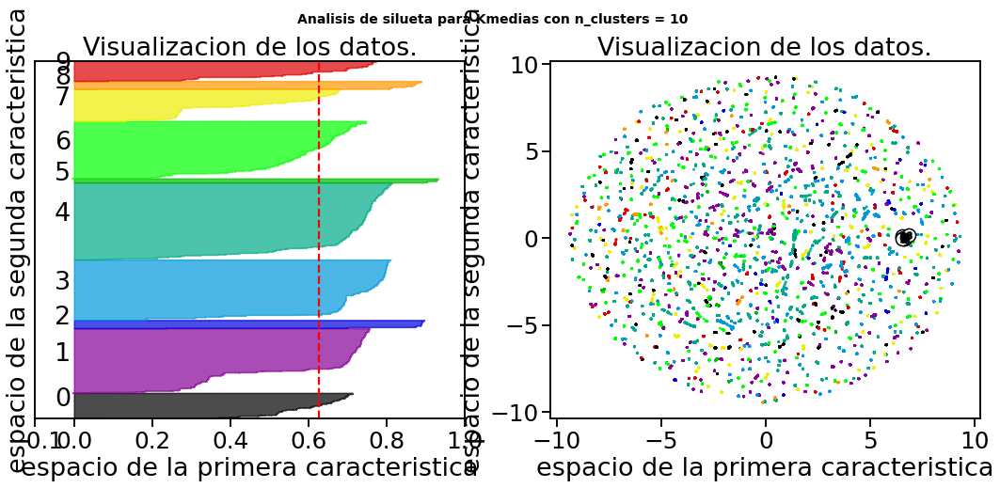

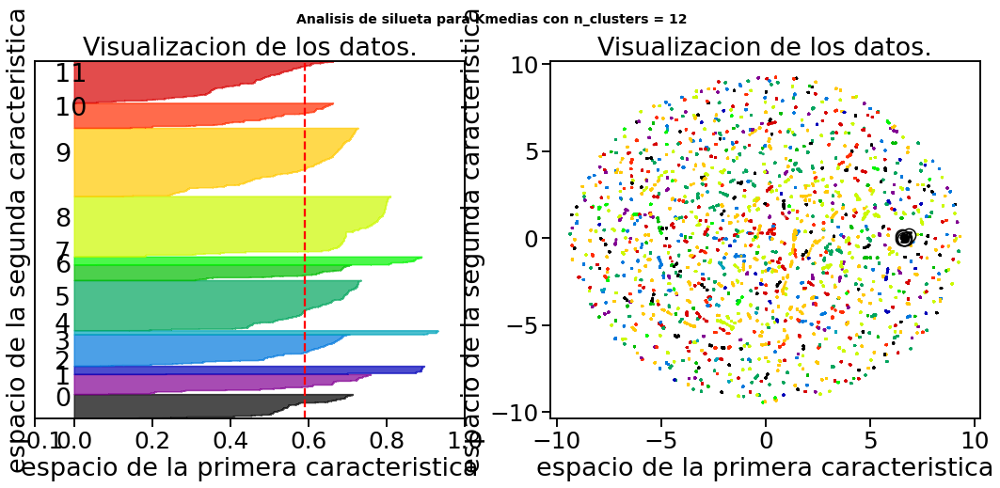

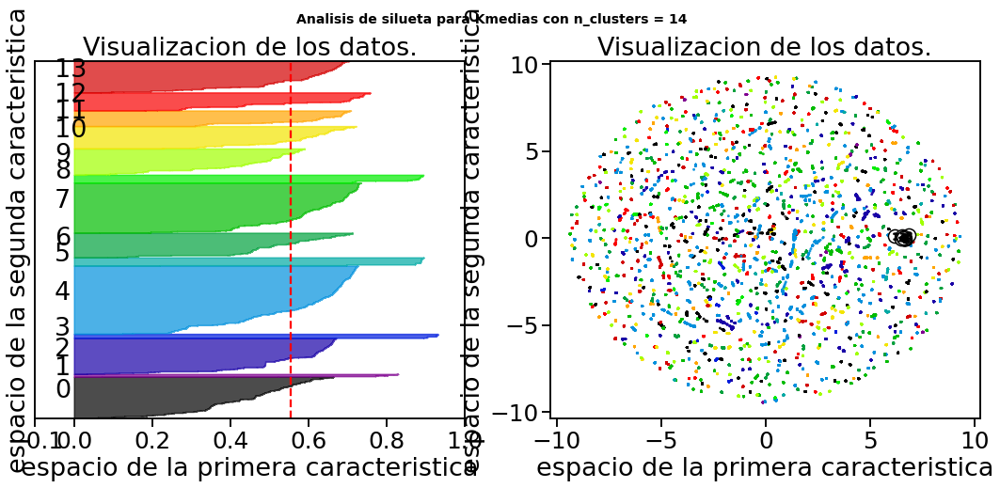

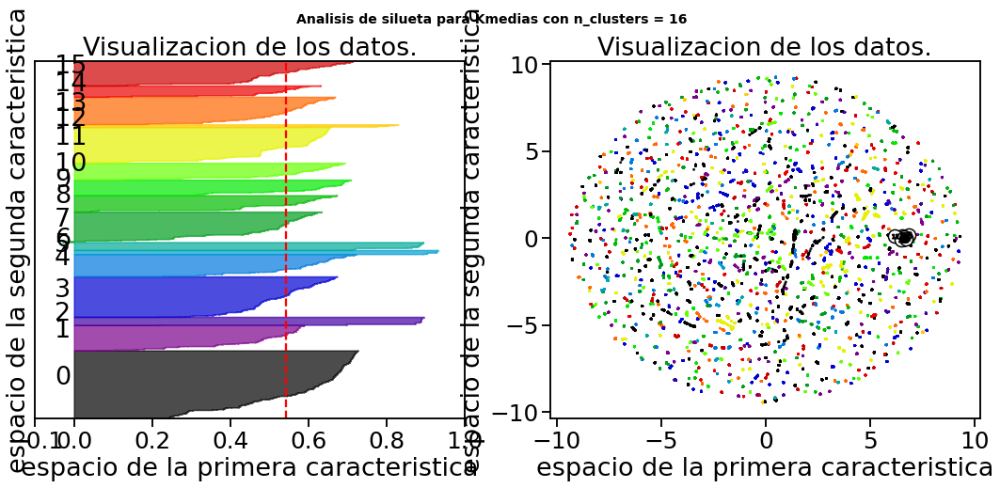

In [231]:
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# con DF- PCA
X = pca_df_total

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

### KMeans con datos originales

In [17]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=250, init='random', random_state = 15)
X_tsne_all = tsne.fit_transform(df_escalado_ML)

/home/mpccolorado/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 121836 samples in 0.001s...
[t-SNE] Computed neighbors for 121836 samples in 136.798s...
[t-SNE] Computed conditional probabilities for sample 1000 / 121836
[t-SNE] Computed conditional probabilities for sample 2000 / 121836
[t-SNE] Computed conditional probabilities for sample 3000 / 121836
[t-SNE] Computed conditional probabilities for sample 4000 / 121836
[t-SNE] Computed conditional probabilities for sample 5000 / 121836
[t-SNE] Computed conditional probabilities for sample 6000 / 121836
[t-SNE] Computed conditional probabilities for sample 7000 / 121836
[t-SNE] Computed conditional probabilities for sample 8000 / 121836
[t-SNE] Computed conditional probabilities for sample 9000 / 121836
[t-SNE] Computed conditional probabilities for sample 10000 / 121836
[t-SNE] Computed conditional probabilities for sample 11000 / 121836
[t-SNE] Computed conditional probabilities for sample 12000 / 121836
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 121836 / 121836
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.437202
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


Para n_clusters = 4 El silhouette_score promedio es : 0.6137885461346688
Para n_clusters = 6 El silhouette_score promedio es : 0.6448379133925223
Para n_clusters = 8 El silhouette_score promedio es : 0.637908623745841
Para n_clusters = 10 El silhouette_score promedio es : 0.6225583415120315
Para n_clusters = 12 El silhouette_score promedio es : 0.5833365656487219
Para n_clusters = 14 El silhouette_score promedio es : 0.5464773473101476
Para n_clusters = 16 El silhouette_score promedio es : 0.5326367571410099


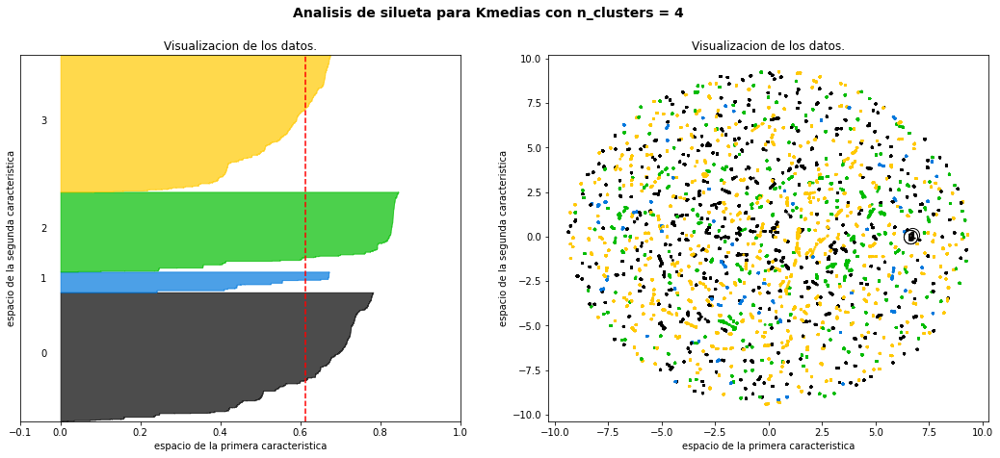

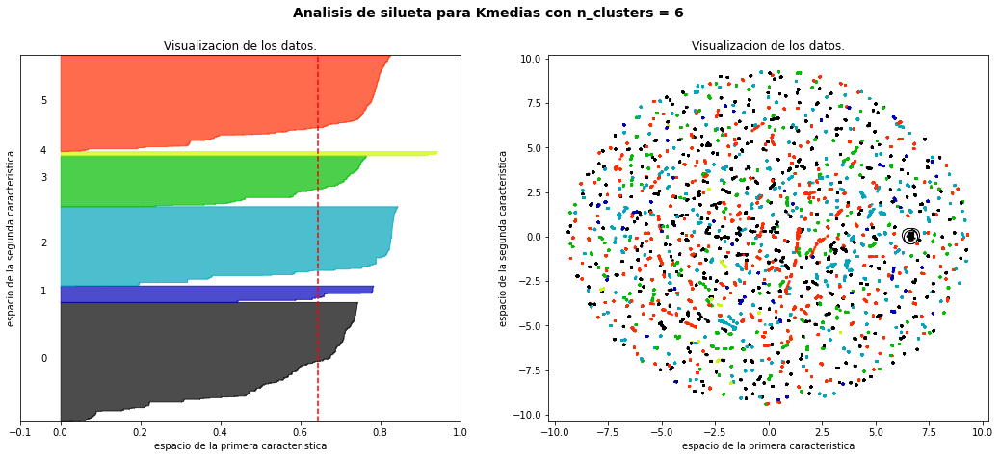

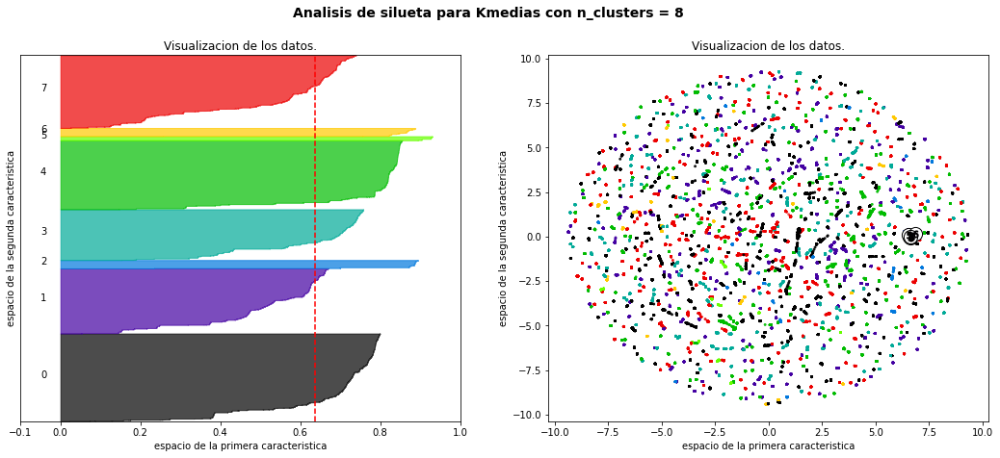

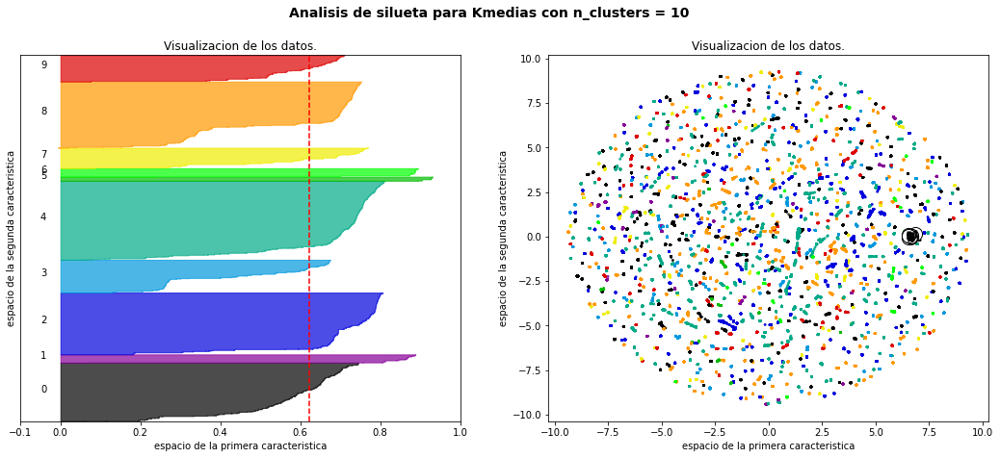

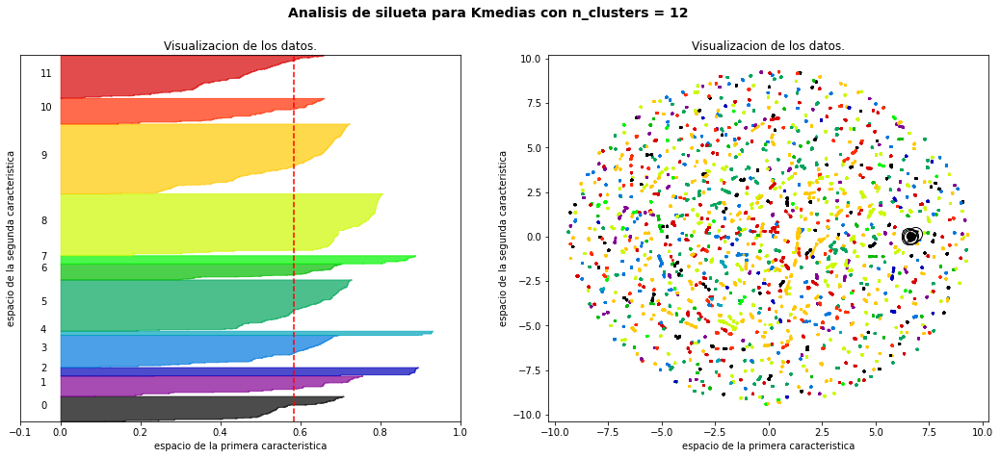

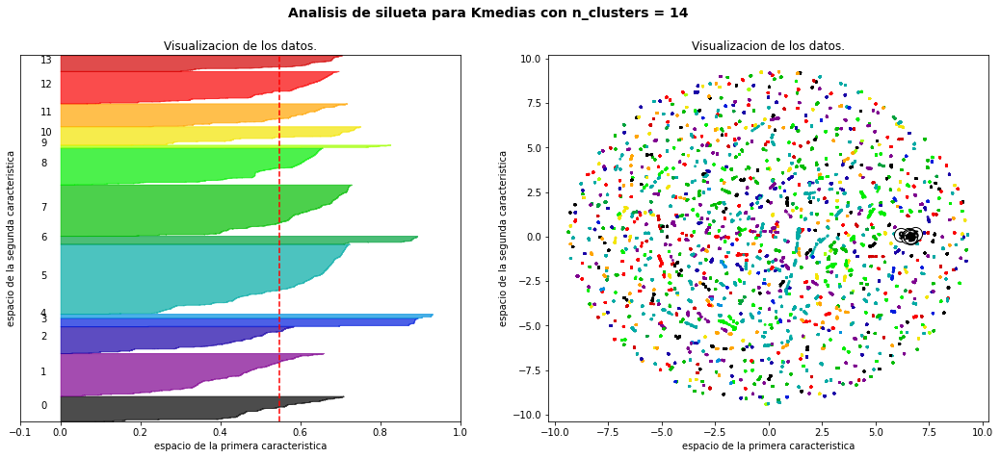

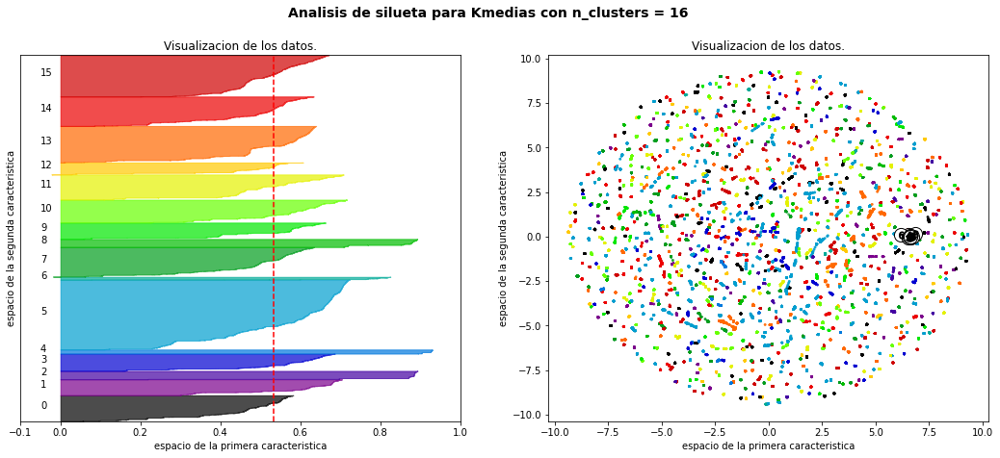

In [18]:
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# con DF- PCA
X = df_escalado_ML

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

In [134]:
sse

{4: 2189530481.8350344,
 6: 668337629.349126,
 8: 342558202.4899619,
 10: 193878575.3464673,
 12: 142069475.2597273,
 14: 113535599.81338501,
 16: 93526474.96074268}

In [137]:
sse.keys()

dict_keys([4, 6, 8, 10, 12, 14, 16])

In [138]:
sse.values()

dict_values([2189530481.8350344, 668337629.349126, 342558202.4899619, 193878575.3464673, 142069475.2597273, 113535599.81338501, 93526474.96074268])

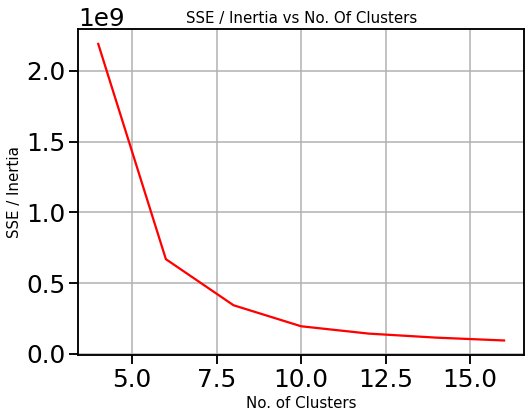

In [141]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(sse.keys(), sse.values(), color='red')
plt.xlabel('No. of Clusters', fontsize=15)
plt.ylabel('SSE / Inertia', fontsize=15)
plt.title('SSE / Inertia vs No. Of Clusters', fontsize=15)
plt.grid()
plt.show()

Podemos ver que alrededor de 6 encontramos un codo donde las diferencias entre los clusters empiezan a bajar significativamente después de este punto

### KMeans con 6 clusters

In [143]:
from sklearn.cluster import KMeans
k=6
kmeans = KMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

Podemos ver todos los centroides:

In [144]:
kmeans.cluster_centers_

array([[ 6.60162807e+00, -1.33276302e-02,  5.05233247e+01,
         9.22404799e+00,  4.10480343e+02,  5.14226669e-01,
         5.02448265e-01,  4.96846992e-01,  4.97891769e-01,
         4.98561938e-01,  4.99997190e-01,  4.96870534e-01,
         4.98659267e-01,  5.02608710e-01,  4.99719170e-01,
         4.98947089e-01],
       [ 6.64845412e+00, -3.08067734e-02,  4.62869884e+01,
         6.52090374e+00,  6.49246095e+02,  5.06634122e-01,
         5.00858511e-01,  5.02522016e-01,  4.99824354e-01,
         4.98158024e-01,  5.01391488e-01,  5.01385066e-01,
         4.98896127e-01,  5.00777737e-01,  4.99903842e-01,
         4.99254106e-01],
       [ 6.74367377e+00,  1.13438290e-01,  4.54758784e+01,
         1.21270708e+01,  1.47075204e+03,  4.79519388e-01,
         5.06242635e-01,  5.06126788e-01,  5.08342169e-01,
         5.01154139e-01,  4.96741775e-01,  5.02632219e-01,
         4.98217080e-01,  4.83615992e-01,  5.00104718e-01,
         4.97099693e-01],
       [ 6.64088963e+00,  1.24010173e

In [153]:
df_labels = pd.DataFrame(kmeans.labels_, columns = ['group'])
df_labels

,group
0,1
1,1
2,1
3,1
4,1
...,...
121831,3
121832,3
121833,3
121834,3


In [149]:
X.shape

(121836, 16)

In [176]:
df_with_groups = df_no_supervisado.join(df_labels)
for cat in categorias:
    df_with_groups.drop(cat + '_encoded', axis=1, inplace=True)
df_with_groups

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,3
121832,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,3
121833,0,0,0,0,5,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,3
121834,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,3


### Grupo 0

In [200]:
grupo_0 = df_with_groups[df_with_groups['group'] == 0]
grupo_0.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
502,0,PL,0,1,8,24.66,0,29.0,Sin Datos,Mujer,0.0,SD,SECUNDARIOS,Propia,463.700644,1.0,0
503,0,PL,0,1,8,102.53,0,29.0,Sin Datos,Mujer,0.0,SD,SECUNDARIOS,Propia,463.700644,1.0,0
504,0,PL,0,1,8,419.09,0,29.0,Sin Datos,Mujer,0.0,SD,SECUNDARIOS,Propia,463.700644,1.0,0
505,0,PL,0,1,8,2.25,0,29.0,Sin Datos,Mujer,0.0,SD,SECUNDARIOS,Propia,463.700644,1.0,0
506,0,PL,0,1,8,1.49,0,29.0,Sin Datos,Mujer,0.0,SD,SECUNDARIOS,Propia,463.700644,1.0,0


In [201]:
grupo_0.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,39679.000000,39679.000000,39679.000000,39679.000000,39679.000000,39679.000000,39679.0
mean,6.601628,1424.891489,50.523325,9.224048,410.480343,0.514227,0.0
std,3.967171,3043.140365,15.145333,6.029002,73.933380,0.499804,0.0
min,1.000000,-37447.950000,22.000000,0.000000,236.754249,0.000000,0.0
25%,3.000000,84.550000,38.000000,4.000000,345.824185,0.000000,0.0
50%,8.000000,351.610000,48.000000,9.000000,409.355849,1.000000,0.0
75%,10.000000,1391.000000,62.000000,13.000000,468.720325,1.000000,0.0
max,12.000000,55222.700000,109.000000,24.000000,525.567078,1.000000,0.0


In [202]:
for cat in categorias:
    print(grupo_0.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
0                         18701
1                          7384
5                          4654
9                          4384
3                          1995
6                          1263
2                          1142
4                           144
8                            12
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                       30372
VI                                        4346
SM                                        2336
ZE                                        1186
AV                                         982
PC                                         346
EX                                          40
MC                                          36
PN                                          28
PP                                           7
---------------------------------

### Grupo 1

In [194]:
grupo_1 = df_with_groups[df_with_groups['group'] == 1]
grupo_1.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,1


In [195]:
grupo_1.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,31956.000000,31956.000000,31956.000000,31956.000000,31956.000000,31956.000000,31956.0
mean,6.648454,1368.083144,46.286988,6.520904,649.246095,0.506634,1.0
std,3.954746,3138.291148,14.844175,4.416244,49.095365,0.499964,0.0
min,1.000000,-20206.740000,18.000000,0.000000,531.035032,0.000000,1.0
25%,3.000000,84.175000,34.000000,3.000000,627.970853,0.000000,1.0
50%,8.000000,364.500000,43.000000,6.000000,649.923969,1.000000,1.0
75%,10.000000,1201.485000,59.000000,9.000000,672.982970,1.000000,1.0
max,12.000000,42460.350000,88.000000,21.000000,754.690842,1.000000,1.0


In [196]:
for cat in categorias:
    print(grupo_1.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
0                         15991
9                          5875
1                          4848
5                          3998
2                           804
6                           368
3                            62
4                            10
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                       22950
VI                                        5466
SM                                        1738
ZE                                         798
PC                                         502
MC                                         228
AV                                         226
PN                                          22
PP                                          22
AX                                           2
EX                                           2
------------------

### Grupo 2

In [203]:
grupo_2 = df_with_groups[df_with_groups['group'] == 2]
grupo_2.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
32380,0,PL,0,1,8,2.31,0,60.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Propia,1331.323017,1.0,2
32381,0,PL,0,1,8,15.37,0,60.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Propia,1331.323017,1.0,2
32382,0,PL,0,1,8,258.09,0,60.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Propia,1331.323017,1.0,2
32383,0,PL,0,1,8,419.09,0,60.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Propia,1331.323017,1.0,2
32384,0,PL,0,1,8,7.25,0,60.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Propia,1331.323017,1.0,2


In [204]:
grupo_2.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,5493.000000,5493.000000,5493.000000,5493.000000,5493.000000,5493.000000,5493.0
mean,6.743674,1836.888924,45.475878,12.127071,1470.752043,0.479519,2.0
std,3.989313,3786.221279,12.642761,6.091427,153.440521,0.499626,0.0
min,1.000000,-7650.500000,21.000000,0.000000,1263.505605,0.000000,2.0
25%,3.000000,185.220000,33.000000,8.000000,1343.340018,0.000000,2.0
50%,8.000000,596.620000,47.000000,11.000000,1486.569168,0.000000,2.0
75%,10.000000,1914.770000,54.000000,17.000000,1607.039795,1.000000,2.0
max,12.000000,51068.730000,82.000000,23.000000,1740.084699,1.000000,2.0


In [205]:
for cat in categorias:
    print(grupo_2.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
9                          1880
0                          1735
1                           951
8                           392
5                           369
2                            92
7                            66
3                             8
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                        3481
VI                                        1488
SM                                         290
ZE                                         154
PC                                          54
AV                                          14
PN                                          12
--------------------------------------------------
                                  monto_normalizado
tipo_producto_tarjeta_movimiento                   
3                                              2504

### Grupo 3

In [206]:
grupo_3 = df_with_groups[df_with_groups['group'] == 3]
grupo_3.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
3278,0,PL,0,1,8,5.24,0,58.0,Divorciadoa,Mujer,21.0,RDO,TERCIARIOS,Propia,97.254085,1.0,3
3279,0,PL,0,1,8,4.63,0,58.0,Divorciadoa,Mujer,21.0,RDO,TERCIARIOS,Propia,97.254085,1.0,3
3280,1,PL,3,1,8,6162.13,1,58.0,Divorciadoa,Mujer,21.0,RDO,TERCIARIOS,Propia,97.254085,1.0,3
3281,1,PL,3,1,8,179.45,1,58.0,Divorciadoa,Mujer,21.0,RDO,TERCIARIOS,Propia,97.254085,1.0,3
3282,1,PL,3,1,8,425.65,1,58.0,Divorciadoa,Mujer,21.0,RDO,TERCIARIOS,Propia,97.254085,1.0,3


In [207]:
grupo_3.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,26393.00000,26393.000000,26393.000000,26393.000000,26393.000000,26393.000000,26393.0
mean,6.64089,1508.511257,47.925889,12.453302,58.923807,0.440344,3.0
std,3.86999,3213.562506,18.966694,8.719251,69.569915,0.496438,0.0
min,1.00000,-20246.800000,0.000000,0.000000,0.000000,0.000000,3.0
25%,3.00000,81.050000,38.000000,4.000000,2.528502,0.000000,3.0
50%,8.00000,351.610000,48.000000,12.000000,36.351685,0.000000,3.0
75%,10.00000,1400.400000,61.000000,22.000000,89.444636,1.000000,3.0
max,12.00000,48801.170000,100.000000,32.000000,230.890101,1.000000,3.0


In [208]:
for cat in categorias:
    print(grupo_3.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
0                         12849
1                          8971
5                          1570
9                          1450
2                          1347
3                           136
7                            30
6                            25
8                             8
4                             7
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                       20334
0                                         1810
VI                                        1438
SM                                        1388
ZE                                         858
AV                                         294
PC                                         137
EX                                          78
PN                                          40
MC                                          12
P

### Grupo 4

In [209]:
grupo_4 = df_with_groups[df_with_groups['group'] == 4]
grupo_4.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
1542,0,PL,0,1,8,8.60,0,28.0,Solteroa,Mujer,8.0,SD,PRIMARIOS,Otros,893.799033,0.0,4
1543,0,PL,0,1,8,3.87,0,28.0,Solteroa,Mujer,8.0,SD,PRIMARIOS,Otros,893.799033,0.0,4
1544,0,PL,0,1,8,419.09,0,28.0,Solteroa,Mujer,8.0,SD,PRIMARIOS,Otros,893.799033,0.0,4
1545,0,PL,0,1,8,141.97,0,28.0,Solteroa,Mujer,8.0,SD,PRIMARIOS,Otros,893.799033,0.0,4
1546,0,PL,0,1,8,209.08,0,28.0,Solteroa,Mujer,8.0,SD,PRIMARIOS,Otros,893.799033,0.0,4


In [210]:
grupo_4.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,16945.000000,16945.000000,16945.000000,16945.000000,16945.000000,16945.000000,16945.0
mean,6.640838,1544.858112,50.287459,8.978696,888.768038,0.493184,4.0
std,3.931830,3724.888705,16.087665,5.593955,66.411963,0.499968,0.0
min,1.000000,-38208.990000,22.000000,0.000000,784.026719,0.000000,4.0
25%,3.000000,84.550000,35.000000,4.000000,836.515808,0.000000,4.0
50%,8.000000,371.510000,48.000000,8.000000,893.799033,0.000000,4.0
75%,10.000000,1526.500000,65.000000,14.000000,935.735455,1.000000,4.0
max,12.000000,65099.700000,81.000000,24.000000,1134.927786,1.000000,4.0


In [211]:
for cat in categorias:
    print(grupo_4.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
0                          7437
1                          4188
9                          2524
5                          1496
2                           634
8                           302
7                           215
3                           126
6                            23
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                       12429
VI                                        2336
SM                                        1098
ZE                                         456
AV                                         296
PC                                         260
MC                                          34
PN                                          20
PP                                          12
TA                                           4
---------------------------------

### Grupo 5

In [212]:
grupo_5 = df_with_groups[df_with_groups['group'] == 5]
grupo_5.head()

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
68772,1,PL,3,1,8,318.01,1,51.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Otros,2352.22682,0.0,5
68773,0,PL,0,1,8,284.45,0,51.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Otros,2352.22682,0.0,5
68774,1,PL,3,1,8,73.17,1,51.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Otros,2352.22682,0.0,5
68775,1,PL,3,1,8,526.51,1,51.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Otros,2352.22682,0.0,5
68776,1,PL,3,1,8,514.68,1,51.0,Casadoa,Mujer,16.0,I,TERCIARIOS,Otros,2352.22682,0.0,5


In [215]:
grupo_5.describe()

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,group
count,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.0
mean,6.525547,1855.447219,38.167883,8.498540,2395.951491,0.474453,5.0
std,4.119615,3514.869984,11.181528,5.511294,58.524647,0.499529,0.0
min,1.000000,-700.200000,26.000000,3.000000,2352.226820,0.000000,5.0
25%,2.000000,187.207500,27.000000,4.250000,2352.226820,0.000000,5.0
50%,8.000000,511.750000,41.000000,6.000000,2352.226820,0.000000,5.0
75%,10.000000,2065.500000,51.000000,16.000000,2474.228448,1.000000,5.0
max,12.000000,31260.430000,59.000000,19.000000,2474.228448,1.000000,5.0


In [214]:
for cat in categorias:
    print(grupo_5.groupby(cat).count().sort_values('monto_normalizado',ascending=False)[['monto_normalizado']])
    print('--------------------------------------------------')

              monto_normalizado
cat_comercio                   
9                           518
0                           462
1                           189
5                           184
7                            16
2                             1
--------------------------------------------------
                             monto_normalizado
producto_naranja_movimiento                   
PL                                         882
VI                                         338
SM                                          98
ZE                                          50
PC                                           2
--------------------------------------------------
                                  monto_normalizado
tipo_producto_tarjeta_movimiento                   
3                                               648
99                                              380
0                                               342
--------------------------------------------------
  

### Descripciones de categorías por grupo

In [283]:
for cat in categorias:
    print(cat)
    print(df_with_groups.groupby('group')[cat].describe(include='all'))
    print('\n')

cat_comercio
       count unique top   freq
group                         
0      39679      9   0  18701
1      31956      8   0  15991
2       5493      8   9   1880
3      26393     10   0  12849
4      16945      9   0   7437
5       1370      6   9    518


producto_naranja_movimiento
       count unique top   freq
group                         
0      39679     10  PL  30372
1      31956     11  PL  22950
2       5493      7  PL   3481
3      26393     11  PL  20334
4      16945     10  PL  12429
5       1370      5  PL    882


tipo_producto_tarjeta_movimiento
       count unique top   freq
group                         
0      39679      3   3  18475
1      31956      3   0  13134
2       5493      3   3   2504
3      26393      3   3  12326
4      16945      3   3   8044
5       1370      3   3    648


plan_movimiento
       count unique top   freq
group                         
0      39679     11   1  37240
1      31956     10   1  29918
2       5493      9   1   4991
3    

### Descripciones de columnas numéricas por grupo

In [231]:
columnas = grupo_0.describe().columns.to_list()
columnas.pop()
columnas

['mes', 'monto_normalizado', 'edad', 'antig', 'distancia', 'incremento_monto']

In [285]:
for col_num in columnas:
    print(col_num)
    print(df_with_groups.groupby('group')[col_num].describe(include='all'))
    print('\n')

mes
         count      mean       std  min  25%  50%   75%   max
group                                                        
0      39679.0  6.601628  3.967171  1.0  3.0  8.0  10.0  12.0
1      31956.0  6.648454  3.954746  1.0  3.0  8.0  10.0  12.0
2       5493.0  6.743674  3.989313  1.0  3.0  8.0  10.0  12.0
3      26393.0  6.640890  3.869990  1.0  3.0  8.0  10.0  12.0
4      16945.0  6.640838  3.931830  1.0  3.0  8.0  10.0  12.0
5       1370.0  6.525547  4.119615  1.0  2.0  8.0  10.0  12.0


monto_normalizado
         count         mean          std       min       25%     50%  \
group                                                                  
0      39679.0  1424.891489  3043.140365 -37447.95   84.5500  351.61   
1      31956.0  1368.083144  3138.291148 -20206.74   84.1750  364.50   
2       5493.0  1836.888924  3786.221279  -7650.50  185.2200  596.62   
3      26393.0  1508.511257  3213.562506 -20246.80   81.0500  351.61   
4      16945.0  1544.858112  3724.888705 -38208.

---

### KMeans con datos originales (con distancia escalada)

In [10]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=250, init='random', random_state = 15)
X_tsne_all = tsne.fit_transform(df_escalado_ML_2)

/home/mpccolorado/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 121836 samples in 0.002s...
[t-SNE] Computed neighbors for 121836 samples in 139.865s...
[t-SNE] Computed conditional probabilities for sample 1000 / 121836
[t-SNE] Computed conditional probabilities for sample 2000 / 121836
[t-SNE] Computed conditional probabilities for sample 3000 / 121836
[t-SNE] Computed conditional probabilities for sample 4000 / 121836
[t-SNE] Computed conditional probabilities for sample 5000 / 121836
[t-SNE] Computed conditional probabilities for sample 6000 / 121836
[t-SNE] Computed conditional probabilities for sample 7000 / 121836
[t-SNE] Computed conditional probabilities for sample 8000 / 121836
[t-SNE] Computed conditional probabilities for sample 9000 / 121836
[t-SNE] Computed conditional probabilities for sample 10000 / 121836
[t-SNE] Computed conditional probabilities for sample 11000 / 121836
[t-SNE] Computed conditional probabilities for sample 12000 / 121836
[t-SNE] Computed conditional proba

[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.781250
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


Para n_clusters = 4 El silhouette_score promedio es : 0.36483436604027464
Para n_clusters = 6 El silhouette_score promedio es : 0.3042342535505398
Para n_clusters = 8 El silhouette_score promedio es : 0.3029322741973499
Para n_clusters = 10 El silhouette_score promedio es : 0.2865548359007985
Para n_clusters = 12 El silhouette_score promedio es : 0.28754071652514884
Para n_clusters = 14 El silhouette_score promedio es : 0.29031642919316747
Para n_clusters = 16 El silhouette_score promedio es : 0.2895674208797711


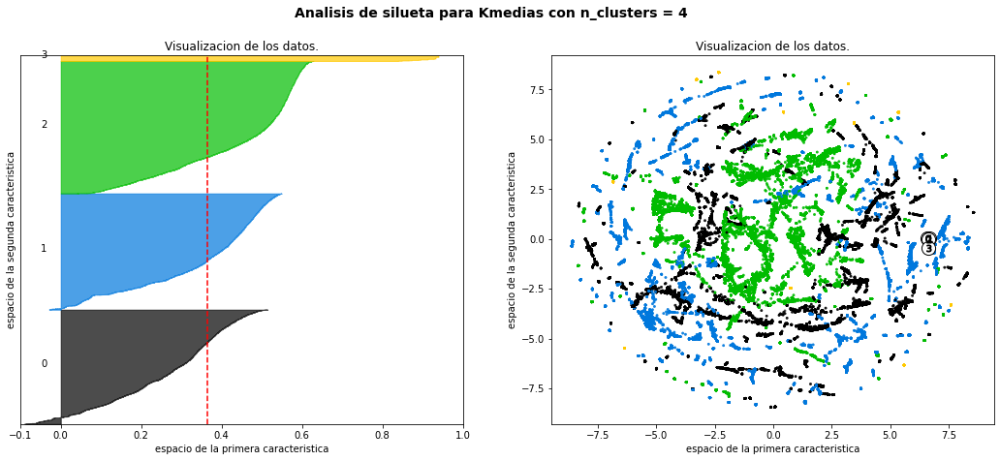

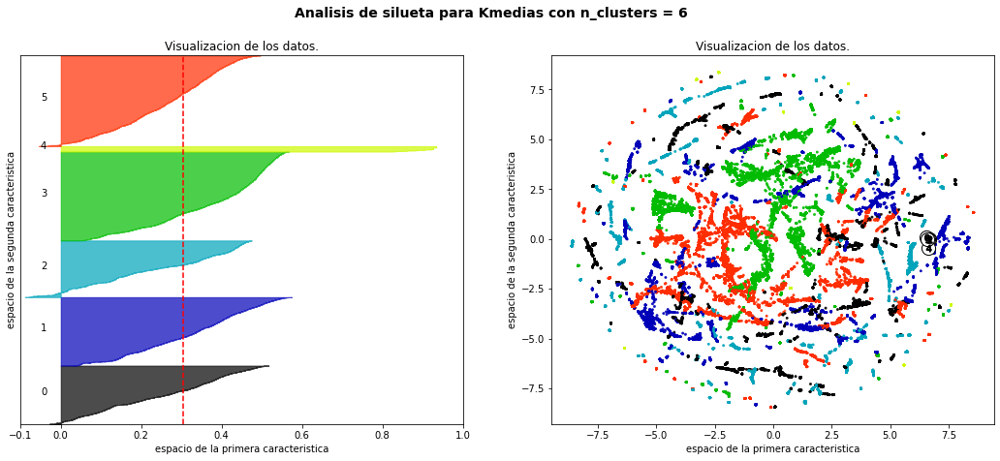

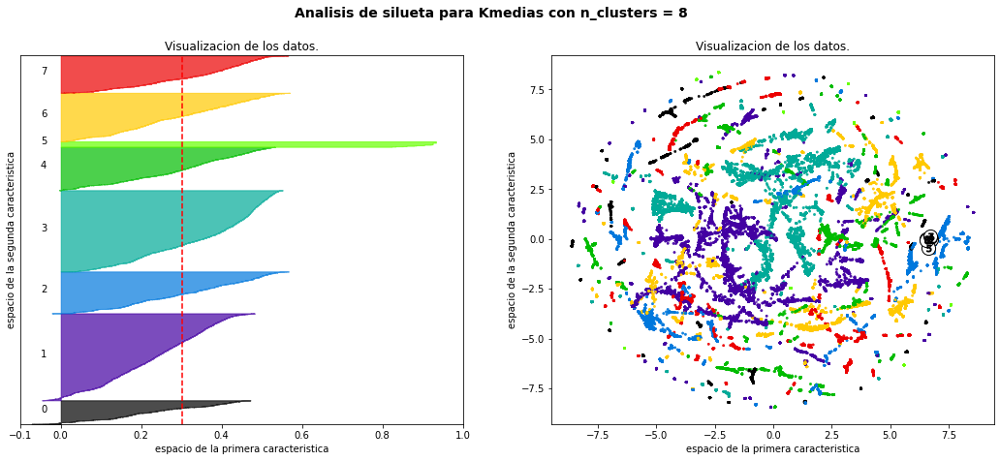

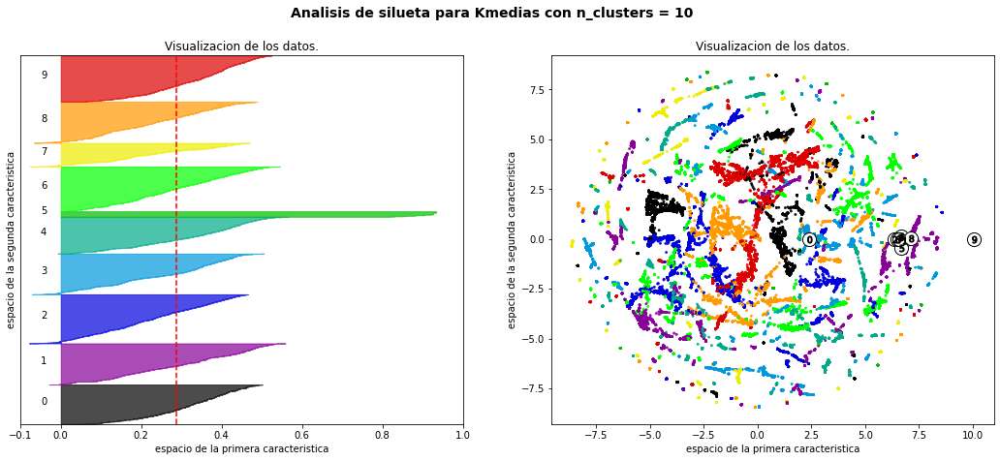

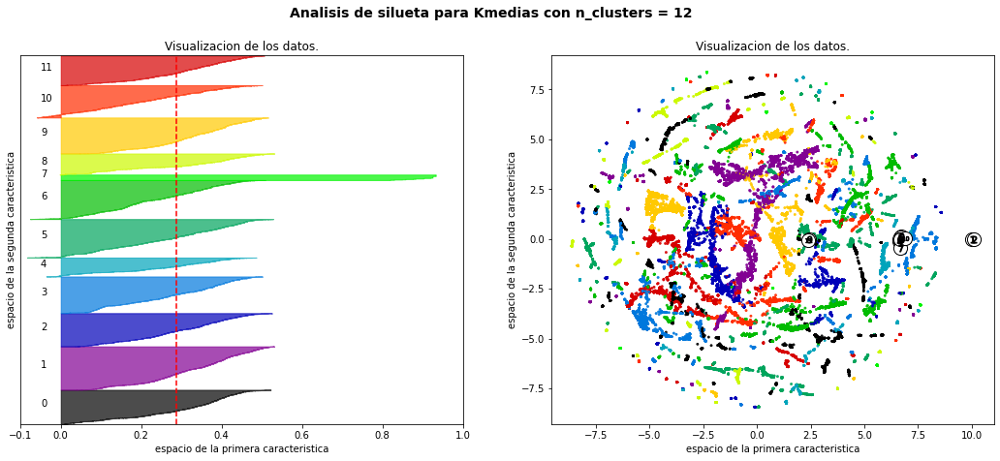

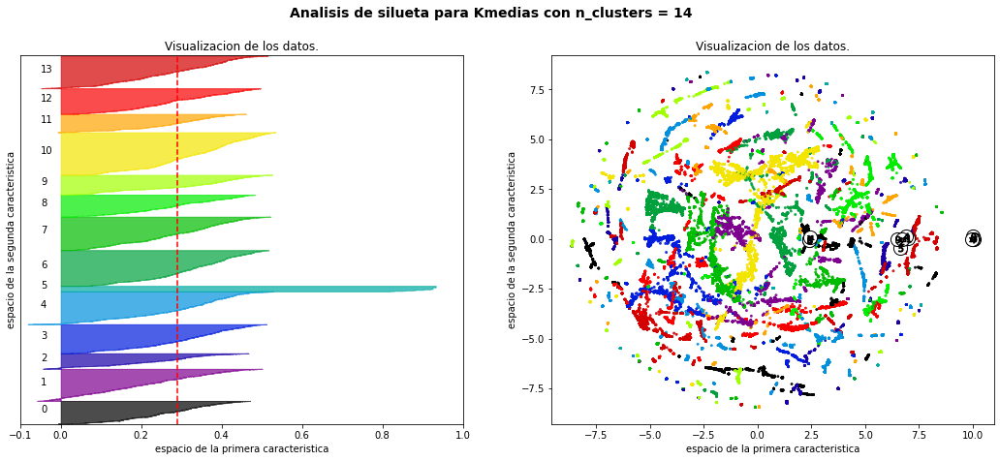

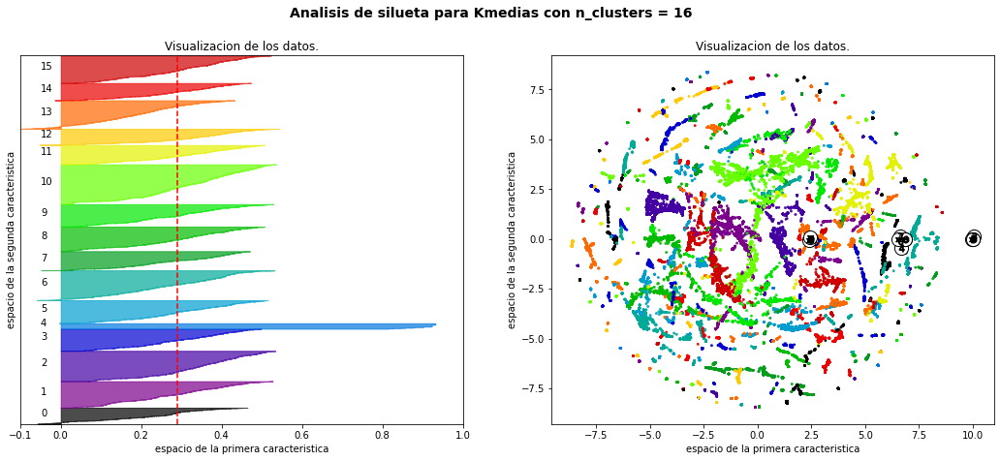

In [11]:
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# con DF- PCA
X = df_escalado_ML_2

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

In [12]:
sse

{4: 10212329.204392187,
 6: 7274729.95292628,
 8: 5660431.313887205,
 10: 4822635.868310686,
 12: 4226112.069276557,
 14: 3835031.4295233414,
 16: 3493792.663736536}

In [13]:
sse.keys()

dict_keys([4, 6, 8, 10, 12, 14, 16])

In [14]:
sse.values()

dict_values([10212329.204392187, 7274729.95292628, 5660431.313887205, 4822635.868310686, 4226112.069276557, 3835031.4295233414, 3493792.663736536])

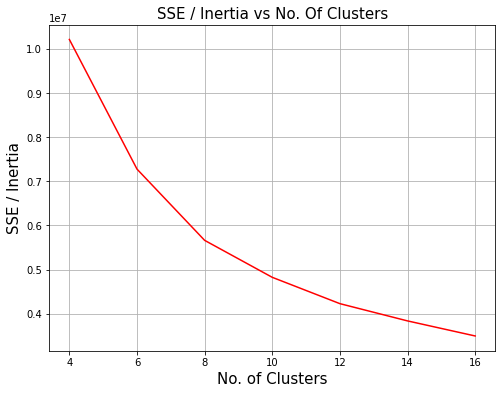

In [15]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(sse.keys(), sse.values(), color='red')
plt.xlabel('No. of Clusters', fontsize=15)
plt.ylabel('SSE / Inertia', fontsize=15)
plt.title('SSE / Inertia vs No. Of Clusters', fontsize=15)
plt.grid()
plt.show()

Podemos ver que alrededor de **8** encontramos un codo donde las diferencias entre los clusters empiezan a bajar significativamente después de este punto

### KMeans con 8 clusters

In [16]:
from sklearn.cluster import KMeans
k=8
kmeans = KMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

In [17]:
df_labels = pd.DataFrame(kmeans.labels_, columns = ['group'])
df_labels

,group
0,2
1,2
2,2
3,2
4,2
...,...
121831,6
121832,6
121833,6
121834,6


In [18]:
X.shape

(121836, 16)

In [19]:
df_with_groups = df_no_supervisado.join(df_labels)
for cat in categorias:
    df_with_groups.drop(cat + '_encoded', axis=1, inplace=True)
df_with_groups

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,2
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,2
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,2
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,2
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.36727,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121831,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,6
121832,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,6
121833,0,0,0,0,5,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,6
121834,0,0,0,0,7,0.00,0,0.0,0,0,0.0,0,0,0,0.00000,0.0,6


### Descripciones de categorías por grupo

In [20]:
for cat in categorias:
    print(cat)
    print(df_with_groups.groupby('group')[cat].describe(include='all'))
    print('\n')

cat_comercio
       count unique top   freq
group                         
0      26903     10   0  13758
1      13834     10   0   6063
2      15857     10   0   7420
3      28509     10   0  13889
4       8209      9   0   3343
5      13916     10   0   6011
6       1810      1   0   1810
7      12798     10   0   4881


producto_naranja_movimiento
       count unique top   freq
group                         
0      26903     10  PL  19639
1      13834     10  PL  10356
2      15857      9  PL  11602
3      28509     11  PL  21273
4       8209      8  PL   6614
5      13916      8  PL  11162
6       1810      1   0   1810
7      12798      9  PL   9802


tipo_producto_tarjeta_movimiento
       count unique top   freq
group                         
0      26903      3   0  11379
1      13834      3   3   6337
2      15857      3   3   6686
3      28509      3   0  12086
4       8209      3   3   4380
5      13916      3   3   7186
6       1810      1   0   1810
7      12798      3   3

### Descripciones de columnas numéricas por grupo

In [23]:
columnas = df_with_groups.describe().columns.to_list()
columnas.pop()
columnas

['mes', 'monto_normalizado', 'edad', 'antig', 'distancia', 'incremento_monto']

In [24]:
for col_num in columnas:
    print(col_num)
    print(df_with_groups.groupby('group')[col_num].describe(include='all'))
    print('\n')

mes
         count      mean       std  min  25%  50%   75%   max
group                                                        
0      26903.0  6.571944  3.977982  1.0  3.0  8.0  10.0  12.0
1      13834.0  6.760373  3.918388  1.0  3.0  8.0  10.0  12.0
2      15857.0  6.598348  3.946467  1.0  3.0  8.0  10.0  12.0
3      28509.0  6.625171  3.953189  1.0  3.0  8.0  10.0  12.0
4       8209.0  6.514923  3.960121  1.0  3.0  8.0  10.0  12.0
5      13916.0  6.695099  3.969967  1.0  3.0  8.0  10.0  12.0
6       1810.0  6.657459  2.701434  1.0  5.0  7.0   8.0  12.0
7      12798.0  6.692764  3.952045  1.0  3.0  8.0  10.0  12.0


monto_normalizado
         count         mean          std       min       25%      50%  \
group                                                                   
0      26903.0  1428.721612  3179.562409 -29817.72   86.8500  366.070   
1      13834.0  1347.384433  3320.533504 -38208.99   88.9600  366.070   
2      15857.0  1329.071387  2947.764008 -15066.00   85.9100  36

# No balanceado

Leemos los datos del disco:

In [3]:
df_no_balanceado = pd.read_parquet("/home/mpccolorado/data_no_supervisado_no_balanceado.parquet")

### Eliminamos columnas que no usaremos en el estudio

In [4]:
df_no_balanceado.drop(
    [
        'dni_titular_movimiento',
        'mes-año'
    ],
    axis=1, inplace=True)

In [5]:
df_no_balanceado

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,,,,,,
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120021,5,PL,3,1,3,290.25,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120022,0,ZE,3,1,5,3679.00,0,28.0,Solteroa,Mujer,...,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120023,0,ZE,3,1,5,3679.00,0,28.0,Solteroa,Mujer,...,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### Normalizar

Escalamos las variables *monto_normalizado y distancia*:

In [6]:
from sklearn.pipeline import Pipeline

features = df_no_balanceado.columns.to_list()

standard_scaler = StandardScaler()

df_escalado = df_no_balanceado.copy()
df_escalado['monto_normalizado'] = standard_scaler.fit_transform(df_escalado[['monto_normalizado']])
df_escalado['distancia'] = standard_scaler.fit_transform(df_escalado[['distancia']])
df_escalado

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,,,,,,
0,0,PL,0,1,8,-0.453188,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,-0.423060,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,-0.396279,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,-0.327658,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,-0.396260,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120021,5,PL,3,1,3,-0.367066,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120022,0,ZE,3,1,5,0.669428,0,28.0,Solteroa,Mujer,...,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120023,0,ZE,3,1,5,0.669428,0,28.0,Solteroa,Mujer,...,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### División del DF con datos sólo numéricos

In [8]:
categorias = [
    "cat_comercio",
    "producto_naranja_movimiento",
    "tipo_producto_tarjeta_movimiento",
    "plan_movimiento",
    "marca_debito_automatico",
    "estado_civil_descripcion",
    "sexo_descripcion",
    "cargo_cat",
    "nivel_estudio_descripcion_histo",
    "rel_vivienda_descripcion_histo"
]

In [9]:
df_escalado_ML = df_escalado.copy()
df_escalado_ML.drop(categorias, axis=1, inplace=True)
df_escalado_ML

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,
0,8,-0.453188,61.0,8.0,0.246944,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,8,-0.423060,61.0,8.0,0.246944,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,8,-0.396279,61.0,8.0,0.246944,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,8,-0.327658,61.0,8.0,0.246944,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,8,-0.396260,61.0,8.0,0.246944,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120021,3,-0.367066,28.0,0.0,-0.075389,1.0,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120022,5,0.669428,28.0,0.0,-0.075389,1.0,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120023,5,0.669428,28.0,0.0,-0.075389,1.0,0.482778,0.520845,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### KMeans con datos originales (con distancia escalada)

In [10]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=250, init='random', random_state = 15)
X_tsne_all = tsne.fit_transform(df_escalado_ML)

/home/mpccolorado/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 120026 samples in 0.002s...
[t-SNE] Computed neighbors for 120026 samples in 133.250s...
[t-SNE] Computed conditional probabilities for sample 1000 / 120026
[t-SNE] Computed conditional probabilities for sample 2000 / 120026
[t-SNE] Computed conditional probabilities for sample 3000 / 120026
[t-SNE] Computed conditional probabilities for sample 4000 / 120026
[t-SNE] Computed conditional probabilities for sample 5000 / 120026
[t-SNE] Computed conditional probabilities for sample 6000 / 120026
[t-SNE] Computed conditional probabilities for sample 7000 / 120026
[t-SNE] Computed conditional probabilities for sample 8000 / 120026
[t-SNE] Computed conditional probabilities for sample 9000 / 120026
[t-SNE] Computed conditional probabilities for sample 10000 / 120026
[t-SNE] Computed conditional probabilities for sample 11000 / 120026
[t-SNE] Computed conditional probabilities for sample 12000 / 120026
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 119000 / 120026
[t-SNE] Computed conditional probabilities for sample 120000 / 120026
[t-SNE] Computed conditional probabilities for sample 120026 / 120026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.648048
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


Para n_clusters = 4 El silhouette_score promedio es : 0.3293384563123845
Para n_clusters = 6 El silhouette_score promedio es : 0.3002502697962201
Para n_clusters = 8 El silhouette_score promedio es : 0.27948773623671563
Para n_clusters = 10 El silhouette_score promedio es : 0.27045053874468356
Para n_clusters = 12 El silhouette_score promedio es : 0.2819378480229266
Para n_clusters = 14 El silhouette_score promedio es : 0.27956969249957625
Para n_clusters = 16 El silhouette_score promedio es : 0.2781401933435842


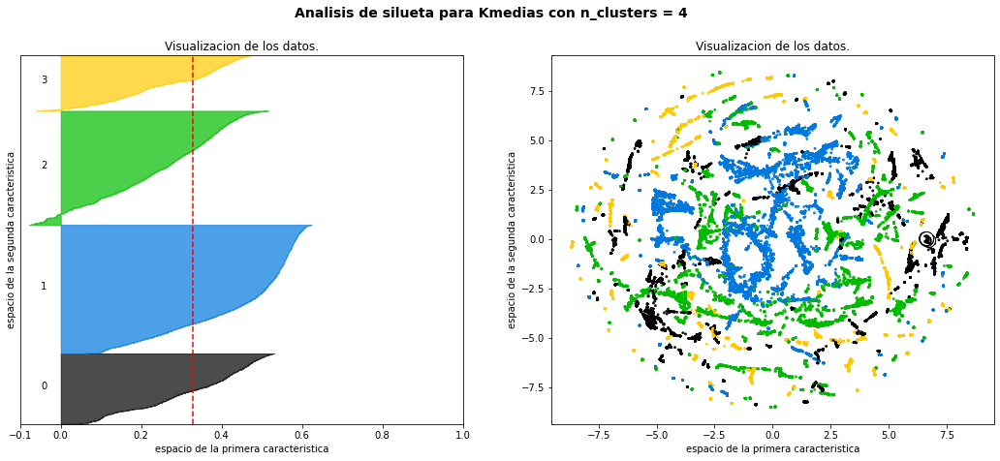

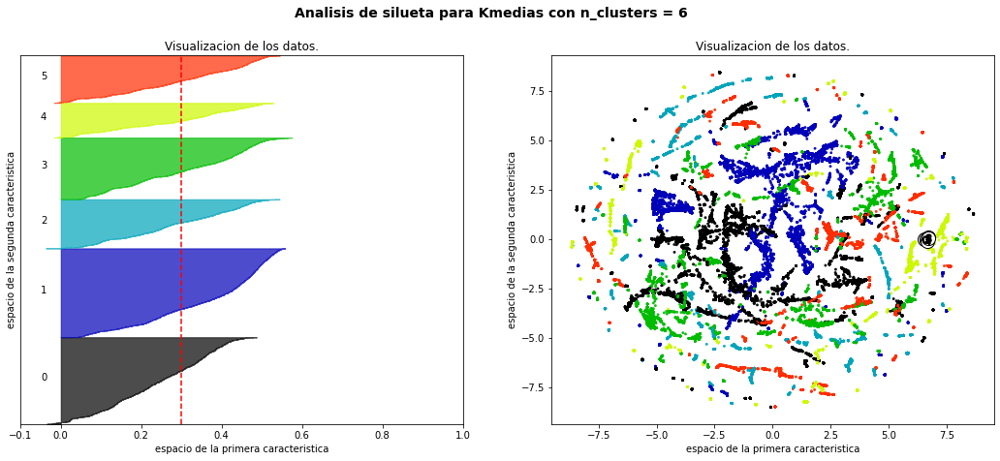

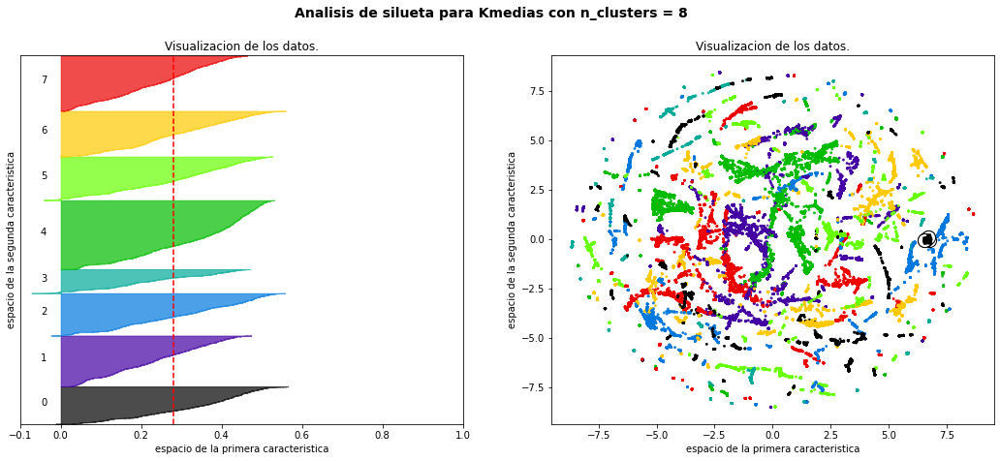

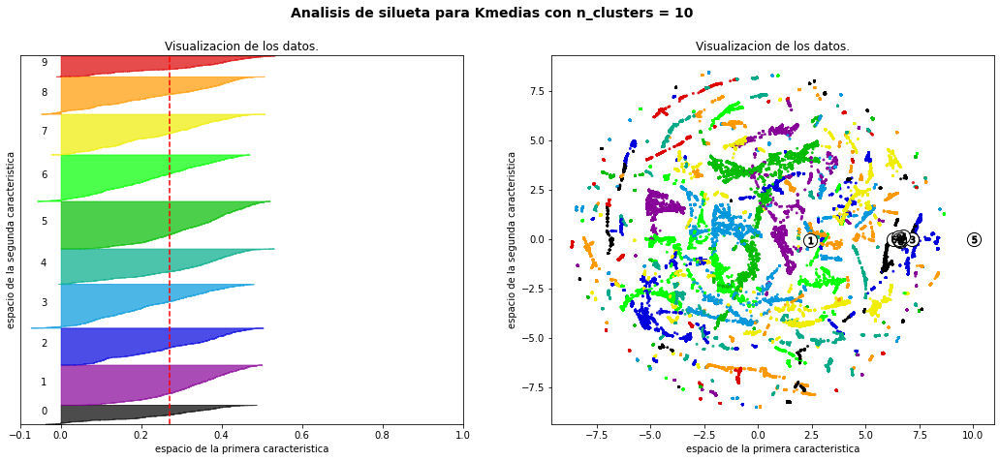

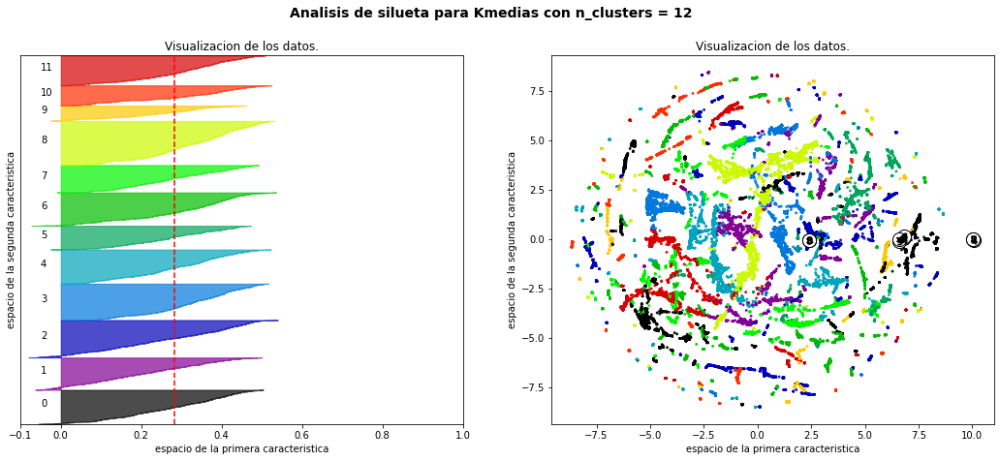

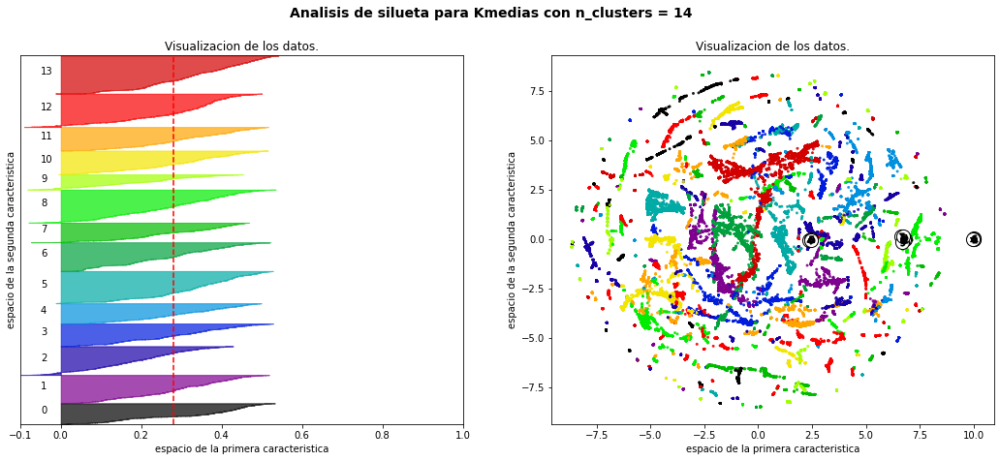

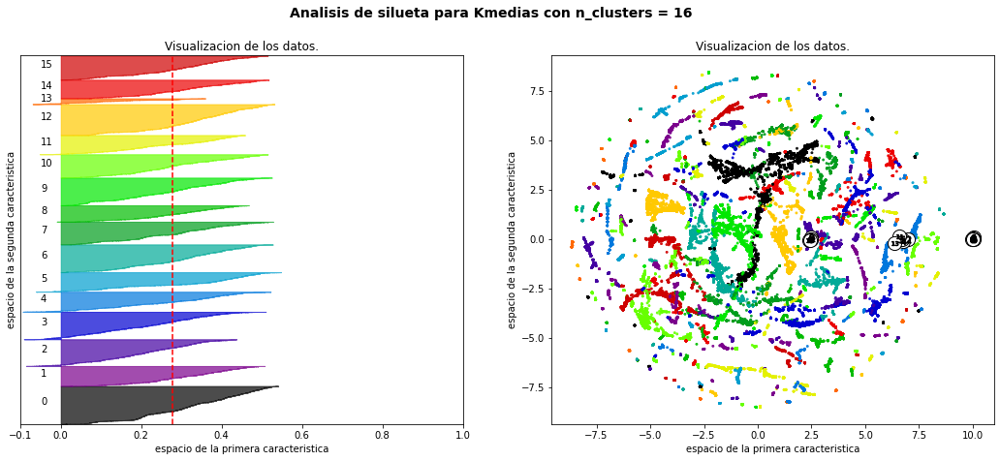

In [11]:
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# con DF- PCA
X = df_escalado_ML

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

In [12]:
sse

{4: 8664344.491704827,
 6: 6278409.961203365,
 8: 5178490.219136715,
 10: 4473721.678234432,
 12: 4002103.538934524,
 14: 3643146.0871565742,
 16: 3326571.653585862}

In [13]:
sse.keys()

dict_keys([4, 6, 8, 10, 12, 14, 16])

In [14]:
sse.values()

dict_values([8664344.491704827, 6278409.961203365, 5178490.219136715, 4473721.678234432, 4002103.538934524, 3643146.0871565742, 3326571.653585862])

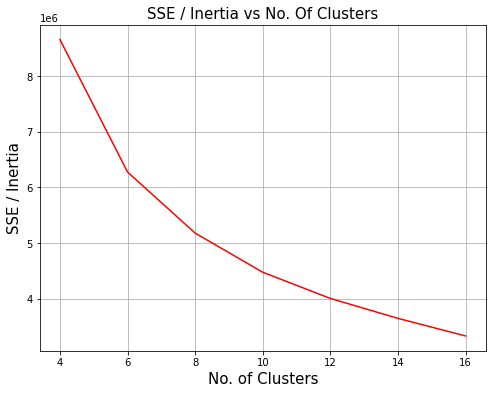

In [15]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(sse.keys(), sse.values(), color='red')
plt.xlabel('No. of Clusters', fontsize=15)
plt.ylabel('SSE / Inertia', fontsize=15)
plt.title('SSE / Inertia vs No. Of Clusters', fontsize=15)
plt.grid()
plt.show()

Podemos ver que alrededor de **6** encontramos un codo donde las diferencias entre los clusters empiezan a bajar significativamente después de este punto

### KMeans con 6 clusters

In [16]:
from sklearn.cluster import KMeans
k=6
kmeans = KMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

In [17]:
df_labels = pd.DataFrame(kmeans.labels_, columns = ['group'])
df_labels

,group
0,0
1,0
2,0
3,0
4,0
...,...
120021,4
120022,4
120023,4
120024,1


In [18]:
X.shape

(120026, 16)

In [20]:
df_with_groups = df_no_balanceado.join(df_labels)
for cat in categorias:
    df_with_groups.drop(cat + '_encoded', axis=1, inplace=True)
df_with_groups

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
index,,,,,,,,,,,,,,,,,
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120021,5,PL,3,1,3,290.25,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4
120022,0,ZE,3,1,5,3679.00,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4
120023,0,ZE,3,1,5,3679.00,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4


### Descripciones de categorías por grupo

In [21]:
for cat in categorias:
    print(cat)
    print(df_with_groups.groupby('group')[cat].describe(include='all'))
    print('\n')

cat_comercio
       count unique top   freq
group                         
0      20452     10   0   9317
1      28806     10   0  13994
2      15136     10   0   6554
3      11304     10   0   5069
4      28204     10   0  14424
5      16124     10   0   6007


producto_naranja_movimiento
       count unique top   freq
group                         
0      20452     11  PL  15077
1      28806     11  PL  21684
2      15136      9  PL  12024
3      11304      9  PL   8585
4      28204     10  PL  20492
5      16124      8  PL  12586


tipo_producto_tarjeta_movimiento
       count unique top   freq
group                         
0      20452      3   3   9190
1      28806      3   0  12177
2      15136      3   3   7678
3      11304      3   3   4974
4      28204      3   0  11954
5      16124      3   3   9105


plan_movimiento
       count unique top   freq
group                         
0      20452     11   1  19026
1      28806     11   1  26919
2      15136     10   1  14296
3    

### Descripciones de columnas numéricas por grupo

In [22]:
columnas = df_with_groups.describe().columns.to_list()
columnas.pop()
columnas

['mes', 'monto_normalizado', 'edad', 'antig', 'distancia', 'incremento_monto']

In [23]:
for col_num in columnas:
    print(col_num)
    print(df_with_groups.groupby('group')[col_num].describe(include='all'))
    print('\n')

mes
         count      mean       std  min  25%  50%   75%   max
group                                                        
0      20452.0  6.622384  3.942007  1.0  3.0  8.0  10.0  12.0
1      28806.0  6.580296  3.956515  1.0  3.0  8.0  10.0  12.0
2      15136.0  6.684791  3.969400  1.0  3.0  8.0  10.0  12.0
3      11304.0  6.649947  3.929101  1.0  3.0  8.0  10.0  12.0
4      28204.0  6.615835  3.977807  1.0  3.0  8.0  10.0  12.0
5      16124.0  6.710556  3.944540  1.0  3.0  8.0  10.0  12.0


monto_normalizado
         count         mean          std       min       25%     50%  \
group                                                                  
0      20452.0  1460.364938  3418.763281 -38208.99   91.1125  380.53   
1      28806.0  1425.188515  3175.771805 -20246.80   84.5500  339.55   
2      15136.0  1742.659316  3775.853296 -37447.95   92.6200  380.53   
3      11304.0  1142.828537  2392.302334 -12302.42   83.5300  351.61   
4      28204.0  1425.610912  3168.068877 -29817.

In [67]:
import matplotlib.pyplot as plt

def show_charts(dataframe, title):
    filas = 5
    columnas = 2
    fig, ax = plt.subplots(filas,columnas, figsize=(20, 25), constrained_layout=True)
    for i, categoria in enumerate(categorias):
        fila = int(i / columnas)
        columna = i % columnas
        dataframe[categoria].value_counts().plot(kind='bar', ax=ax[fila][columna]).set_title(categoria)
    fig.suptitle(title, fontsize=22)
    fig.show()

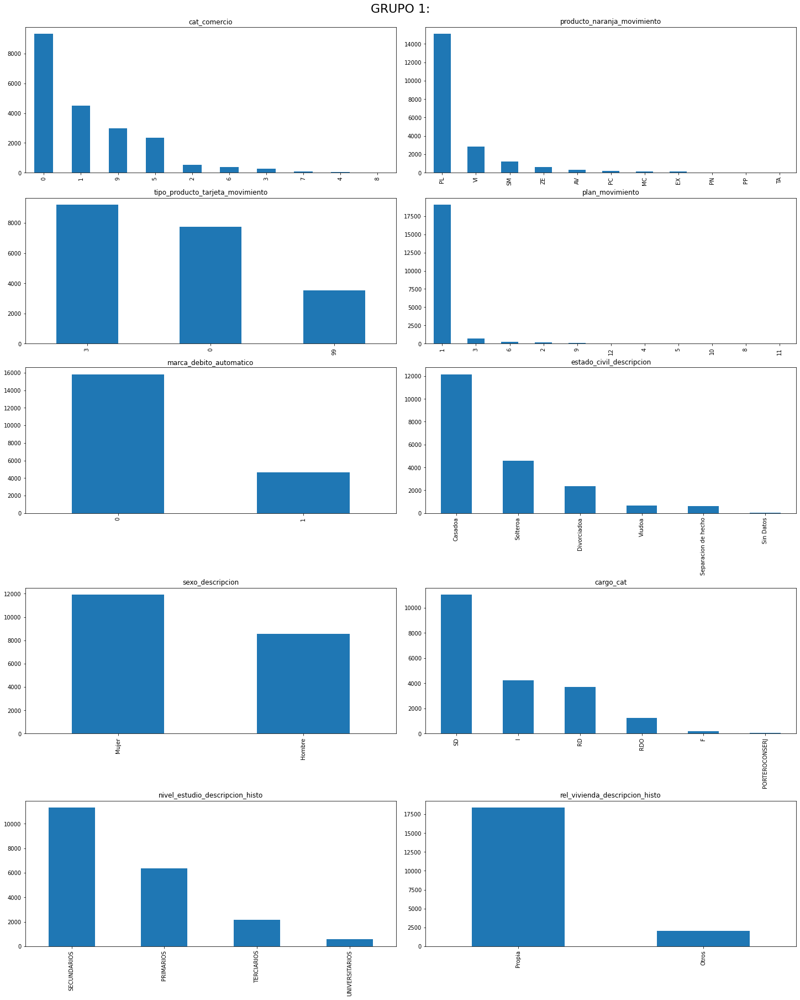

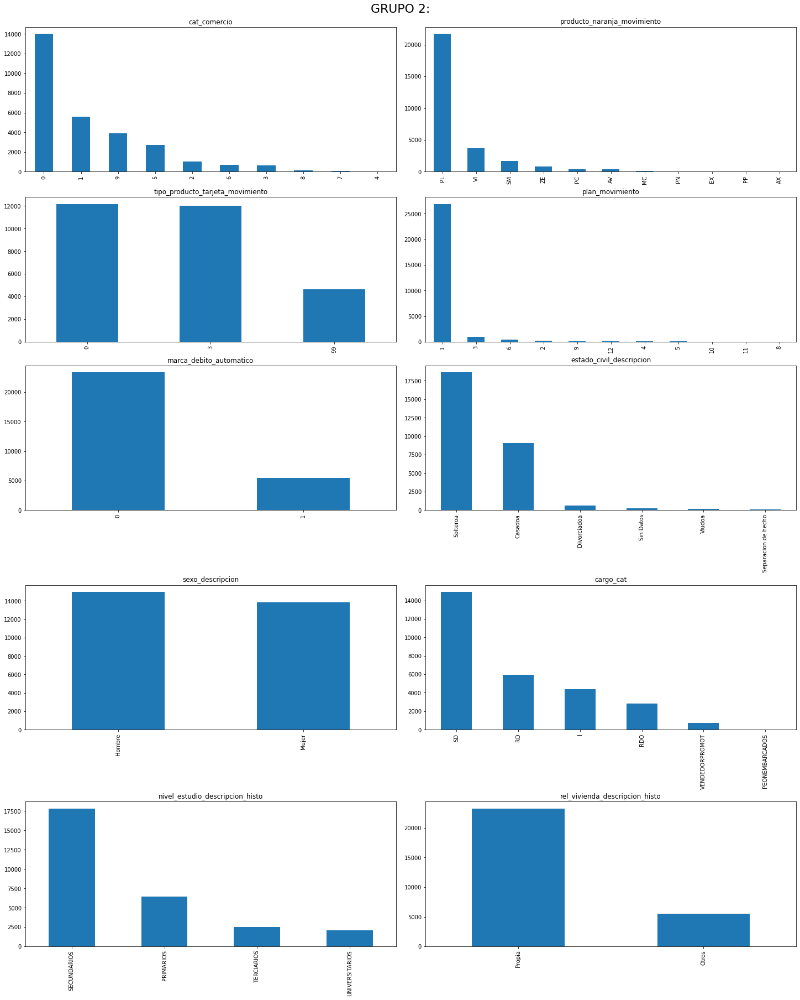

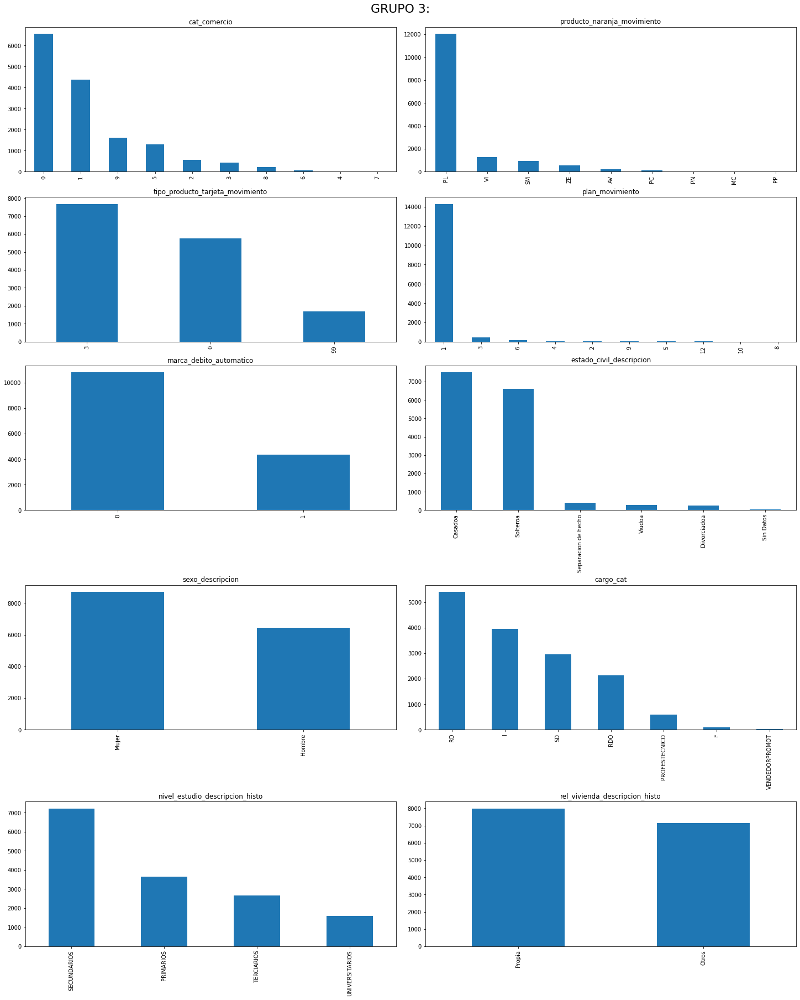

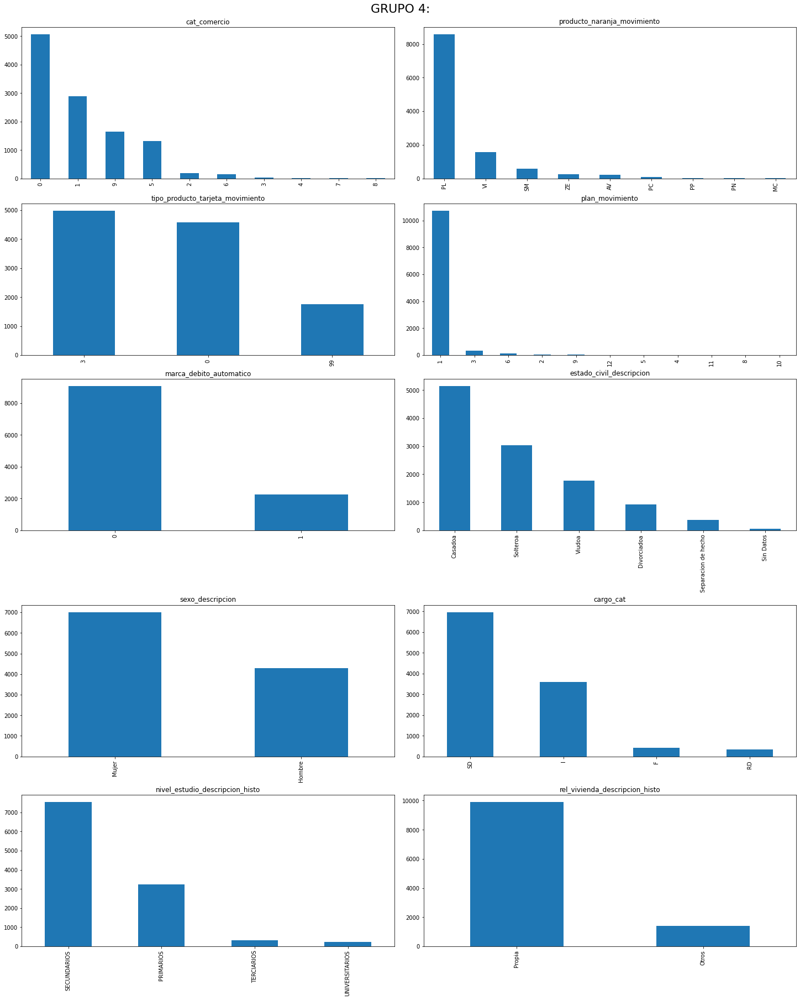

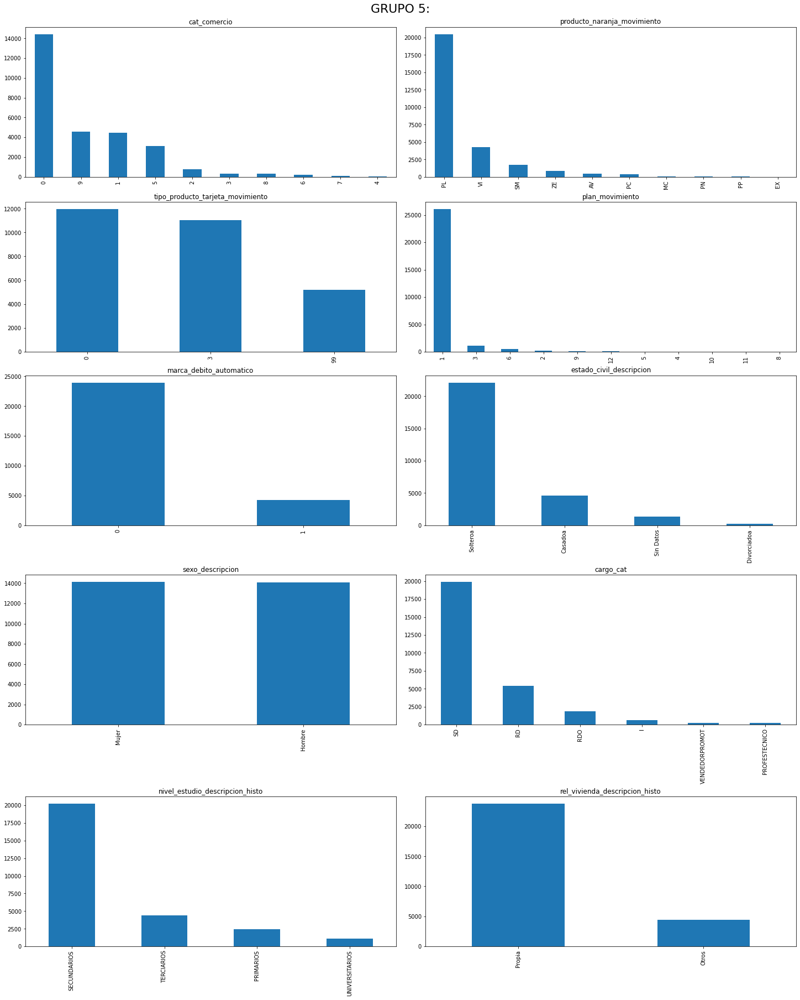

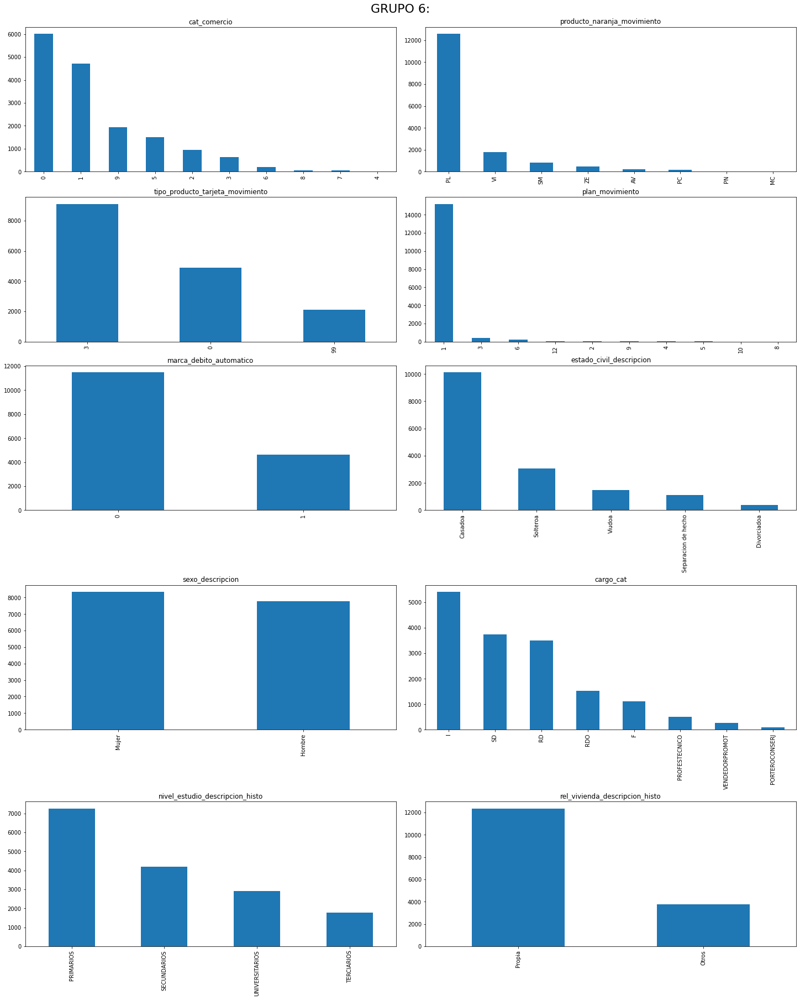

In [68]:
for grupo in range(6):
    df_grupo = df_with_groups[df_with_groups['group'] == grupo]
    title = f'GRUPO {grupo + 1}:'
    show_charts(df_grupo, title)

Comparamos cada categoría entre los distintos grupos

In [69]:
import matplotlib.pyplot as plt

def show_charts_by_group(dataframe, title, categoria):
    filas = 3
    columnas = 2
    fig, ax = plt.subplots(filas,columnas, figsize=(20, 25), constrained_layout=True)
    for i in range(6):
        fila = int(i / columnas)
        columna = i % columnas
        dataframe[dataframe['group'] == i][categoria].value_counts().plot(kind='bar', ax=ax[fila][columna]).set_title(f'Grupo {i + 1}')
    fig.suptitle(title, fontsize=22)
    fig.show()

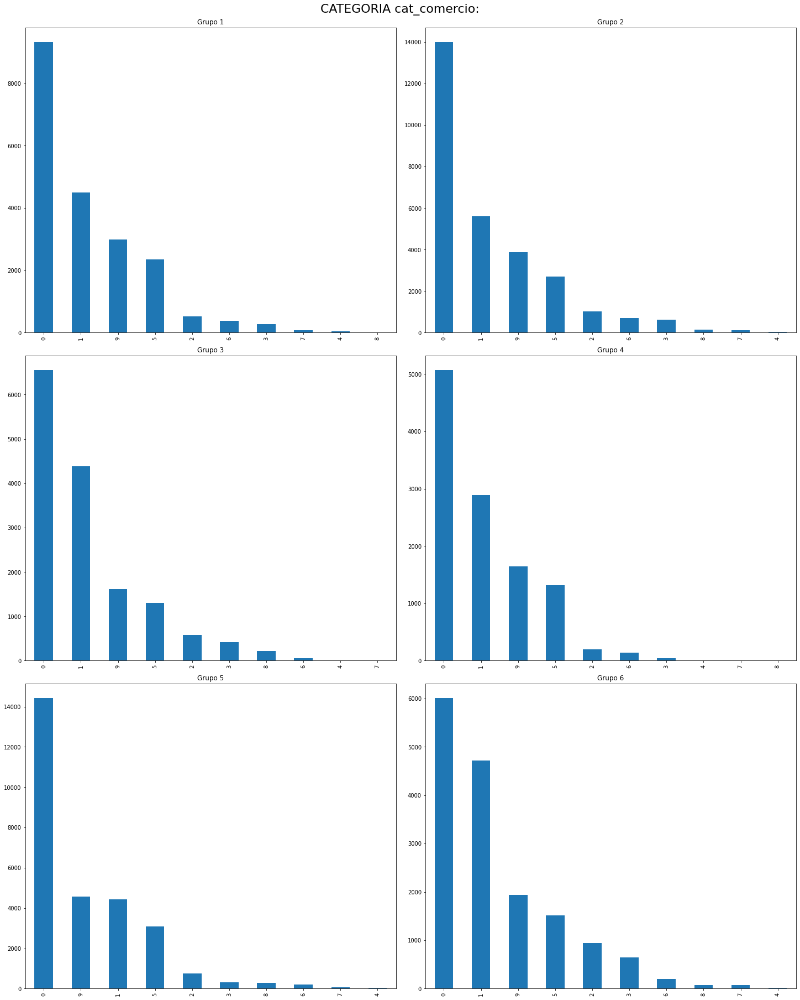

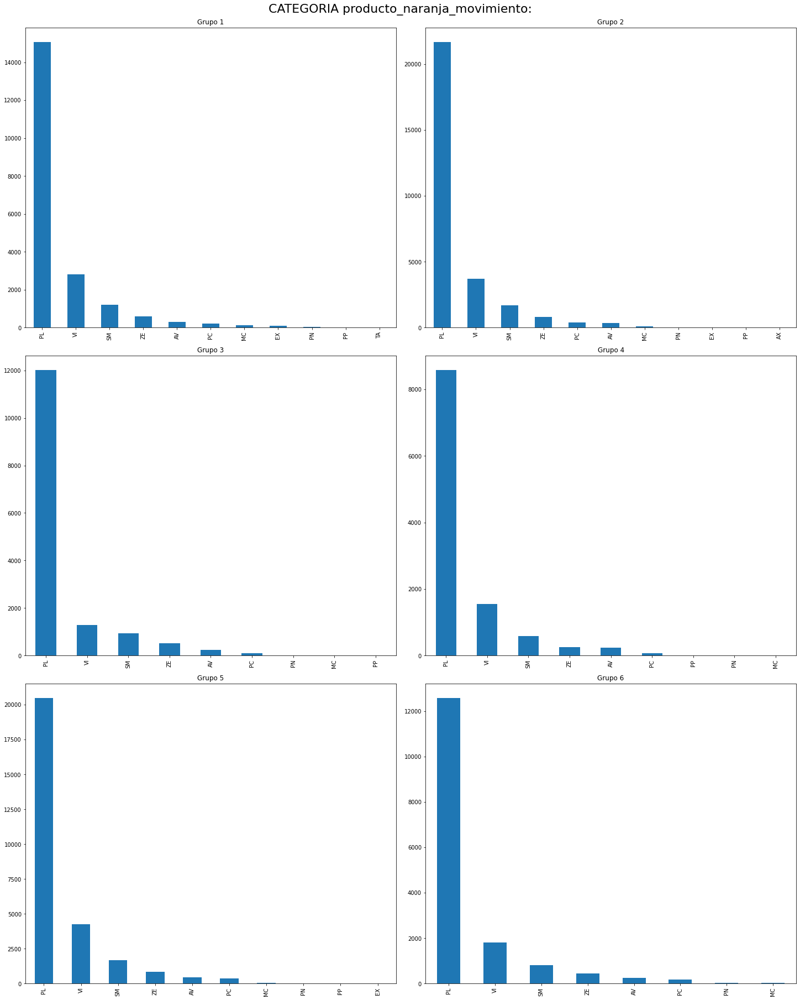

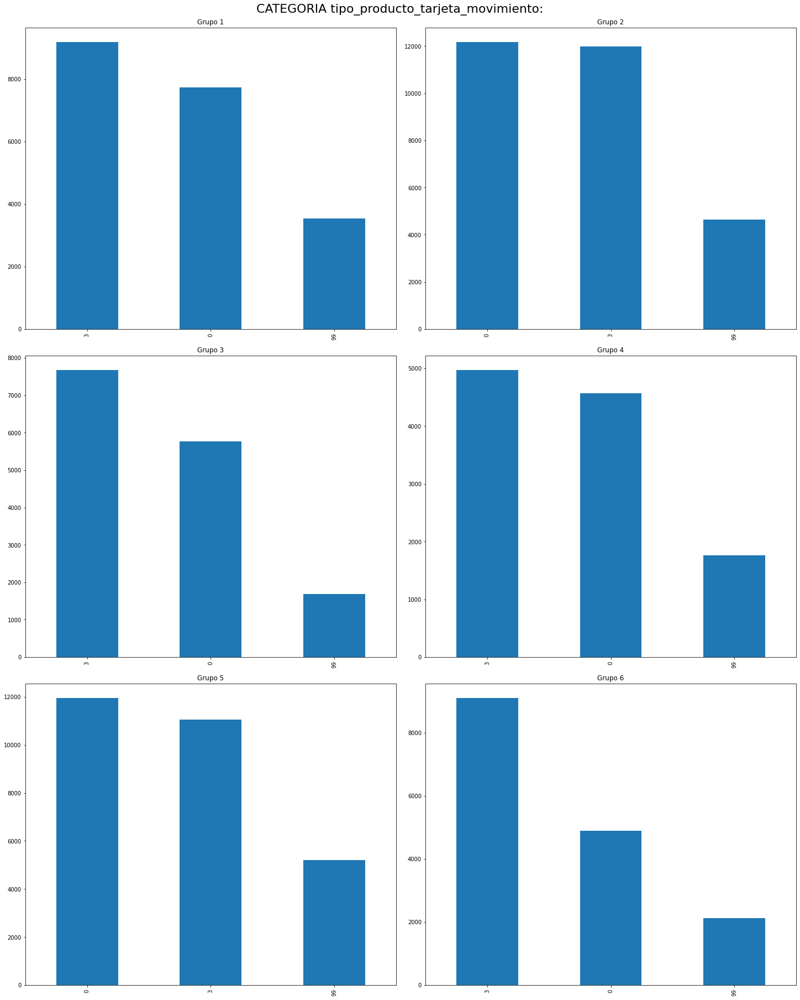

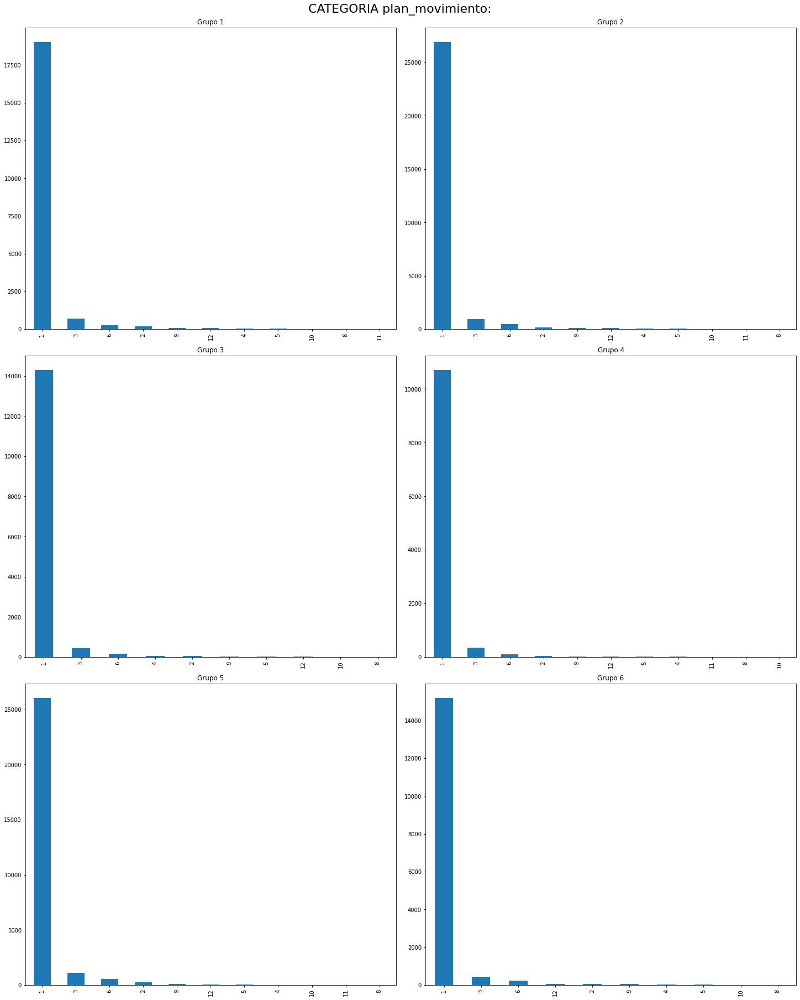

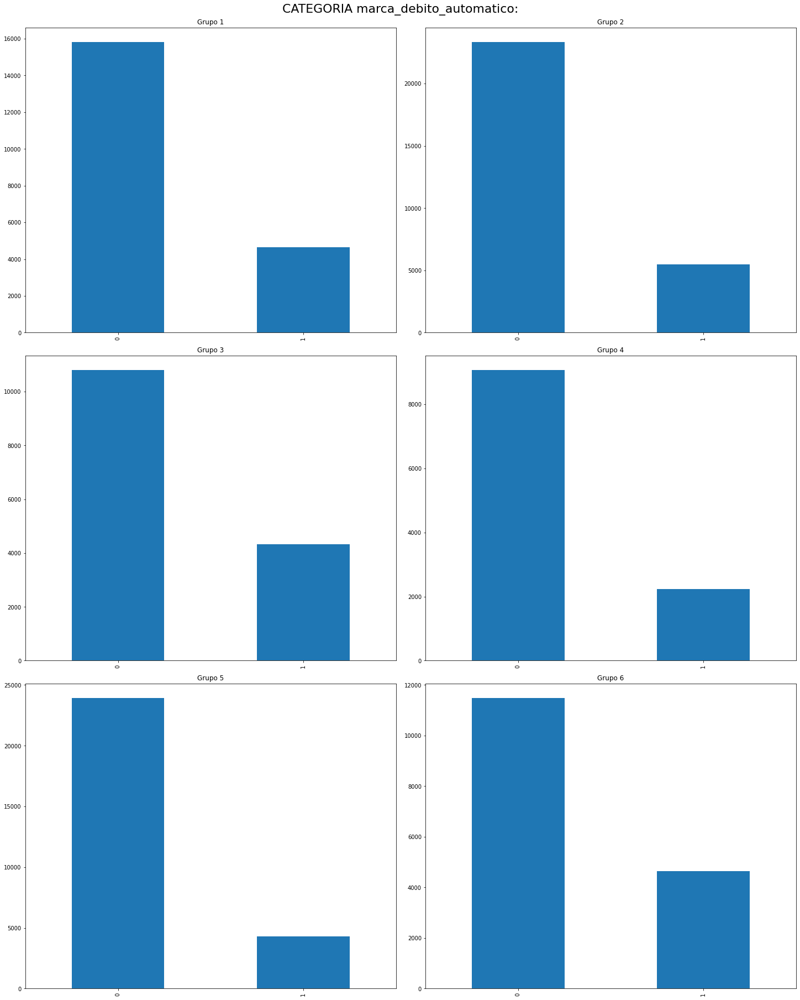

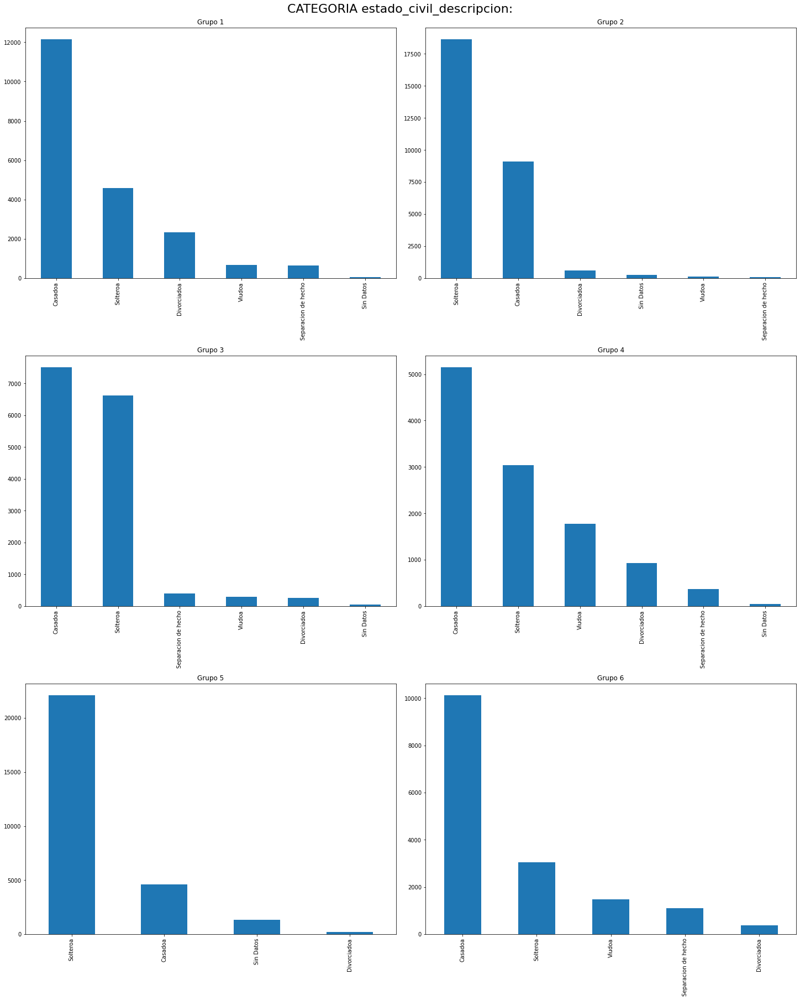

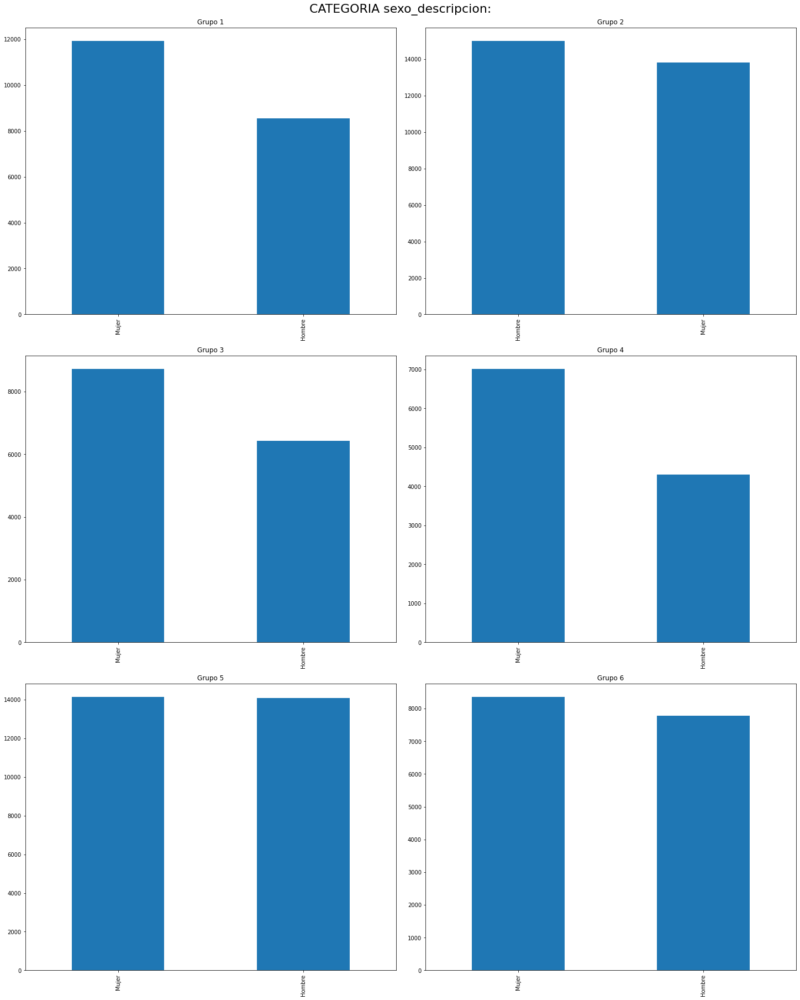

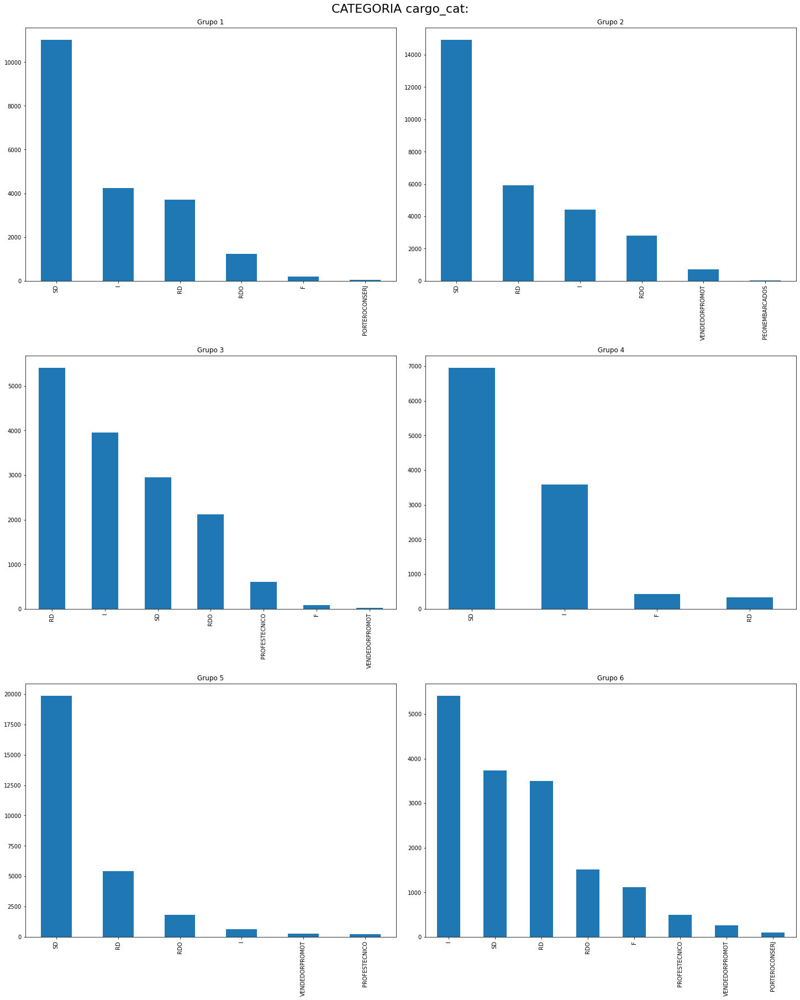

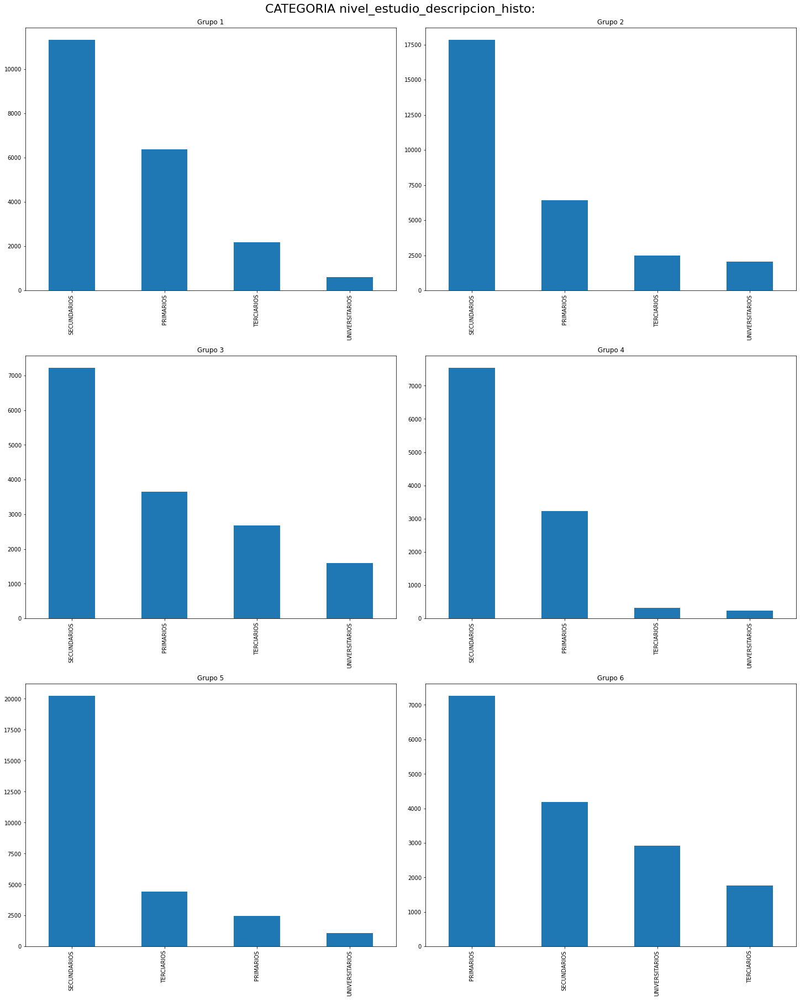

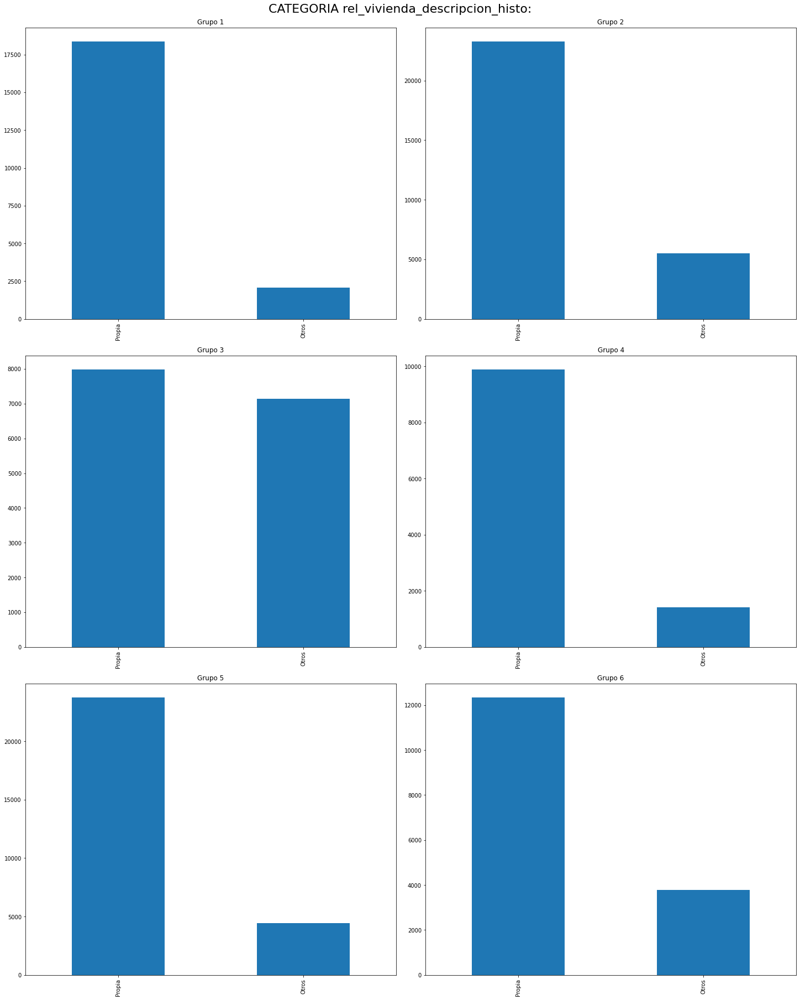

In [70]:
for categoria in categorias:
    title = f'CATEGORIA {categoria}:'
    show_charts_by_group(df_with_groups, title, categoria)

### Conclusiones

Vamos a ordenar los grupos por edad para simplificar el análisis:

| Grupo | Edad prom | Antig prom |
| --- | --- | --- |
| 5 | 30 | 4,7 |
| 2 | 41 | 7 |
| 3 | 48 | 17,5 |
| 1 | 58 | 6,8 |
| 6 | 66 | 19 |
| 4 | 74 | 4,8 |



# Sin montos negativos

Leemos los datos del disco:

In [2]:
df_no_balanceado_sin_neg = pd.read_parquet("/home/mpccolorado/data_no_supervisado_no_balanceado.parquet")

### Eliminamos columnas que no usaremos en el estudio

In [3]:
df_no_balanceado_sin_neg.drop(
    [
        'dni_titular_movimiento',
        'mes-año'
    ],
    axis=1, inplace=True)

In [4]:
df_no_balanceado_sin_neg = df_no_balanceado_sin_neg[df_no_balanceado_sin_neg['monto_normalizado'] > 0]
df_no_balanceado_sin_neg

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,,,,,,
0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120019,5,PL,3,1,3,3954.92,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120020,5,PL,3,1,3,3954.92,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120021,5,PL,3,1,3,290.25,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### Normalizar

Escalamos las variables *monto_normalizado y distancia*:

In [5]:
from sklearn.pipeline import Pipeline

features = df_no_balanceado_sin_neg.columns.to_list()

standard_scaler = StandardScaler()

df_escalado = df_no_balanceado_sin_neg.copy()
df_escalado['monto_normalizado'] = standard_scaler.fit_transform(df_escalado[['monto_normalizado']])
df_escalado['distancia'] = standard_scaler.fit_transform(df_escalado[['distancia']])
df_escalado

,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,...,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,,,,,,
0,0,PL,0,1,8,-0.483178,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,0,PL,0,1,8,-0.453256,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,1,PL,3,1,8,-0.426658,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,0,PL,0,1,8,-0.358507,0,61.0,Divorciadoa,Hombre,...,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,1,PL,3,1,8,-0.426640,1,61.0,Divorciadoa,Hombre,...,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120019,5,PL,3,1,3,0.715582,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120020,5,PL,3,1,3,0.715582,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120021,5,PL,3,1,3,-0.397645,0,28.0,Solteroa,Mujer,...,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### División del DF con datos sólo numéricos

In [6]:
categorias = [
    "cat_comercio",
    "producto_naranja_movimiento",
    "tipo_producto_tarjeta_movimiento",
    "plan_movimiento",
    "marca_debito_automatico",
    "estado_civil_descripcion",
    "sexo_descripcion",
    "cargo_cat",
    "nivel_estudio_descripcion_histo",
    "rel_vivienda_descripcion_histo"
]

In [7]:
df_escalado_ML = df_escalado.copy()
df_escalado_ML.drop(categorias, axis=1, inplace=True)
df_escalado_ML

,mes,monto_normalizado,edad,antig,distancia,incremento_monto,cat_comercio_encoded,producto_naranja_movimiento_encoded,tipo_producto_tarjeta_movimiento_encoded,plan_movimiento_encoded,marca_debito_automatico_encoded,estado_civil_descripcion_encoded,sexo_descripcion_encoded,cargo_cat_encoded,nivel_estudio_descripcion_histo_encoded,rel_vivienda_descripcion_histo_encoded
index,,,,,,,,,,,,,,,,
0,8,-0.483178,61.0,8.0,0.243591,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
1,8,-0.453256,61.0,8.0,0.243591,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
2,8,-0.426658,61.0,8.0,0.243591,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
3,8,-0.358507,61.0,8.0,0.243591,1.0,0.482778,0.491586,0.473416,0.490721,0.513915,0.531528,0.496587,0.476102,0.504269,0.501543
4,8,-0.426640,61.0,8.0,0.243591,1.0,0.476838,0.491586,0.506938,0.490721,0.442667,0.531528,0.496587,0.476102,0.504269,0.501543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120019,3,0.715582,28.0,0.0,-0.075923,1.0,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120020,3,0.715582,28.0,0.0,-0.075923,1.0,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543
120021,3,-0.397645,28.0,0.0,-0.075923,1.0,0.529867,0.491586,0.506938,0.490721,0.513915,0.510251,0.500555,0.519127,0.504269,0.501543


### KMeans con datos originales (con montos positivos)

In [8]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=250, init='random', random_state = 15)
X_tsne_all = tsne.fit_transform(df_escalado_ML)

/home/mpccolorado/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 113801 samples in 0.001s...
[t-SNE] Computed neighbors for 113801 samples in 123.874s...
[t-SNE] Computed conditional probabilities for sample 1000 / 113801
[t-SNE] Computed conditional probabilities for sample 2000 / 113801
[t-SNE] Computed conditional probabilities for sample 3000 / 113801
[t-SNE] Computed conditional probabilities for sample 4000 / 113801
[t-SNE] Computed conditional probabilities for sample 5000 / 113801
[t-SNE] Computed conditional probabilities for sample 6000 / 113801
[t-SNE] Computed conditional probabilities for sample 7000 / 113801
[t-SNE] Computed conditional probabilities for sample 8000 / 113801
[t-SNE] Computed conditional probabilities for sample 9000 / 113801
[t-SNE] Computed conditional probabilities for sample 10000 / 113801
[t-SNE] Computed conditional probabilities for sample 11000 / 113801
[t-SNE] Computed conditional probabilities for sample 12000 / 113801
[t-SNE] Computed conditional proba

Para n_clusters = 4 El silhouette_score promedio es : 0.31526002832491995
Para n_clusters = 6 El silhouette_score promedio es : 0.2980386285532802
Para n_clusters = 8 El silhouette_score promedio es : 0.28003152598558734
Para n_clusters = 10 El silhouette_score promedio es : 0.27088547670098745
Para n_clusters = 12 El silhouette_score promedio es : 0.2779148574296519
Para n_clusters = 14 El silhouette_score promedio es : 0.27382644035112486


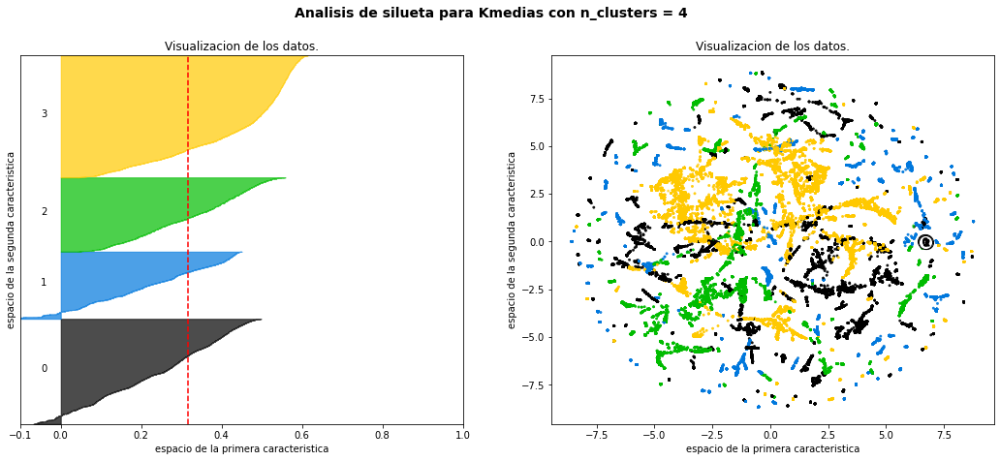

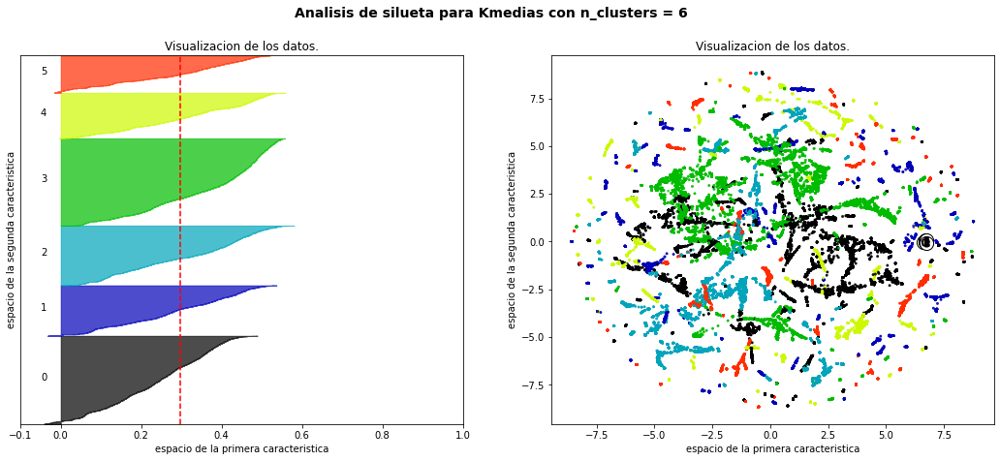

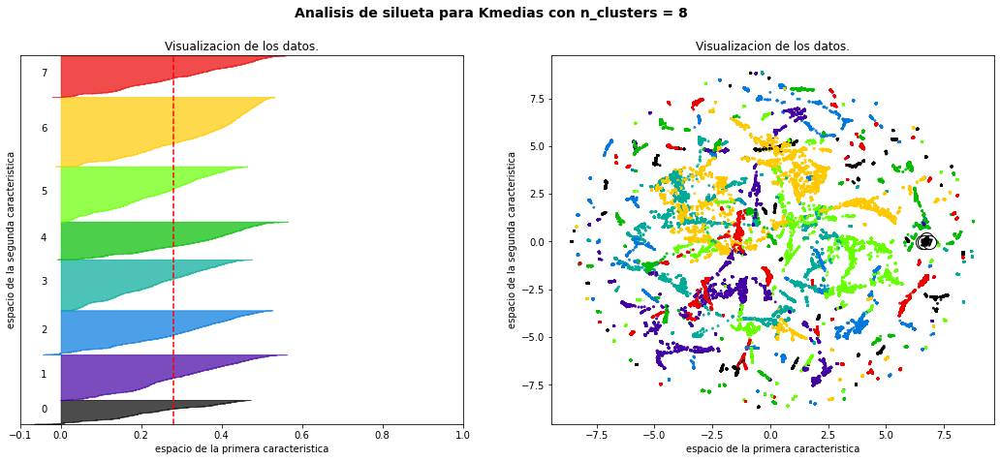

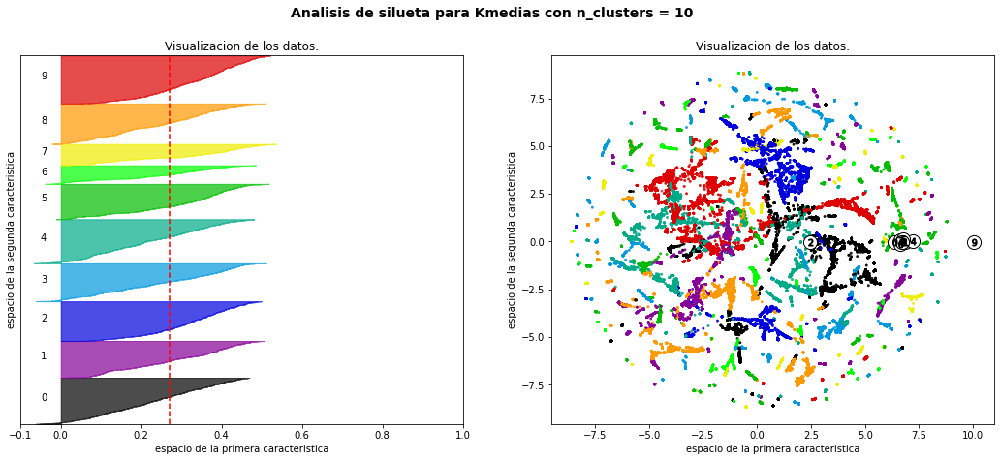

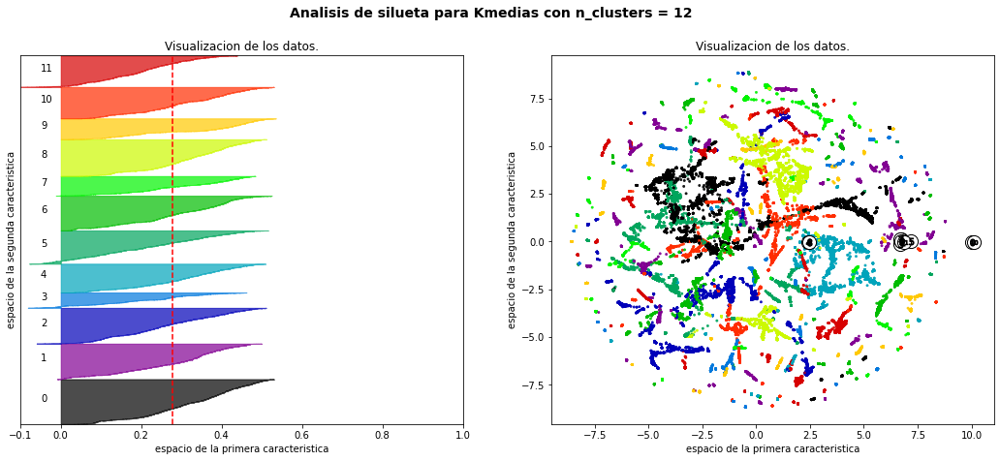

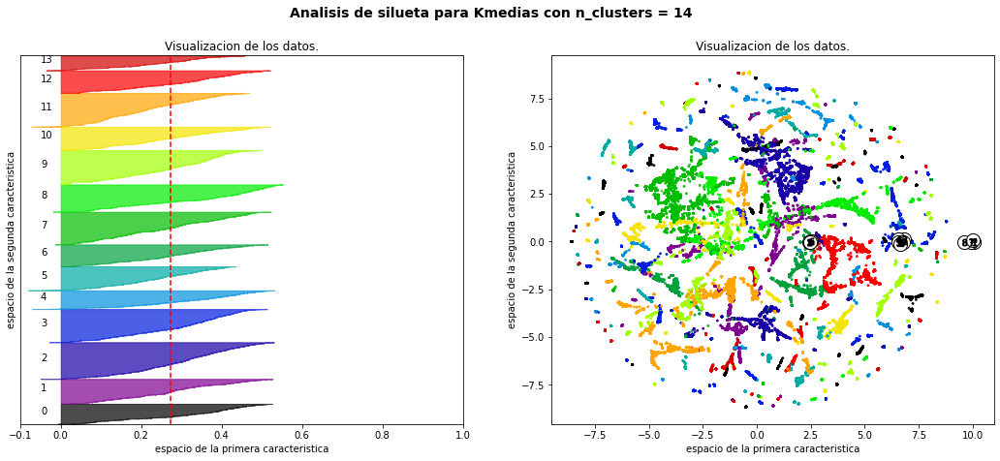

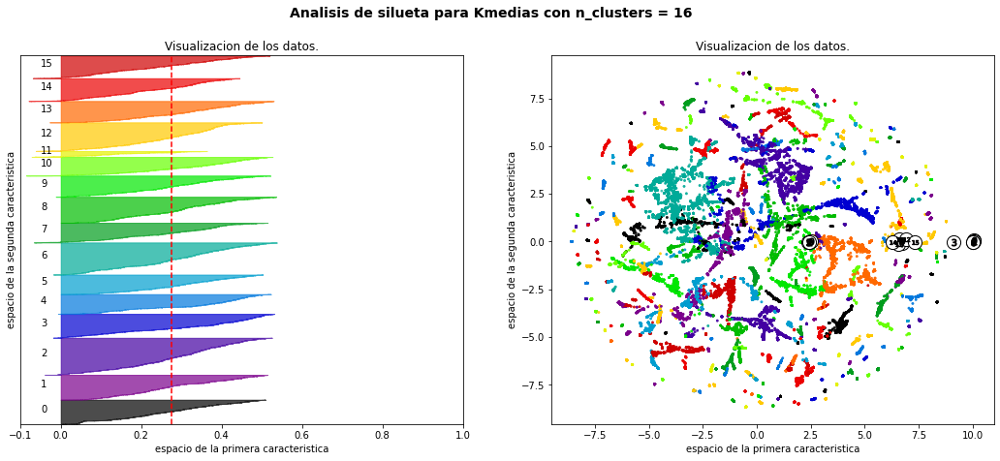

In [9]:
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# con DF- PCA
X = df_escalado_ML

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

In [10]:
sse

{4: 8132674.13527709,
 6: 5903318.843866869,
 8: 4865616.487836802,
 10: 4205763.2094000345,
 12: 3758503.9832734168,
 14: 3436268.79442857,
 16: 3122277.4561099177}

In [11]:
sse.keys()

dict_keys([4, 6, 8, 10, 12, 14, 16])

In [12]:
sse.values()

dict_values([8132674.13527709, 5903318.843866869, 4865616.487836802, 4205763.2094000345, 3758503.9832734168, 3436268.79442857, 3122277.4561099177])

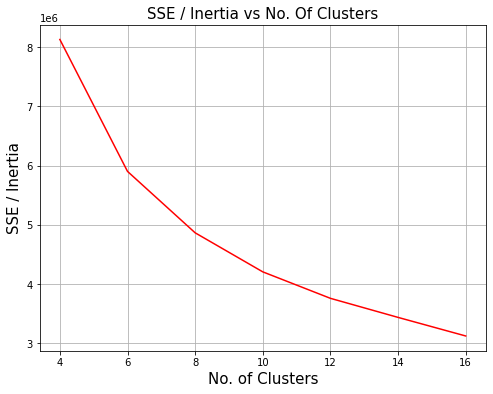

In [13]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(sse.keys(), sse.values(), color='red')
plt.xlabel('No. of Clusters', fontsize=15)
plt.ylabel('SSE / Inertia', fontsize=15)
plt.title('SSE / Inertia vs No. Of Clusters', fontsize=15)
plt.grid()
plt.show()

Podemos ver que alrededor de **6** encontramos un codo donde las diferencias entre los clusters empiezan a bajar significativamente después de este punto

### KMeans con 6 clusters

In [18]:
from sklearn.cluster import KMeans
k=6
kmeans = KMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

In [19]:
df_labels = pd.DataFrame(kmeans.labels_, columns = ['group'])
df_labels

,group
0,0
1,0
2,0
3,0
4,0
...,...
113796,4
113797,4
113798,4
113799,4


In [20]:
X.shape

(113801, 16)

In [29]:
df_with_groups = df_no_balanceado_sin_neg.reset_index().join(df_labels)
for cat in categorias:
    df_with_groups.drop(cat + '_encoded', axis=1, inplace=True)
df_with_groups

,index,cat_comercio,producto_naranja_movimiento,tipo_producto_tarjeta_movimiento,plan_movimiento,mes,monto_normalizado,marca_debito_automatico,edad,estado_civil_descripcion,sexo_descripcion,antig,cargo_cat,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,distancia,incremento_monto,group
0,0,0,PL,0,1,8,8.68,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
1,1,0,PL,0,1,8,107.18,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
2,2,1,PL,3,1,8,194.74,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
3,3,0,PL,0,1,8,419.09,0,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
4,4,1,PL,3,1,8,194.80,1,61.0,Divorciadoa,Hombre,8.0,RD,SECUNDARIOS,Propia,639.367270,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113796,120019,5,PL,3,1,3,3954.92,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4
113797,120020,5,PL,3,1,3,3954.92,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4
113798,120021,5,PL,3,1,3,290.25,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4
113799,120022,0,ZE,3,1,5,3679.00,0,28.0,Solteroa,Mujer,0.0,SD,SECUNDARIOS,Propia,511.810512,1.0,4


### Descripciones de categorías por grupo

Comparamos cada categoría entre los distintos grupos

In [30]:
import matplotlib.pyplot as plt

def show_charts_by_group(dataframe, title, categoria):
    filas = 3
    columnas = 2
    fig, ax = plt.subplots(filas,columnas, figsize=(20, 25), constrained_layout=True)
    for i in range(6):
        fila = int(i / columnas)
        columna = i % columnas
        dataframe[dataframe['group'] == i][categoria].value_counts().plot(kind='bar', ax=ax[fila][columna]).set_title(f'Grupo {i + 1}')
    fig.suptitle(title, fontsize=22)
    fig.show()

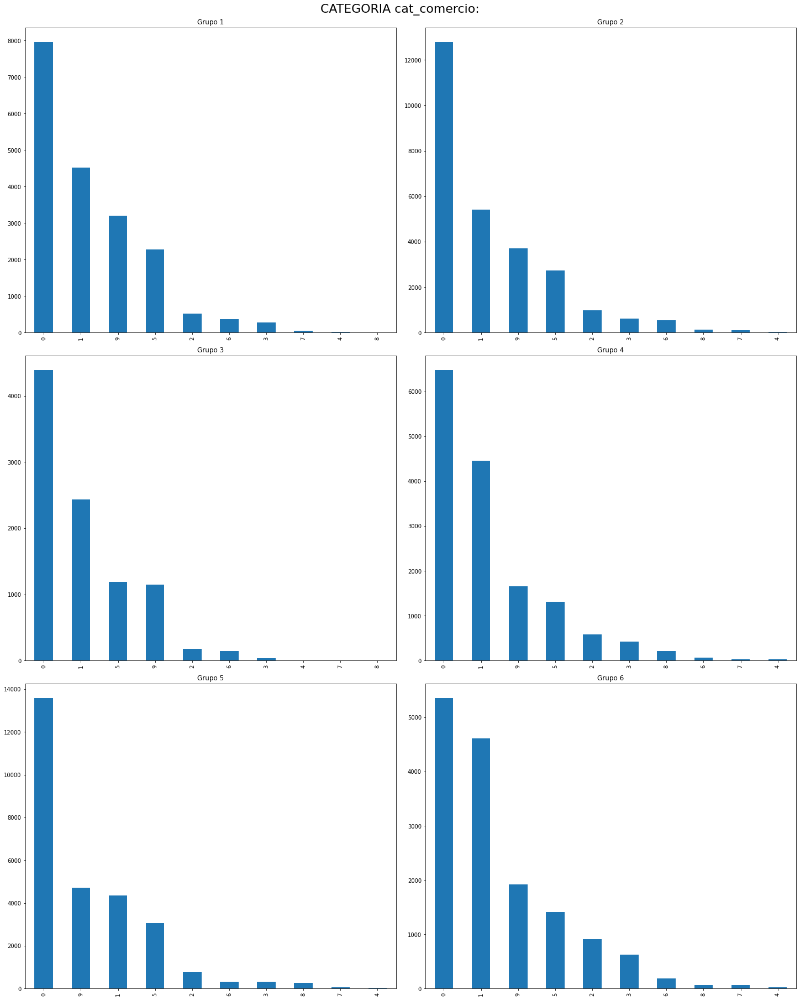

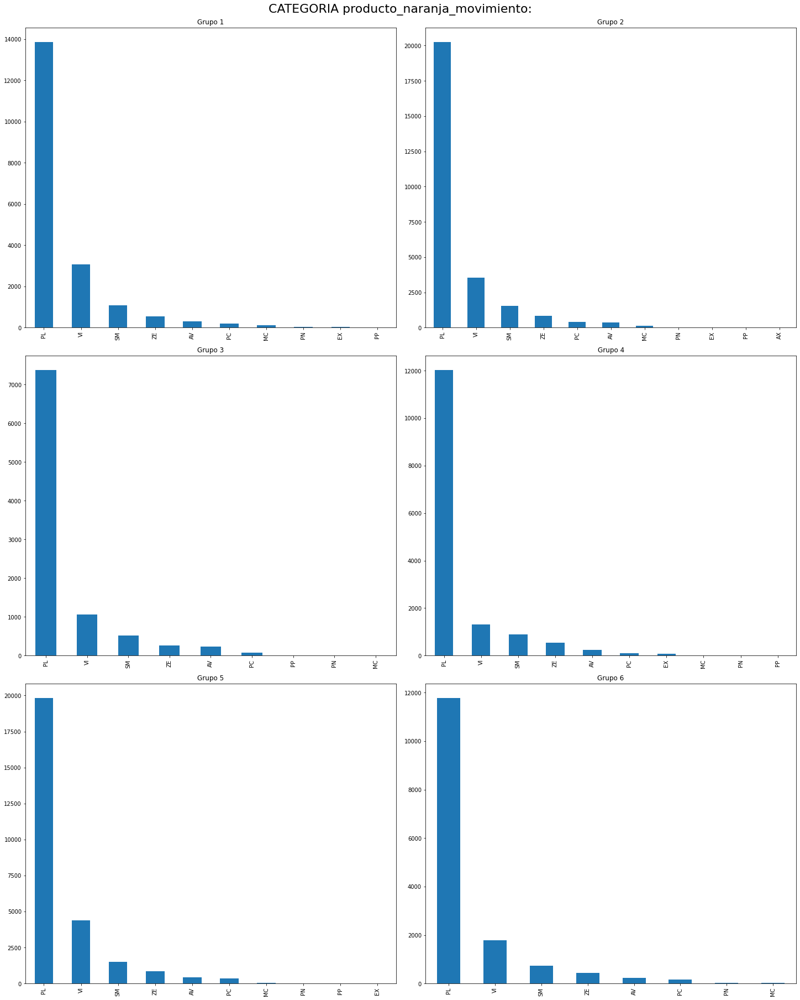

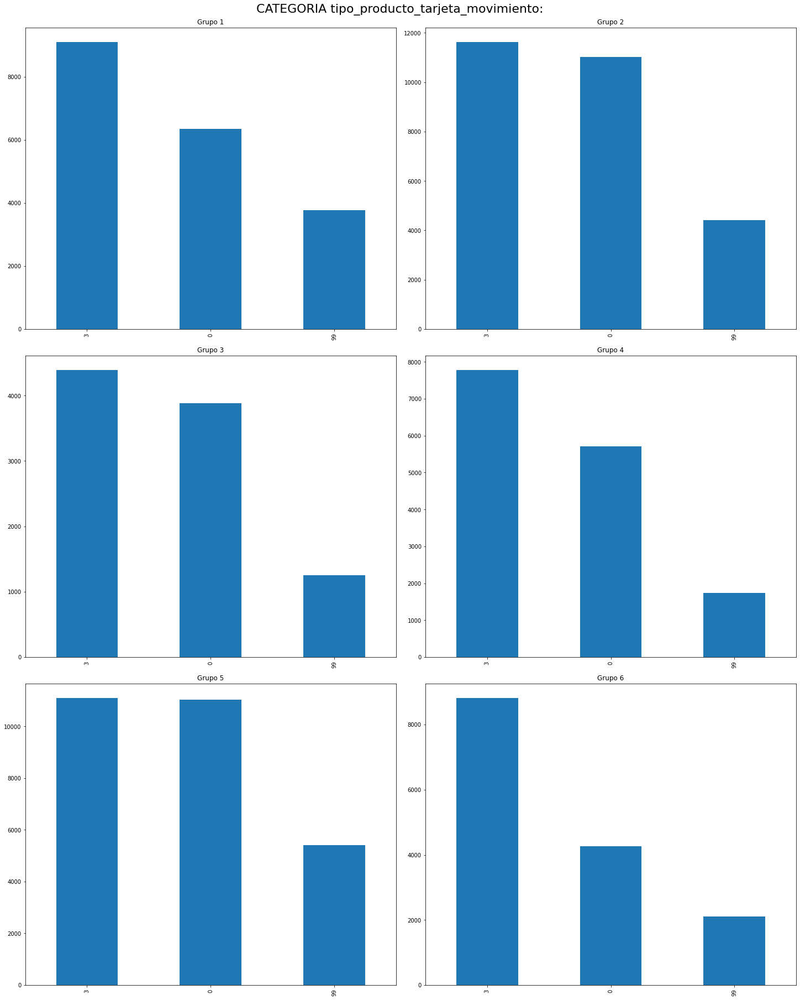

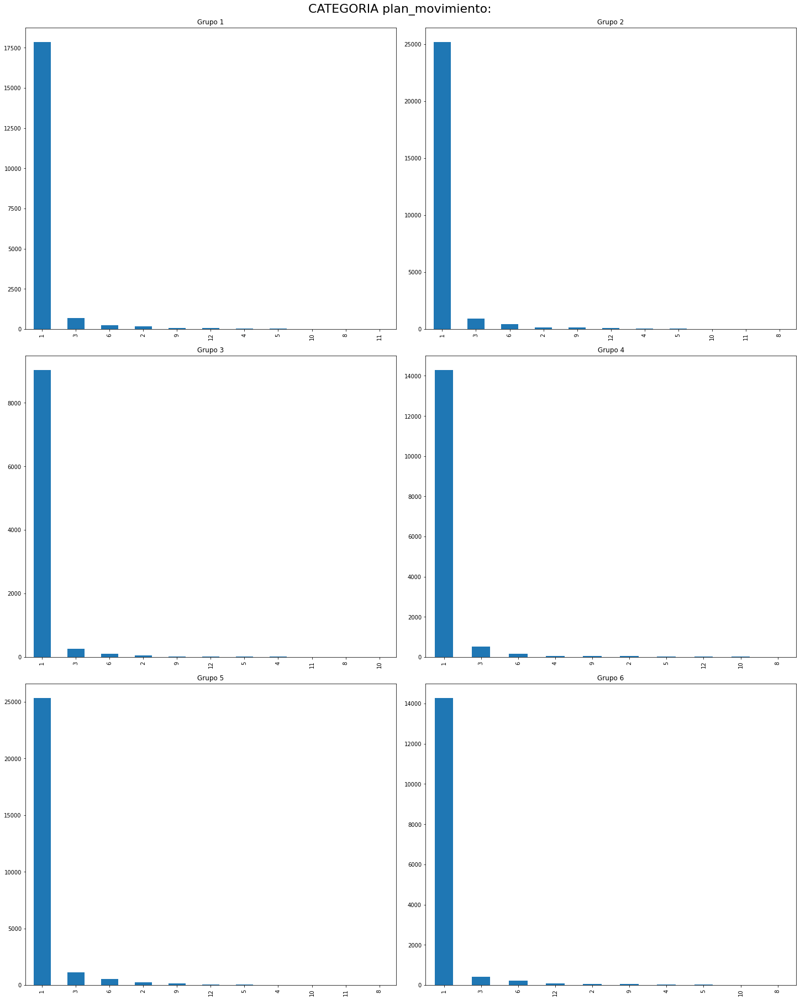

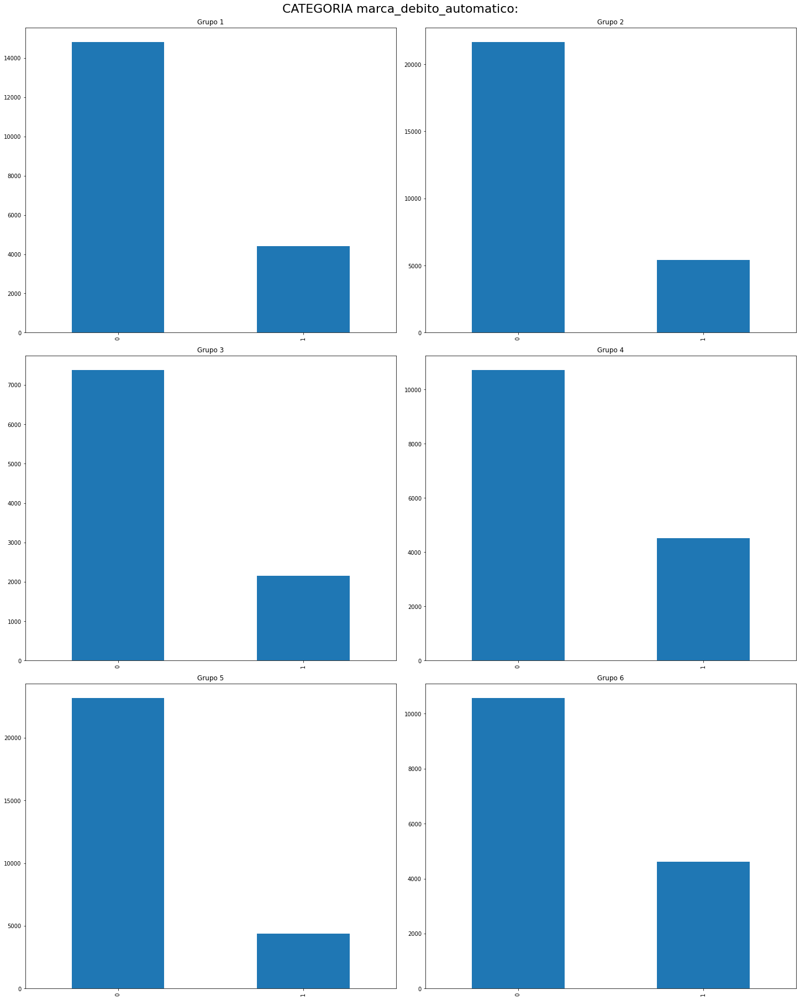

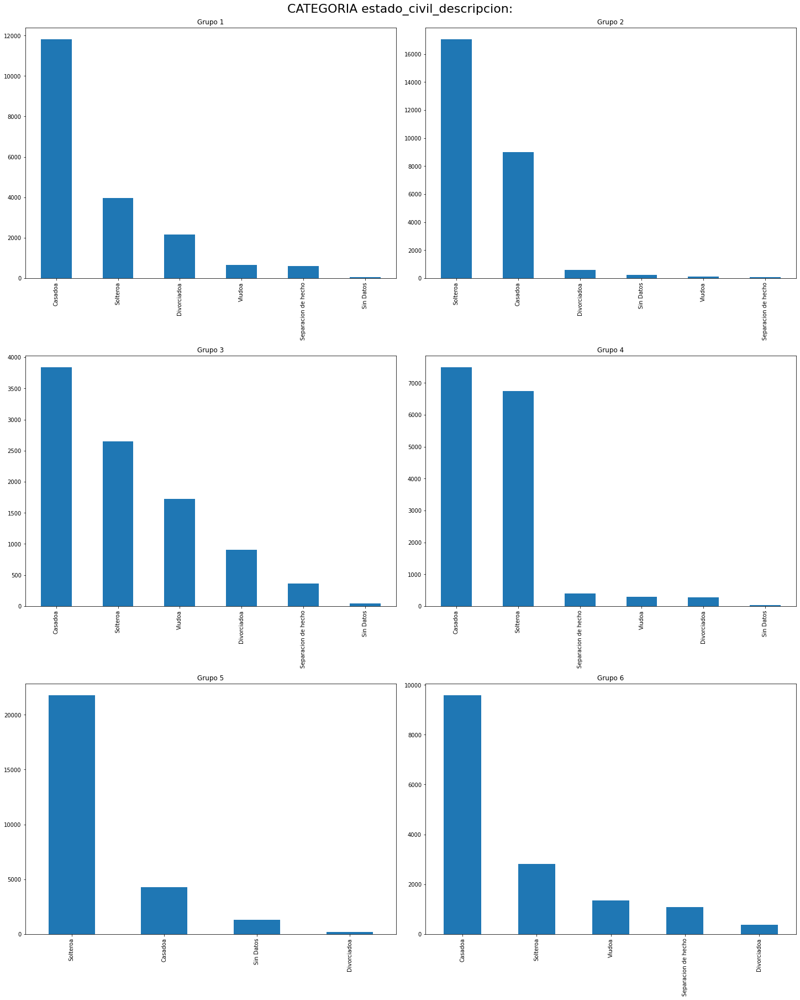

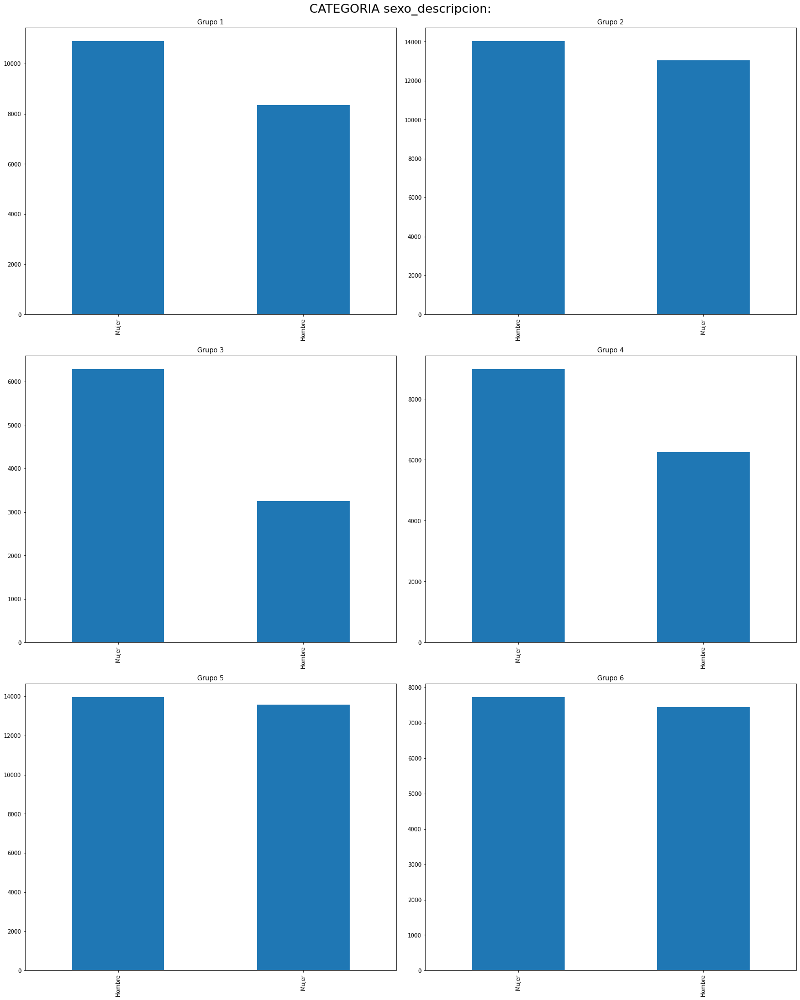

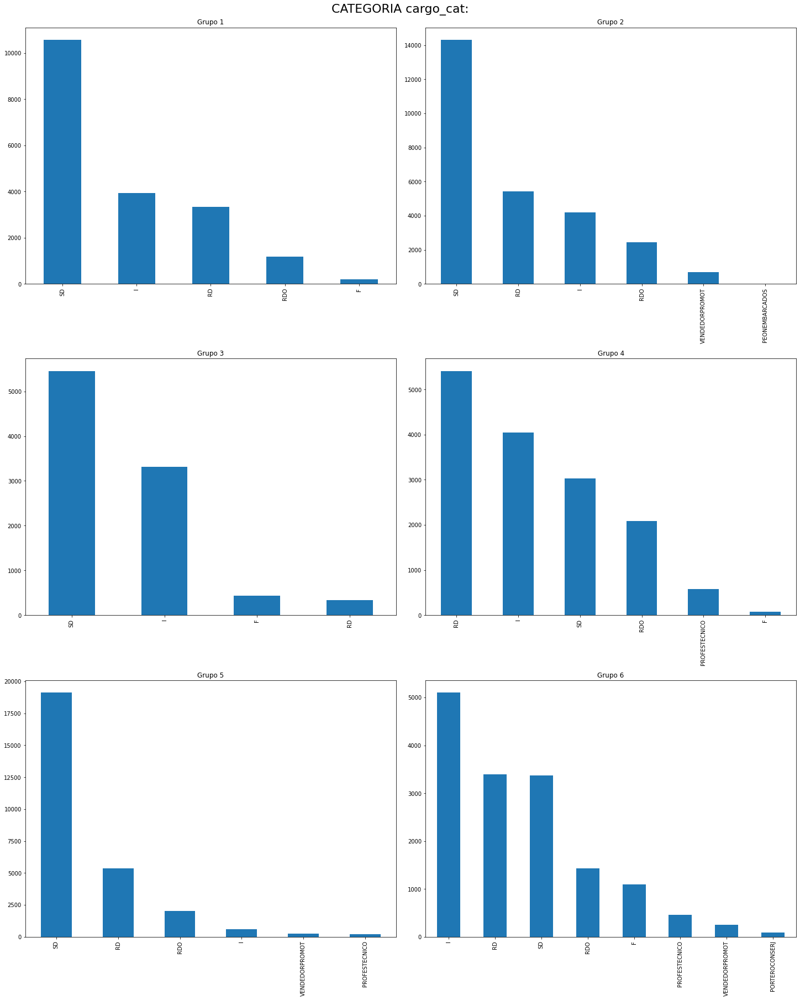

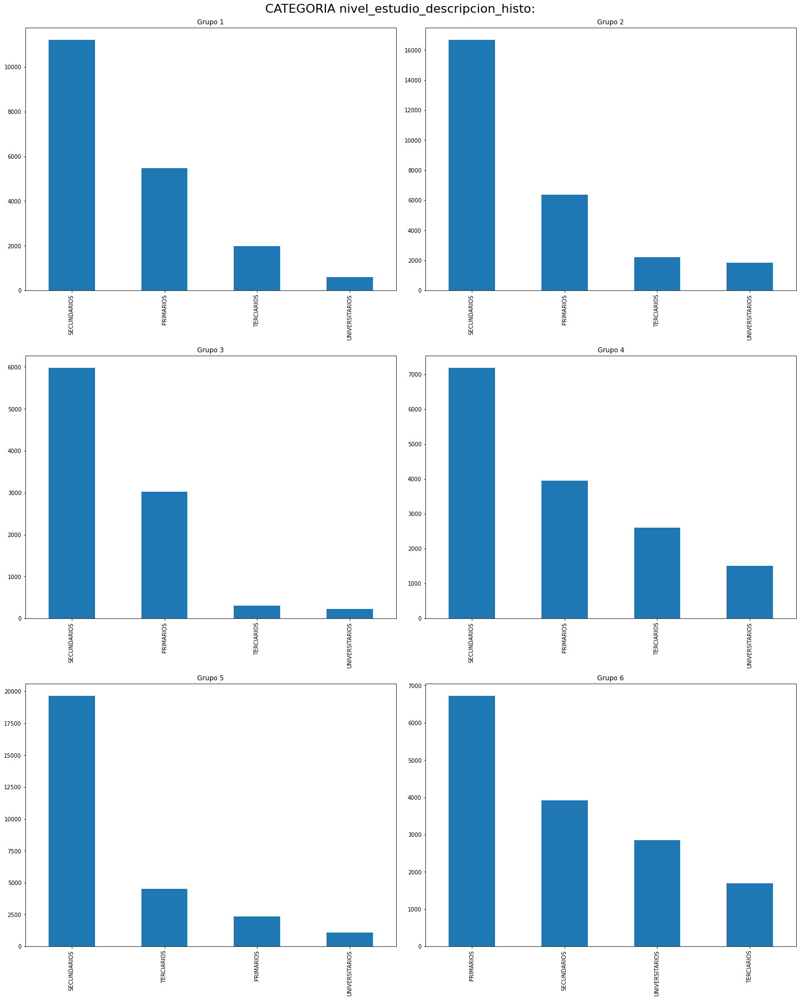

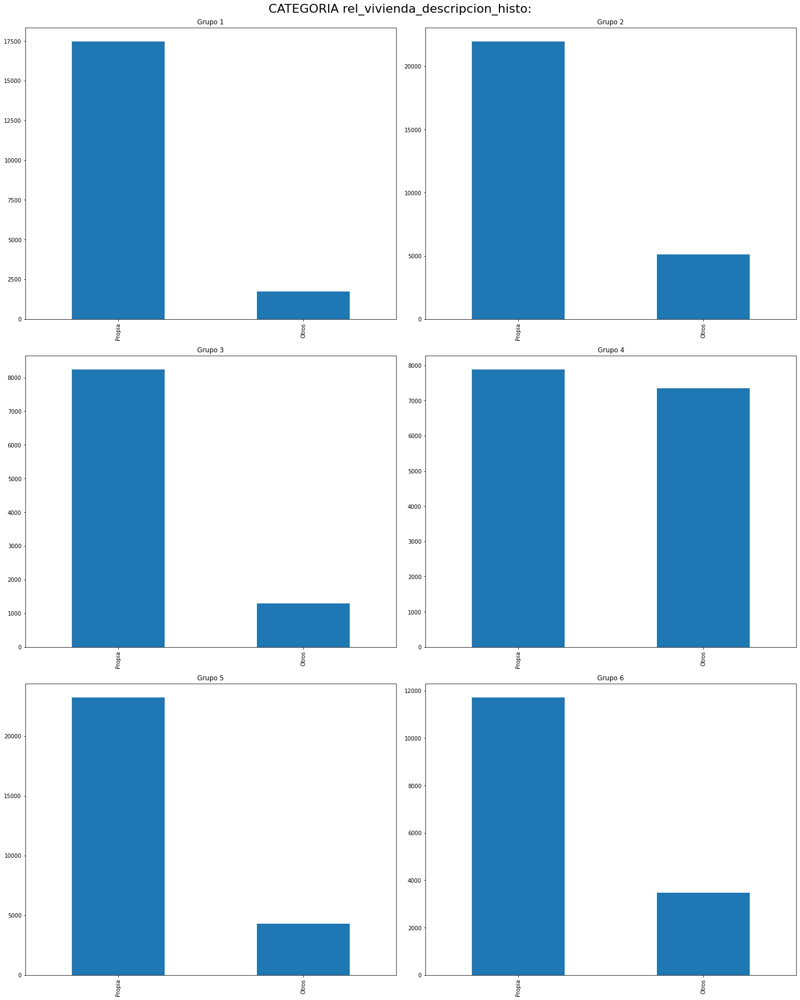

In [31]:
for categoria in categorias:
    title = f'CATEGORIA {categoria}:'
    show_charts_by_group(df_with_groups, title, categoria)

### Descripciones de columnas numéricas por grupo

In [32]:
columnas = df_with_groups.describe().columns.to_list()
columnas.pop()

['index',
 'mes',
 'monto_normalizado',
 'edad',
 'antig',
 'distancia',
 'incremento_monto']

In [34]:
for col_num in columnas:
    print(col_num)
    print(df_with_groups.groupby('group')[col_num].describe(include='all'))
    print('\n')

index
         count          mean           std     min       25%      50%  \
group                                                                   
0      19228.0  65626.459330  36446.936902     0.0  34068.75  78591.5   
1      27078.0  57759.247359  34859.221603  1668.0  26930.25  53748.5   
2       9528.0  57691.765638  32100.453847  1381.0  30385.75  57995.5   
3      15240.0  55023.713976  32834.948096  3761.0  24959.75  54667.5   
4      27543.0  62154.647860  35311.736320   502.0  31693.50  60178.0   
5      15184.0  56938.176567  30438.369027   965.0  36070.75  60819.5   

            75%       max  
group                      
0      99909.25  119869.0  
1      88919.75  119683.0  
2      82054.25  119714.0  
3      78437.25  118677.0  
4      93612.50  120023.0  
5      77130.25  118459.0  


mes
         count      mean       std  min  25%  50%   75%   max
group                                                        
0      19228.0  6.751092  3.916329  1.0  3.0  8.0  10.0

In [35]:
for col_cat in categorias:
    print(col_cat)
    print(df_with_groups.groupby('group')[col_cat].describe(include='all'))
    print('\n')

cat_comercio
       count unique top   freq
group                         
0      19228     10   0   7961
1      27078     10   0  12783
2       9528     10   0   4389
3      15240     10   0   6474
4      27543     10   0  13587
5      15184     10   0   5356


producto_naranja_movimiento
       count unique top   freq
group                         
0      19228     10  PL  13866
1      27078     11  PL  20269
2       9528      9  PL   7381
3      15240     10  PL  12035
4      27543     10  PL  19838
5      15184      8  PL  11784


tipo_producto_tarjeta_movimiento
       count unique top   freq
group                         
0      19228      3   3   9107
1      27078      3   3  11630
2       9528      3   3   4393
3      15240      3   3   7784
4      27543      3   3  11099
5      15184      3   3   8820


plan_movimiento
       count unique top   freq
group                         
0      19228     11   1  17856
1      27078     11   1  25204
2       9528     11   1   9033
3    

### Conclusiones

Vamos a ordenar los grupos por edad para simplificar el análisis:

| Grupo | Edad prom | Antig prom | Monto promedio | % Hombres | % Mujeres |
| --- | --- | --- | --- | --- | --- |
| 5 | 30 | 4,8 | 1518 | 0.5 | 0.5 |
| 2 | 41 | 7 | 1529 | 0.51 | 0.49 |
| 4 | 48 | 17 | 1815 | 0.41 | 0.59 |
| 1 | 59 | 6,5 | 1581 | 0.44 | 0.56 |
| 6 | 66 | 19 | 1868 | 0.50 | 0.50 |
| 3 | 74,9 | 7,7 | 1291 | 0.34 | 0.66 |


* El grupo 5 es el grupo de más jóvenes y de menor antigüedad y está compuesta de la misma proporción de hombres y mujeres.
* El grupo 2 está compuesto en promedio por gente de 41 años con una antigüedad promedio de 7 y tiene casi la misma proporción de hombres y mujeres.
* El grupo 4 tiene una edad promedio de 48 años y una antigüedad de 17 **siendo el segundo grupo con mayor antigüedad**. Está compuesto por casi un 60% de mujeres.
* El grupo 1 tiene una edad promedio de 59 años y una antigüedad promedio de 6 años y medio. Está compuesto por un 56% de mujeres.
* El grupo 6 tiene una edad promedio de 66 años y **es el grupo de mayor antigüedad** con 19 años promedio. Misma cantidad de hombres y mujeres.
* El grupo 3 tiene una edad promedio de casi 75 años, con una antigüedad promedio de 7.7 y tiene un 66% de mujeres.